In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import random
import pandas as pd
import scipy
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib as mpl
from tqdm.auto import tqdm, trange
import json
from multiprocessing import Pool
from functools import partial
from numpy.polynomial import Polynomial
import math
from astropy.coordinates import SkyCoord
import gc
from matplotlib.colors import Normalize
from astropy.visualization import ZScaleInterval
import warnings
warnings.filterwarnings("ignore")

/home/bhanselman/anaconda3/lib/python3.10/site-packages/pandas/core/arrays/masked.py:61: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
os.chdir('/home/bhanselman/bhanselman/scripts')
from normalization_methods import *

In [45]:
xs_ = [[1e-30, 1e-30, 1e-30, 1e-30, 1e-30, 1e-30, 1e-30, 1e-30, 1e-30, 1e-30, 1e-30, 1e-30, 1e-30]]
ys_ = [
    [13.60640872, 14.45358643, 17.31880984, 17.79437343, 9.65728158, 16.3942678, 8.64895006, 5.71471391, 13.98715637, 13.01524627, 9.91308683, 8.96995797, 17.6663782]
]
list([x, y] for x, y in zip(zip(*xs_), zip(*ys_)))

[[(1e-30,), (13.60640872,)],
 [(1e-30,), (14.45358643,)],
 [(1e-30,), (17.31880984,)],
 [(1e-30,), (17.79437343,)],
 [(1e-30,), (9.65728158,)],
 [(1e-30,), (16.3942678,)],
 [(1e-30,), (8.64895006,)],
 [(1e-30,), (5.71471391,)],
 [(1e-30,), (13.98715637,)],
 [(1e-30,), (13.01524627,)],
 [(1e-30,), (9.91308683,)],
 [(1e-30,), (8.96995797,)],
 [(1e-30,), (17.6663782,)]]

In [46]:
list(zip(*ys_))

[(13.60640872,),
 (14.45358643,),
 (17.31880984,),
 (17.79437343,),
 (9.65728158,),
 (16.3942678,),
 (8.64895006,),
 (5.71471391,),
 (13.98715637,),
 (13.01524627,),
 (9.91308683,),
 (8.96995797,),
 (17.6663782,)]

# Finding a clean region

In [ ]:
data_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1'

In [4]:
file = 'HIP44263.npy' #random.choice(os.listdir(data_dir))
file

'HIP44263.npy'

Text(0.5, 1.0, 'HIP44263.npy')

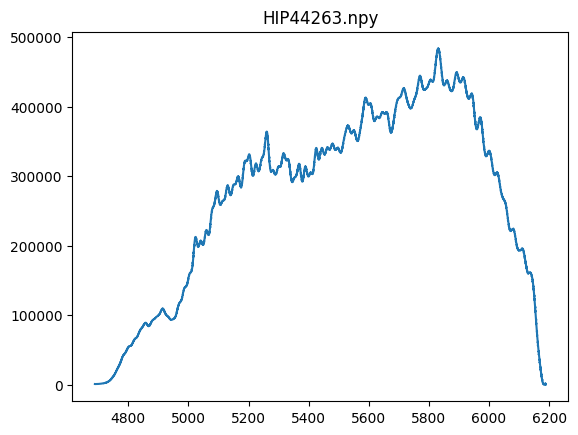

In [5]:
data = np.load(os.path.join(data_dir, file))
plt.plot(*data)
plt.title(file)

## Injections

In [ ]:
def inject_calibrated(name, sig_locs, info, data_dir=None, save_dir=None, calibration_dir=None, signal_sizes=1e-28, is_decay=True, template=False):
    freq, spec = np.load(os.path.join(data_dir, name))
    
    targ_info = info.set_index('source')
    sefd_path = os.path.join(calibration_dir, 'median.npy')
    
    theta = targ_info.loc[name[:-4], 'theta']
    shift_factor = get_shift_factor(theta, v_earth)
        
    if template:
        spec = np.ones_like(spec)
        sefd = spec
    else:
        sefd = np.load(sefd_path)[1]

    if not isinstance(sig_locs, (list, np.ndarray)):
        sig_locs = [sig_locs]

    if not isinstance(signal_sizes, (list, np.ndarray)):
        signal_sizes = [signal_sizes] * len(sig_locs)  
    
    if len(sig_locs) != len(signal_sizes):
        raise ValueError("sig_locs and signal_sizes must have the same length.")

    for sig_loc, signal_size in zip(sig_locs, signal_sizes):
        # Calculate line intensity
        if is_decay:
            sig_std = v_virial*sig_loc/(c*np.sqrt(3))
            sig_amp_ratio = 2.75e24*signal_size / (v_virial*(sig_loc/1e3)**3) # convert MHz to GHz # Units: Jy
            col_name = dm_profile
        else:
            sig_std = v_virial*sig_loc/(c*np.sqrt(6))
            sig_amp_ratio = 9.41e14*signal_size / (v_virial*(sig_loc/1e3)**4) # convert MHz to GHz # Units: Jy
            col_name = dm_profile+'_sq'
        
        # Multiply by line-integrated halo density
        sig_amp = sig_amp_ratio * targ_info.loc[name[:-4], col_name]
        
        # Doppler shift
        sig_loc, sig_std, sig_amp = sig_loc * shift_factor, sig_std * shift_factor, sig_amp / shift_factor
        
        # Add the Gaussian to the spectrum
        g = sig_amp*np.exp(-(freq - sig_loc)**2 / (2*sig_std**2))
        spec = spec * (sefd + g) / sefd
    
    # Save/return the injected spectrum
    injected = np.array([freq, spec])
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        np.save(os.path.join(save_dir, name), injected)
    return injected

In [ ]:
info = pd.read_csv('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/all_cband_info.csv')

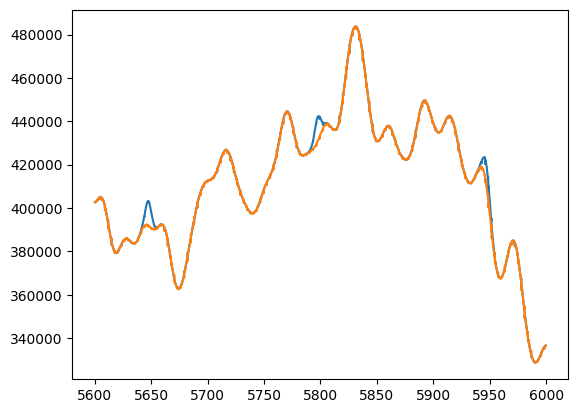

In [ ]:
inj_data = inject_calibrated(
    file,
    [5650, 5800, 5950],
    info,
    data_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1',
    calibration_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/median_sefds/1',
    signal_sizes=3e-29
)
xmin = np.argmin(np.abs(inj_data[0]-5600))
xmax = np.argmin(np.abs(inj_data[0]-6000))

plt.plot(inj_data[0,xmin:xmax], inj_data[1,xmin:xmax])
plt.plot(data[0,xmin:xmax], data[1,xmin:xmax])

# Simple normalization study

In [9]:
ind_xs = np.arange(-3, 4)
print(ind_xs)
weights = [1 if i != 0 else 0 for i in ind_xs]
weights

[-3 -2 -1  0  1  2  3]


[1, 1, 1, 0, 1, 1, 1]

In [ ]:
def normalize_weighted(data, data_dir=None, save_dir=None, a=0.1, b=1, exterior=3, order=5, is_decay=True, **kwargs):
    """
    Standard rolling polynomial normalize procedure. Updated.
    """
    if data_dir:
        xs, ys = np.load(os.path.join(data_dir, data))
    else:
        xs, ys = data
    
    freq_diff = xs[1] - xs[0]
    xs_trimmed, ys_mean = prepare(xs, ys, freq_diff, **kwargs)
    
    new_xs = []
    normalized_spectrum = []
    
    def get_sigma(center):
        if is_decay:
            sigma = v_virial*center/(c*np.sqrt(3))
        else:
            sigma = v_virial*center/(c*np.sqrt(6))
        return sigma
    
    # Loop through the data points and divide each point by the polynomial 
    for x in xs_trimmed:
        i = xs.tolist().index(x)
        window = round_up_to_nearest_odd(2 * exterior * get_sigma(x) / freq_diff)
        
        if i < (window//2): 
            continue
        elif i >= len(xs) - (window//2 + 1):
            break

        ind_xs = np.arange(-(window//2), window//2+1)

        current_ys = ys_mean[i-window//2:i+window//2+1]
        idx = np.isfinite(current_ys)
        
        # Unweighted fit
        #unweighted_params = np.polyfit(ind_xs[idx], current_ys[idx], order)
        unweighted_p = Polynomial.fit(ind_xs[idx], current_ys[idx], order)
        
        # Weighted fit
        if b is None:
            weights = [1 if i != 0 else 0 for i in ind_xs[idx]]
        else:
            sigma = get_sigma(x)
            weights = 1 - a*np.exp(-(freq_diff*ind_xs[idx])**2 / (2*b*sigma**2))
        #weighted_params = np.polyfit(ind_xs[idx], current_ys[idx], order, w=weights)
        weighted_p = Polynomial.fit(ind_xs[idx], current_ys[idx], order, w=weights)

        unweighted = unweighted_p(0) #np.poly1d(unweighted_params)
        weighted = weighted_p(0) #np.poly1d(weighted_params)
        
        new_xs.append(x)
        normalized_spectrum.append(unweighted/weighted)
    
    #new_ys = ys_mean[lower: len(xs)-upper]
    normalized = np.array([new_xs, normalized_spectrum])
    #old = np.array([new_xs, new_ys])
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        np.save(os.path.join(save_dir, data), normalized)
    return normalized

In [11]:
def calculate_snr(inj, uninj, freq, window=10):
    xs, ys_inj = inj
    xs, ys_uninj = uninj
    mask = abs(xs - freq) < window
    window_ys = ys_inj[mask]
    signal = np.max(window_ys) - 1
    print(signal)
    noise = np.std(ys_uninj)
    print(noise)
    return signal / noise

## Single normalized spectrum

### exterior = 3

0.00011108248313229652
8.50134647389006e-06
freq 5650, b=None done
0.0001624692519111015
8.598753369842763e-06
freq 5650, b=0.25 done
0.00015151024874504593
7.92011993604156e-06
freq 5650, b=0.5 done
0.00012896229315373375
6.621377137089861e-06
freq 5650, b=1.0 done
0.00011438324449208892
9.906773554017513e-06
freq 5800, b=None done
0.00017655415602479962
9.647851061894968e-06
freq 5800, b=0.25 done
0.00015915639515950986
8.660479296616846e-06
freq 5800, b=0.5 done
0.00013037031057794302
7.083232194862699e-06
freq 5800, b=1.0 done
0.0001025732990680428
1.0115269943022678e-05
freq 5950, b=None done
0.0001595237277427497
9.721061431852981e-06
freq 5950, b=0.25 done
0.00014312494782764418
8.938317662764555e-06
freq 5950, b=0.5 done
0.00011553529061747447
7.474665692904918e-06
freq 5950, b=1.0 done


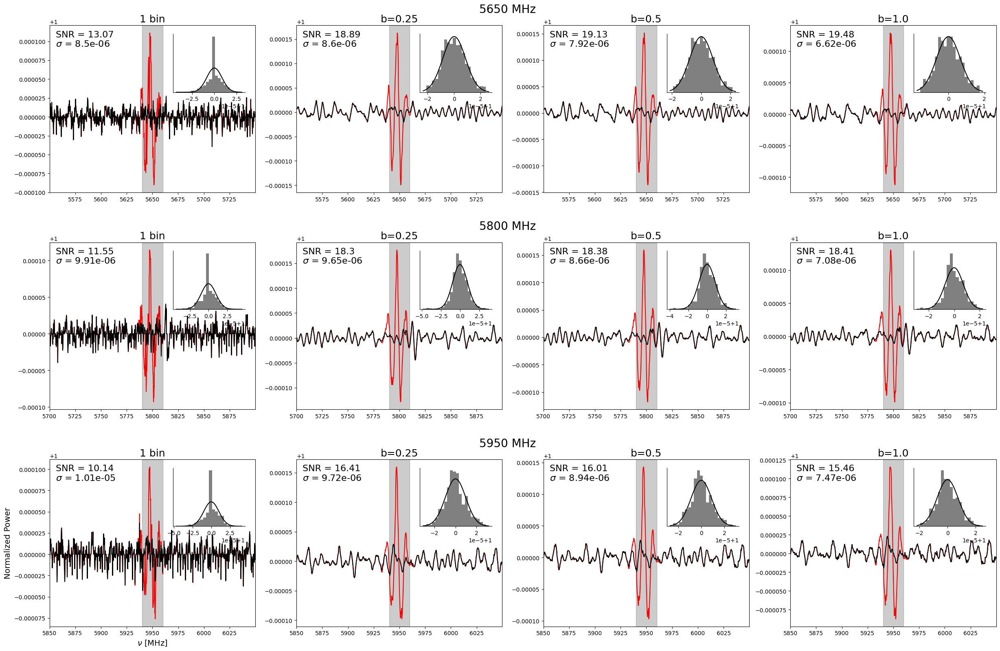

In [12]:
freqs = [5650, 5800, 5950]

fig = plt.figure(figsize=(30,16))
subfigs = fig.subfigures(3, 1, wspace=1)

bs = [None, 0.25, 0.5, 1.0]

for freq, subfig in zip(freqs, subfigs):
    axs = subfig.subplots(1, 4, sharex=True)
    subfig.suptitle(f'{freq} MHz', fontsize=20)
    if freq == freqs[-1]:
        axs[0].set_xlabel(r'$\nu$ [MHz]', fontsize=14)
        axs[0].set_ylabel('Normalized Power', fontsize=14)

    for i, b in enumerate(bs):
        norm_inj = normalize_weighted(
            inj_data,
            freq=freq,
            width=100,
            b=b
        )
        norm_uninj = normalize_weighted(
            data,
            freq=freq,
            width=100,
            b=b
        )

        axs[i].axvspan(freq-10, freq+10, color='k', alpha=0.2)
        axs[i].plot(*norm_inj, color='r')
        axs[i].plot(*norm_uninj, color='k')
        axs[i].set_xlim(min(norm_inj[0]), max(norm_inj[0]))

        snr = calculate_snr(norm_inj, norm_uninj, freq)
        
        ax_inset = axs[i].inset_axes([0.6, 0.6, 0.35, 0.35])
        ax_inset.hist(norm_uninj[1], density=True, color='gray', bins=20)
        mean, std = np.mean(norm_uninj[1]), np.std(norm_uninj[1])
        xmin, xmax = ax_inset.get_xlim()
        x = np.linspace(xmin, xmax, 100)
        p = scipy.stats.norm.pdf(x, mean, std)
        ax_inset.plot(x, p, c='k')
        ax_inset.set_yticks([])
        ax_inset.spines['top'].set_visible(False)
        ax_inset.spines['right'].set_visible(False)

        axs[i].text(0.03, 0.97, f'SNR = {round(snr, 2)}\n$\sigma$ = {f"{std:.3g}"}', transform=axs[i].transAxes, ha='left', va='top', fontsize=16)

        axs[i].set_title(f'b={b}' if b is not None else '1 bin', fontsize=18)
        print(f'freq {freq}, b={b} done')

### exterior = 8

0.0003313641769473463
8.595658878321874e-05
freq 5650, b=None done
0.0007479842051225649
0.0002445322239253066
freq 5650, b=0.25 done
0.0009308836197450265
0.00031482915694555814
freq 5650, b=0.5 done
0.0010247241127789852
0.00037211905336985245
freq 5650, b=1.0 done
0.00017850434701771611
6.396706396542115e-05
freq 5800, b=None done
0.000389350831609514
0.00018835171425457943
freq 5800, b=0.25 done
0.0004325064270767065
0.0002430715178732076
freq 5800, b=0.5 done
0.00043132709747073505
0.0002883607155229791
freq 5800, b=1.0 done
0.0004094416611142293
8.917696719466054e-05
freq 5950, b=None done
0.001009081157583358
0.00027132538924150605
freq 5950, b=0.25 done
0.0012317583392105202
0.00035257225995766645
freq 5950, b=0.5 done
0.0013795404843754966
0.00042303546932816215
freq 5950, b=1.0 done


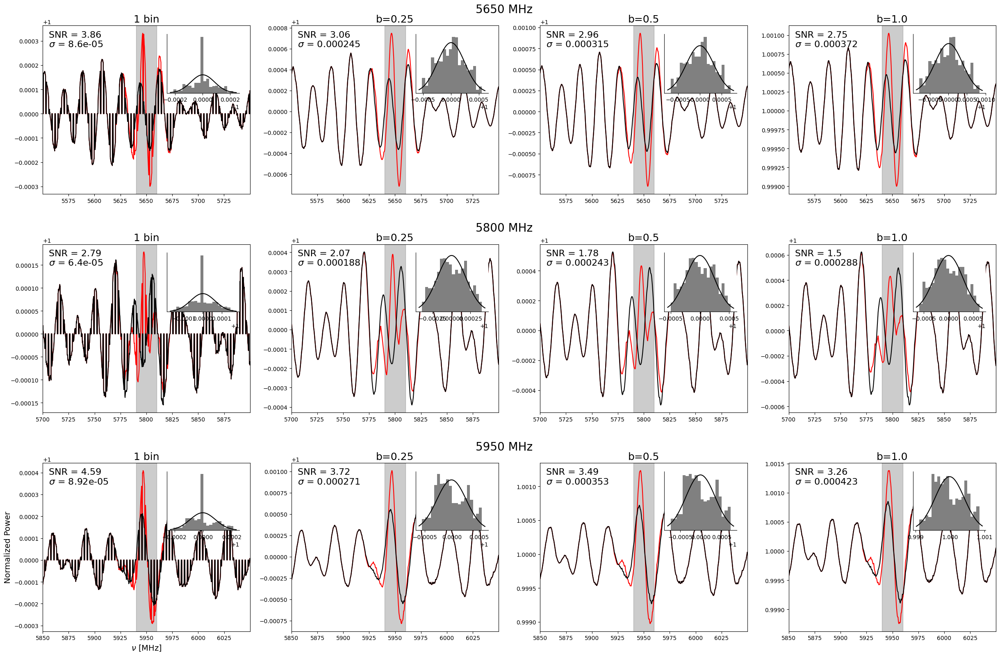

In [13]:
freqs = [5650, 5800, 5950]

fig = plt.figure(figsize=(30,16))
subfigs = fig.subfigures(3, 1, wspace=1)

bs = [None, 0.25, 0.5, 1.0]

for freq, subfig in zip(freqs, subfigs):
    axs = subfig.subplots(1, 4, sharex=True)
    subfig.suptitle(f'{freq} MHz', fontsize=20)
    if freq == freqs[-1]:
        axs[0].set_xlabel(r'$\nu$ [MHz]', fontsize=14)
        axs[0].set_ylabel('Normalized Power', fontsize=14)

    for i, b in enumerate(bs):
        norm_inj = normalize_weighted(
            inj_data,
            freq=freq,
            width=100,
            exterior=8,
            b=b
        )
        norm_uninj = normalize_weighted(
            data,
            freq=freq,
            width=100,
            exterior=8,
            b=b
        )

        axs[i].axvspan(freq-10, freq+10, color='k', alpha=0.2)
        axs[i].plot(*norm_inj, color='r')
        axs[i].plot(*norm_uninj, color='k')
        axs[i].set_xlim(min(norm_inj[0]), max(norm_inj[0]))

        snr = calculate_snr(norm_inj, norm_uninj, freq)
        
        ax_inset = axs[i].inset_axes([0.6, 0.6, 0.35, 0.35])
        ax_inset.hist(norm_uninj[1], density=True, color='gray', bins=20)
        mean, std = np.mean(norm_uninj[1]), np.std(norm_uninj[1])
        xmin, xmax = ax_inset.get_xlim()
        x = np.linspace(xmin, xmax, 100)
        p = scipy.stats.norm.pdf(x, mean, std)
        ax_inset.plot(x, p, c='k')
        ax_inset.set_yticks([])
        ax_inset.spines['top'].set_visible(False)
        ax_inset.spines['right'].set_visible(False)

        axs[i].text(0.03, 0.97, f'SNR = {round(snr, 2)}\n$\sigma$ = {f"{std:.3g}"}', transform=axs[i].transAxes, ha='left', va='top', fontsize=16)

        axs[i].set_title(f'b={b}' if b is not None else '1 bin', fontsize=18)
        print(f'freq {freq}, b={b} done')

### exterior = 3, 1e-29 decay

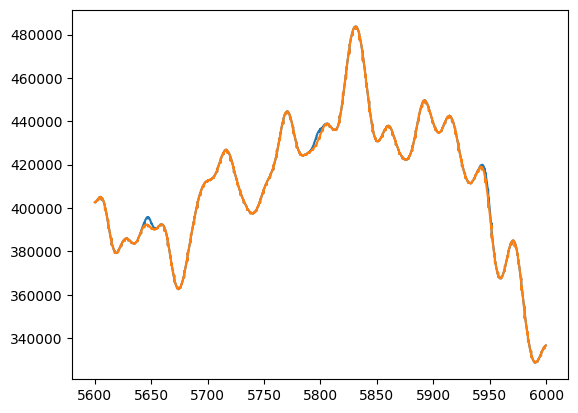

In [ ]:
inj_data = inject_calibrated(
    file,
    [5650, 5800, 5950],
    info,
    data_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1',
    calibration_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/median_sefds/1',
    signal_sizes=1e-29
)
xmin = np.argmin(np.abs(inj_data[0]-5600))
xmax = np.argmin(np.abs(inj_data[0]-6000))

plt.plot(inj_data[0,xmin:xmax], inj_data[1,xmin:xmax])
plt.plot(data[0,xmin:xmax], data[1,xmin:xmax])

4.0873940008845366e-05
8.50134647389006e-06
freq 5650, b=None done
5.102212576413301e-05
8.598753369842763e-06
freq 5650, b=0.25 done
4.843800985132596e-05
7.92011993604156e-06
freq 5650, b=0.5 done
4.368148702127428e-05
6.621377137089861e-06
freq 5650, b=1.0 done
4.896784508301444e-05
9.906773554017513e-06
freq 5800, b=None done
6.288494793960098e-05
9.647851061894968e-06
freq 5800, b=0.25 done
5.633898137014093e-05
8.660479296616846e-06
freq 5800, b=0.5 done
4.6153968194184714e-05
7.083232194862699e-06
freq 5800, b=1.0 done
4.338495335387549e-05
1.0115269943022678e-05
freq 5950, b=None done
5.6467685238370535e-05
9.721061431852981e-06
freq 5950, b=0.25 done
5.225151451693222e-05
8.938317662764555e-06
freq 5950, b=0.5 done
4.503063802441254e-05
7.474665692904918e-06
freq 5950, b=1.0 done


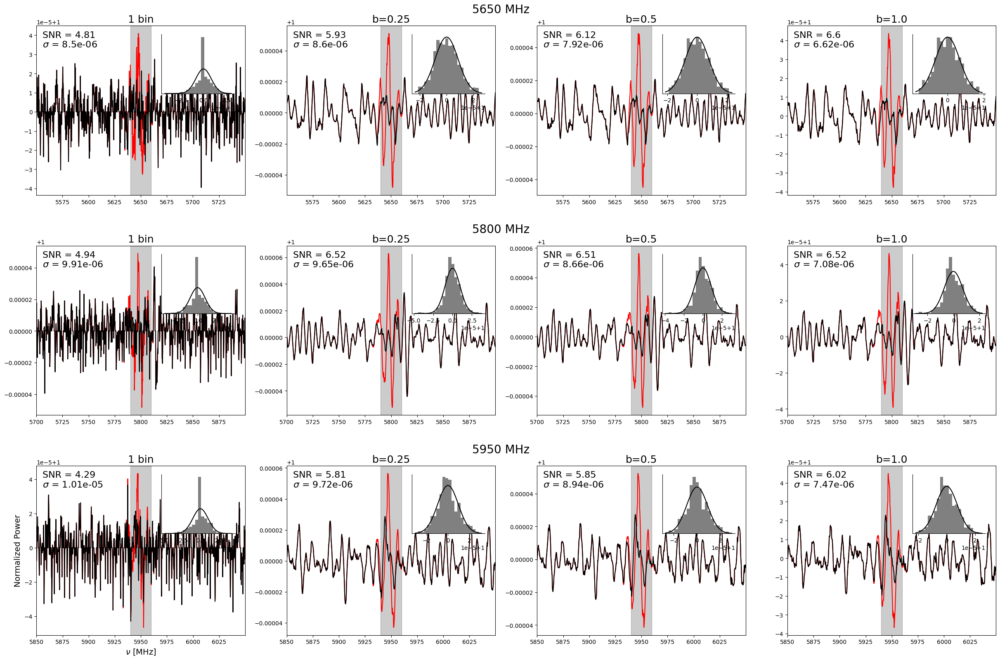

In [15]:
freqs = [5650, 5800, 5950]

fig = plt.figure(figsize=(30,16))
subfigs = fig.subfigures(3, 1, wspace=1)

bs = [None, 0.25, 0.5, 1.0]

for freq, subfig in zip(freqs, subfigs):
    axs = subfig.subplots(1, 4, sharex=True)
    subfig.suptitle(f'{freq} MHz', fontsize=20)
    if freq == freqs[-1]:
        axs[0].set_xlabel(r'$\nu$ [MHz]', fontsize=14)
        axs[0].set_ylabel('Normalized Power', fontsize=14)

    for i, b in enumerate(bs):
        norm_inj = normalize_weighted(
            inj_data,
            freq=freq,
            width=100,
            b=b
        )
        norm_uninj = normalize_weighted(
            data,
            freq=freq,
            width=100,
            b=b
        )

        axs[i].axvspan(freq-10, freq+10, color='k', alpha=0.2)
        axs[i].plot(*norm_inj, color='r')
        axs[i].plot(*norm_uninj, color='k')
        axs[i].set_xlim(min(norm_inj[0]), max(norm_inj[0]))

        snr = calculate_snr(norm_inj, norm_uninj, freq)
        
        ax_inset = axs[i].inset_axes([0.6, 0.6, 0.35, 0.35])
        ax_inset.hist(norm_uninj[1], density=True, color='gray', bins=20)
        mean, std = np.mean(norm_uninj[1]), np.std(norm_uninj[1])
        xmin, xmax = ax_inset.get_xlim()
        x = np.linspace(xmin, xmax, 100)
        p = scipy.stats.norm.pdf(x, mean, std)
        ax_inset.plot(x, p, c='k')
        ax_inset.set_yticks([])
        ax_inset.spines['top'].set_visible(False)
        ax_inset.spines['right'].set_visible(False)

        axs[i].text(0.03, 0.97, f'SNR = {round(snr, 2)}\n$\sigma$ = {f"{std:.3g}"}', transform=axs[i].transAxes, ha='left', va='top', fontsize=16)

        axs[i].set_title(f'b={b}' if b is not None else '1 bin', fontsize=18)
        print(f'freq {freq}, b={b} done')

## Asymmetries (200 random targets)

In [10]:
inner = info[(info['phi'] < 70)]
outer = info[(info['phi'] > 115)]
len(inner), len(outer)

(395, 2220)

In [ ]:
data_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1'

In [12]:
sources = [file[:-4] for file in os.listdir(data_dir)]
bank_info = info[info['source'].isin(sources) & ~info['phi'].between(70,115)]
bank_info

,source,epoch,time,ra,dec,l,b,theta,phi,nfw,nfw_sq,iso,iso_sq,burkert,burkert_sq,moore,moore_sq
0,HIP26505,AGBT18B_999_67,58447_21709,84.5450,51.4460,159.928287,10.503083,70.278665,157.447207,1.020946e+08,5.164261e+14,2.551421e+08,1.168364e+15,8.748690e+07,4.216032e+14,2.231434e+07,2.987899e+13
1,HIP38956,AGBT18B_999_67,58447_29926,119.5538,41.3005,178.734214,29.539403,88.898766,150.435934,1.041950e+08,5.338421e+14,2.579748e+08,1.193159e+15,8.938129e+07,4.357796e+14,2.282110e+07,3.094497e+13
2,HIP24680,AGBT18B_999_67,58447_21287,79.4427,82.2491,130.707811,23.835749,46.100941,126.624918,1.165119e+08,6.425196e+14,2.736638e+08,1.336188e+15,1.004763e+08,5.237526e+14,2.582143e+07,3.766908e+13
3,HIP25749,AGBT18B_999_67,58447_22754,82.4714,53.4326,157.534348,10.457592,67.927336,155.334399,1.026629e+08,5.211065e+14,2.559132e+08,1.175083e+15,8.799945e+07,4.254149e+14,2.245130e+07,3.016514e+13
4,HIP26556,AGBT18B_999_67,58447_27434,84.7019,55.7476,156.185492,12.755920,66.808126,153.160951,1.033052e+08,5.264244e+14,2.567805e+08,1.182667e+15,8.857872e+07,4.297441e+14,2.260622e+07,3.049055e+13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3883,HIP35384,AGBT25A_999_06,60730_36421,109.6401,49.4816,168.090397,24.513450,79.177505,152.908269,1.033837e+08,5.270766e+14,2.568862e+08,1.183594e+15,8.864954e+07,4.302749e+14,2.262517e+07,3.053049e+13
3884,HIP34685,AGBT25A_999_06,60730_37745,107.7123,53.1917,163.820971,24.216778,75.278593,151.149408,1.039528e+08,5.318173e+14,2.576505e+08,1.190305e+15,8.916283e+07,4.341325e+14,2.276258e+07,3.082087e+13
3935,HIP26519,AGBT25A_999_05,60729_21617,84.6624,51.0691,160.295848,10.373524,70.630896,157.828433,1.019979e+08,5.156318e+14,2.550105e+08,1.167220e+15,8.739964e+07,4.209561e+14,2.229104e+07,2.983045e+13
3936,HIP24380,AGBT25A_999_05,60729_24884,78.4605,46.9798,161.500612,4.735081,71.566027,160.924796,1.012769e+08,5.097317e+14,2.540262e+08,1.158682e+15,8.674929e+07,4.161489e+14,2.211744e+07,2.947013e+13


In [19]:
sample = random.sample(list(bank_info['source']), 200)
sample

['HIP26112',
 'HIP51881',
 'HIP50663',
 'HIP22227',
 'HIP11277',
 'HIP16327',
 'HIP90979',
 'HIP3597',
 'HIP38119',
 'HIP27246',
 'HIP26326',
 'HIP3334',
 'HIP23880',
 'HIP7182',
 'HIP37840',
 'HIP20526',
 'HIP40395',
 'HIP14734',
 'HIP11593',
 'HIP51648',
 'HIP9017',
 'HIP23269',
 'HIP10656',
 'HIP37994',
 'HIP26799',
 'HIP29670',
 'HIP22157',
 'HIP78389',
 'HIP40614',
 'HIP11118',
 'HIP77033',
 'HIP26486',
 'HIP7153',
 'HIP51685',
 'HIP45042',
 'HIP34759',
 'HIP40492',
 'HIP19554',
 'HIP21099',
 'HIP74129',
 'HIP28174',
 'HIP72577',
 'HIP23964',
 'HIP1484',
 'HIP3996',
 'HIP97747',
 'HIP43674',
 'HIP36710',
 'HIP16973',
 'HIP12598',
 'HIP98455',
 'HIP38956',
 'HIP43952',
 'HIP19930',
 'HIP7475',
 'HIP26120',
 'HIP33536',
 'HIP21790',
 'HIP18808',
 'HIP26510',
 'HIP44263',
 'HIP22476',
 'HIP41123',
 'HIP10279',
 'HIP31669',
 'HIP18655',
 'HIP1184',
 'HIP75455',
 'HIP32411',
 'HIP105341',
 'HIP24714',
 'HIP31256',
 'HIP28479',
 'HIP5903',
 'HIP85705',
 'HIP44746',
 'HIP53326',
 'HIP182

In [ ]:
sample = []
with open(os.path.join('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/snr_targets_200.txt'), 'r') as file:
    for line in file:
        sample.append(line.strip())
sample

['HIP26112',
 'HIP51881',
 'HIP50663',
 'HIP22227',
 'HIP11277',
 'HIP16327',
 'HIP90979',
 'HIP3597',
 'HIP38119',
 'HIP27246',
 'HIP26326',
 'HIP3334',
 'HIP23880',
 'HIP7182',
 'HIP37840',
 'HIP20526',
 'HIP40395',
 'HIP14734',
 'HIP11593',
 'HIP51648',
 'HIP9017',
 'HIP23269',
 'HIP10656',
 'HIP37994',
 'HIP26799',
 'HIP29670',
 'HIP22157',
 'HIP78389',
 'HIP40614',
 'HIP11118',
 'HIP77033',
 'HIP26486',
 'HIP7153',
 'HIP51685',
 'HIP45042',
 'HIP34759',
 'HIP40492',
 'HIP19554',
 'HIP21099',
 'HIP74129',
 'HIP28174',
 'HIP72577',
 'HIP23964',
 'HIP1484',
 'HIP3996',
 'HIP97747',
 'HIP43674',
 'HIP36710',
 'HIP16973',
 'HIP12598',
 'HIP98455',
 'HIP38956',
 'HIP43952',
 'HIP19930',
 'HIP7475',
 'HIP26120',
 'HIP33536',
 'HIP21790',
 'HIP18808',
 'HIP26510',
 'HIP44263',
 'HIP22476',
 'HIP41123',
 'HIP10279',
 'HIP31669',
 'HIP18655',
 'HIP1184',
 'HIP75455',
 'HIP32411',
 'HIP105341',
 'HIP24714',
 'HIP31256',
 'HIP28479',
 'HIP5903',
 'HIP85705',
 'HIP44746',
 'HIP53326',
 'HIP182

In [15]:
sample_info = bank_info[bank_info['source'].isin(sample)]
inner = sample_info[(sample_info['phi'] < 70)]
outer = sample_info[(sample_info['phi'] > 115)]
len(inner), len(outer)

(24, 176)

In [ ]:
def normalize_wrapper(file, freq=None, b=None, inject=False):
    if inject:
        data = inject_calibrated(
            file,
            freq,
            info,
            data_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1',
            calibration_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/median_sefds/1',
            signal_sizes=1e-29
        )
    else:
        data = np.load(os.path.join(data_dir, file))
    norm = normalize_weighted(
        data,
        freq=freq,
        width=100,
        b=b
    )
    return file[:-4], norm

def build_asymmetry(data_dict):
    sample_info = bank_info[bank_info['source'].isin(sample)]
    inner = sample_info[(sample_info['phi'] < 70)]['source'].tolist()
    outer = sample_info[(sample_info['phi'] > 115)]['source'].tolist()
    
    inner_spectra = [data_dict[source][1] for source in inner]
    outer_spectra = [data_dict[source][1] for source in outer]

    inner_mean = np.mean(inner_spectra, axis=0)
    outer_mean = np.mean(outer_spectra, axis=0)

    xs = data_dict[inner[0]][0]
    asymmetry = (inner_mean - outer_mean) / (inner_mean + outer_mean)
    return xs, asymmetry

In [36]:
def calculate_asymmetry_snr(xs, inj, uninj, freq, window=10):
    mask = abs(xs - freq) < window
    window_ys = inj[mask]
    signal = np.max(window_ys)
    print(signal)
    noise = np.std(uninj)
    print(noise)
    return signal / noise

3.3885780616213656e-05
2.965915703390761e-06
freq 5650, b=None done
5.5186287174803885e-05
3.45525535555029e-06
freq 5650, b=0.25 done
5.0178522393948045e-05
3.024849736274869e-06
freq 5650, b=0.5 done
4.0800753463566e-05
2.383138808568661e-06
freq 5650, b=1.0 done
5.2914101329081324e-05
1.112306151049143e-05
freq 5800, b=None done
4.903934649313095e-05
1.1082363530859251e-05
freq 5800, b=0.25 done
4.893339114101345e-05
9.458498868972709e-06
freq 5800, b=0.5 done
4.3749708975079556e-05
7.436531455115126e-06
freq 5800, b=1.0 done
2.649858777506128e-05
2.9366811446263465e-06
freq 5950, b=None done
3.598056952575588e-05
3.458104200381472e-06
freq 5950, b=0.25 done
3.336646895484936e-05
3.010059095547606e-06
freq 5950, b=0.5 done
2.8551363800486855e-05
2.3700171976845993e-06
freq 5950, b=1.0 done


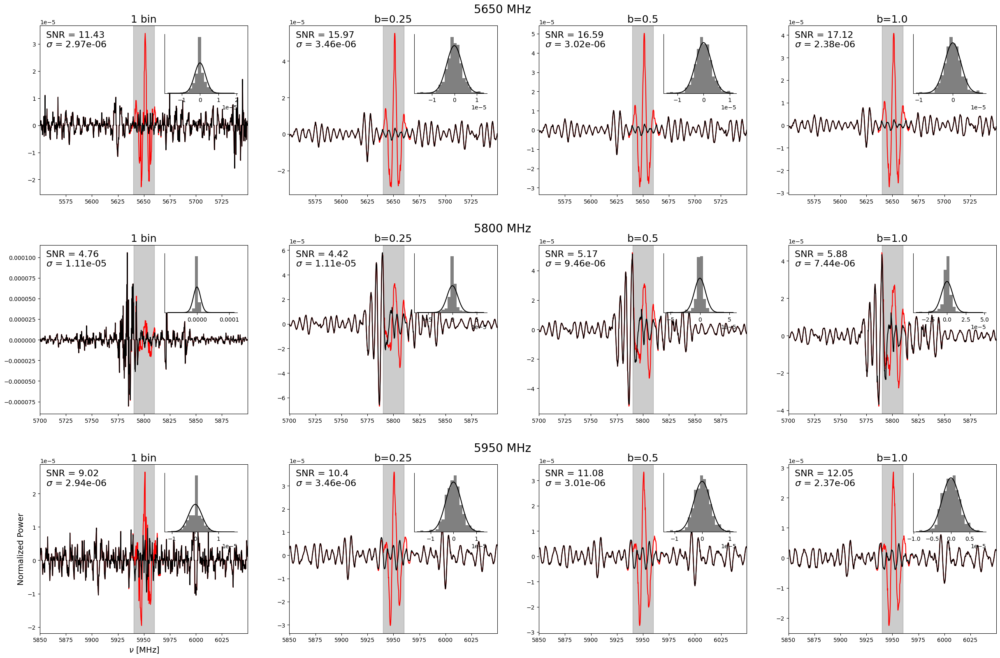

In [38]:
freqs = [5650, 5800, 5950]

fig = plt.figure(figsize=(30,16))
subfigs = fig.subfigures(3, 1, wspace=1)

bs = [None, 0.25, 0.5, 1.0]

sample_files = [name + '.npy' for name in sample]

for freq, subfig in zip(freqs, subfigs):
    axs = subfig.subplots(1, 4, sharex=True)
    subfig.suptitle(f'{freq} MHz', fontsize=20)
    if freq == freqs[-1]:
        axs[0].set_xlabel(r'$\nu$ [MHz]', fontsize=14)
        axs[0].set_ylabel('Normalized Power', fontsize=14)

    for i, b in enumerate(bs):
        with Pool(processes=10) as p:
            norm_inj_partial = partial(normalize_wrapper, freq=freq, b=b, inject=True)
            norm_uninj_partial = partial(normalize_wrapper, freq=freq, b=b, inject=False)
            norm_inj_dict = dict(p.imap_unordered(norm_inj_partial, sample_files))
            norm_uninj_dict = dict(p.imap_unordered(norm_uninj_partial, sample_files))
        
        xs, asymmetry_inj = build_asymmetry(norm_inj_dict)
        xs, asymmetry_uninj = build_asymmetry(norm_uninj_dict)

        axs[i].axvspan(freq-10, freq+10, color='k', alpha=0.2)
        axs[i].plot(xs, asymmetry_inj, color='r')
        axs[i].plot(xs, asymmetry_uninj, color='k')
        axs[i].set_xlim(min(xs), max(xs))

        snr = calculate_asymmetry_snr(xs, asymmetry_inj, asymmetry_uninj, freq)
        
        ax_inset = axs[i].inset_axes([0.6, 0.6, 0.35, 0.35])
        ax_inset.hist(asymmetry_uninj, density=True, color='gray', bins=20)
        mean, std = np.mean(asymmetry_uninj), np.std(asymmetry_uninj)
        xmin, xmax = ax_inset.get_xlim()
        x = np.linspace(xmin, xmax, 100)
        p = scipy.stats.norm.pdf(x, mean, std)
        ax_inset.plot(x, p, c='k')
        ax_inset.set_yticks([])
        ax_inset.spines['top'].set_visible(False)
        ax_inset.spines['right'].set_visible(False)

        axs[i].text(0.03, 0.97, f'SNR = {round(snr, 2)}\n$\sigma$ = {f"{std:.3g}"}', transform=axs[i].transAxes, ha='left', va='top', fontsize=16)

        axs[i].set_title(f'b={b}' if b is not None else '1 bin', fontsize=18)
        print(f'freq {freq}, b={b} done')

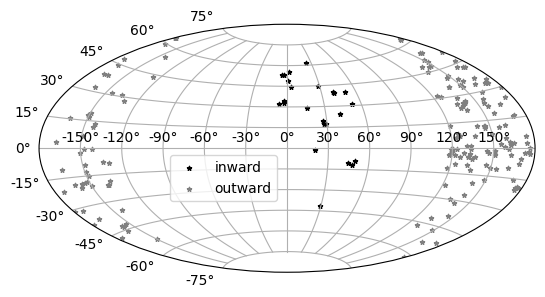

In [17]:
sample_info = bank_info[bank_info['source'].isin(sample)]
inner = sample_info[(sample_info['phi'] < 70)]
outer = sample_info[(sample_info['phi'] > 115)]

from astropy.coordinates import SkyCoord
inner_gal = SkyCoord(inner['l'], inner['b'], unit='deg', frame='galactic')
outer_gal = SkyCoord(outer['l'], outer['b'], unit='deg', frame='galactic')

fig = plt.figure()
ax = fig.add_subplot(111, projection='aitoff')
ax.grid(zorder=0)

inner_sc = ax.scatter(inner_gal.l.wrap_at('180d').radian, inner_gal.b.radian, s=10, marker='*', c='k', label='inward')
outer_sc = ax.scatter(outer_gal.l.wrap_at('180d').radian, outer_gal.b.radian, s=10, marker='*', c='gray', label='outward')

ax.legend(bbox_to_anchor=(0.25, 0.5))

Text(0.5, 1.0, 'Outward')

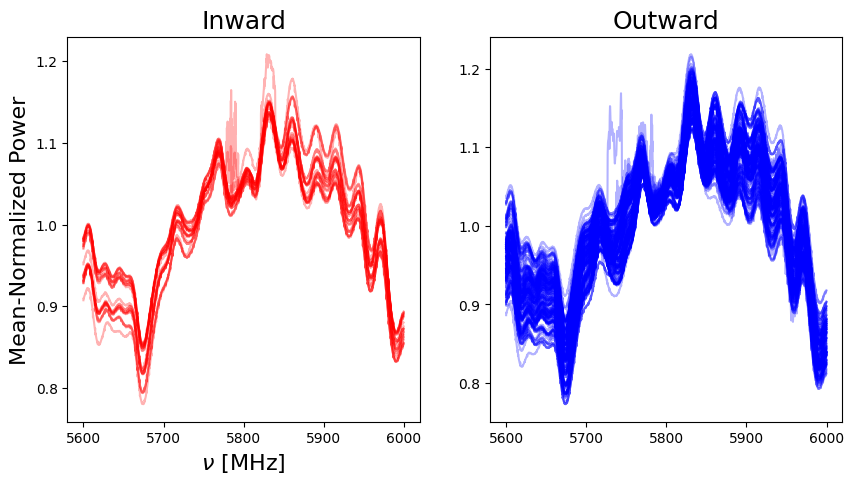

In [22]:
fig, axs = plt.subplots(1, 2, figsize=(10,5))

for name in inner['source']:
    xs, ys = np.load(os.path.join(data_dir, name + '.npy'))
    xmin = np.argmin(np.abs(xs-5600))
    xmax = np.argmin(np.abs(xs-6000))
    xs_, ys_ = xs[xmin:xmax], ys[xmin:xmax] / np.mean(ys[xmin:xmax])
    axs[0].plot(xs_, ys_, c='r', alpha=0.3)

axs[0].set_xlabel(r'$\nu$ [MHz]', fontsize=16)
axs[0].set_ylabel('Mean-Normalized Power', fontsize=16)
axs[0].set_title('Inward', fontsize=18)

for name in outer['source']:
    xs, ys = np.load(os.path.join(data_dir, name + '.npy'))
    xs_, ys_ = xs[xmin:xmax], ys[xmin:xmax] / np.mean(ys[xmin:xmax])
    axs[1].plot(xs_, ys_, c='b', alpha=0.3, label='outward')

axs[1].set_title('Outward', fontsize=18)

**For now, the best parameters are exterior = 3, b = 1.**

# Normalized spectra per session

In [ ]:
data_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01/decay'

info = pd.read_csv('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/all_cband_info.csv')

def convert_to_seconds(l):
    mjd, seconds = l.split('_')
    mjd, seconds = int(mjd), int(seconds)
    return mjd * 86400 + seconds

def plot_epoch_spectra_in_bank(epoch, bank, freqs=None):
    temp = info[info['epoch'] == epoch]
    times = temp['time'].apply(convert_to_seconds)
    times = np.array([time - min(times) for time in times])
    indices = np.argsort(times)
    times = times[indices]
    names = temp['source'].to_numpy()[indices]

    cmap = mpl.colormaps['viridis']
    norm = mpl.colors.Normalize(vmin=min(times), vmax=max(times))

    fig, ax = plt.subplots(figsize=(15,6))
    ypbots = []
    yptops = []
    for name, time in zip(names, times):
        path = os.path.join(data_dir, str(bank), name + '.npy')
        if os.path.exists(path):
            xs, ys = np.load(path)
            if freqs:
                xmin = np.argmin(np.abs(xs - freqs[0]))
                xmax = np.argmin(np.abs(xs - freqs[1]))
                xs = xs[xmin:xmax]
                ys = ys[xmin:xmax]
            ax.plot(xs, ys, color=cmap(norm(time)), alpha=0.3, rasterized=True) #ys/np.max(ys)
            ypbots.append(np.percentile(ys, 5))
            yptops.append(np.percentile(ys, 95))
    
    if len(ypbots):
        ypbot = np.percentile(ypbots, 5)
        yptop = np.percentile(yptops, 95)
        ypad = 0.1 * (yptop - ypbot)
        ax.set_ylim(ypbot-ypad, yptop+ypad)

    cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax)
    cbar.set_label('Time [s]', fontsize=16)

    ax.set_xlabel(r'$\nu$ [MHz]', fontsize=16)
    ax.set_ylabel('Power', fontsize=16)
    ax.set_title(epoch, fontsize=18)

    return fig

In [ ]:
plt.rcParams['path.simplify'] = True
plt.rcParams['path.simplify_threshold'] = 0.5

pdf = PdfPages('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01_normalized_spectra_bank_1.pdf')

epochs = sorted(list(set(info['epoch'])))

for epoch in tqdm(epochs):
    fig = plot_epoch_spectra_in_bank(epoch, 1, freqs=(5000,5200))
    pdf.savefig(fig, bbox_inches='tight')
    plt.close(fig)

pdf.close()

  0%|          | 0/109 [00:00<?, ?it/s]

## Asymmetry comparison

In [35]:
def build_asymmetry(data_dir, info, sample=None):
    spectra = os.listdir(data_dir)

    if sample:
        spectra = [file for file in spectra if file[:-4] in sample]
    
    inner = info[(info['phi'] < 70)]['source'].tolist()
    outer = info[(info['phi'] > 115)]['source'].tolist()
    
    inner_spectra = [np.load(os.path.join(data_dir, file))[1] for file in spectra if file[:-4] in inner]
    outer_spectra = [np.load(os.path.join(data_dir, file))[1] for file in spectra if file[:-4] in outer]

    inner_mean = np.mean(inner_spectra, axis=0)
    outer_mean = np.mean(outer_spectra, axis=0)

    xs = np.load(os.path.join(data_dir, spectra[0]))[0]
    asymmetry = (inner_mean - outer_mean) / (inner_mean + outer_mean)
    return xs, asymmetry

In [ ]:
sample = []
with open(os.path.join('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/snr_targets_200.txt'), 'r') as file:
    for line in file:
        sample.append(line.strip())
sample

['HIP26112',
 'HIP51881',
 'HIP50663',
 'HIP22227',
 'HIP11277',
 'HIP16327',
 'HIP90979',
 'HIP3597',
 'HIP38119',
 'HIP27246',
 'HIP26326',
 'HIP3334',
 'HIP23880',
 'HIP7182',
 'HIP37840',
 'HIP20526',
 'HIP40395',
 'HIP14734',
 'HIP11593',
 'HIP51648',
 'HIP9017',
 'HIP23269',
 'HIP10656',
 'HIP37994',
 'HIP26799',
 'HIP29670',
 'HIP22157',
 'HIP78389',
 'HIP40614',
 'HIP11118',
 'HIP77033',
 'HIP26486',
 'HIP7153',
 'HIP51685',
 'HIP45042',
 'HIP34759',
 'HIP40492',
 'HIP19554',
 'HIP21099',
 'HIP74129',
 'HIP28174',
 'HIP72577',
 'HIP23964',
 'HIP1484',
 'HIP3996',
 'HIP97747',
 'HIP43674',
 'HIP36710',
 'HIP16973',
 'HIP12598',
 'HIP98455',
 'HIP38956',
 'HIP43952',
 'HIP19930',
 'HIP7475',
 'HIP26120',
 'HIP33536',
 'HIP21790',
 'HIP18808',
 'HIP26510',
 'HIP44263',
 'HIP22476',
 'HIP41123',
 'HIP10279',
 'HIP31669',
 'HIP18655',
 'HIP1184',
 'HIP75455',
 'HIP32411',
 'HIP105341',
 'HIP24714',
 'HIP31256',
 'HIP28479',
 'HIP5903',
 'HIP85705',
 'HIP44746',
 'HIP53326',
 'HIP182

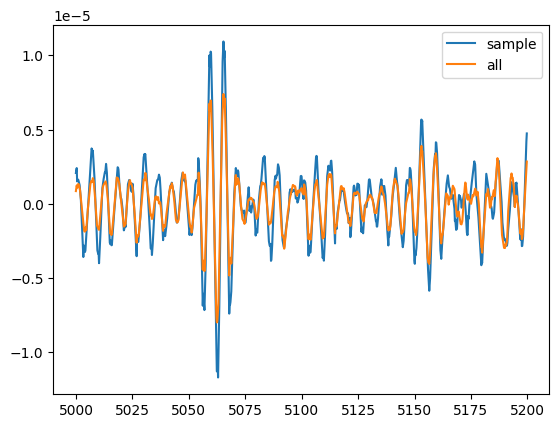

In [ ]:
bank_1_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01/decay/1'

xs, asym_all = build_asymmetry(bank_1_dir, info)
xs, asym_samp = build_asymmetry(bank_1_dir, info, sample=sample)
xmin = np.argmin(np.abs(xs - 5000))
xmax = np.argmin(np.abs(xs - 5200))
xs = xs[xmin:xmax]
plt.plot(xs, asym_samp[xmin:xmax], label='sample')
plt.plot(xs, asym_all[xmin:xmax], label='all')
plt.legend()

In [43]:
np.sqrt(len(os.listdir(bank_1_dir)) / 200)

4.290687590584987

In [44]:
np.std(asym_all) / np.std(asym_samp)

2.1548426020923888

Noise should theoretically improve by factor of 4.29 but only improves by 2.15.

In [49]:
def build_inner_outer(data_dir, info, sample=None):
    spectra = os.listdir(data_dir)

    if sample:
        spectra = [file for file in spectra if file[:-4] in sample]
    
    inner = info[(info['phi'] < 70)]['source'].tolist()
    outer = info[(info['phi'] > 115)]['source'].tolist()
    
    inner_spectra = [np.load(os.path.join(data_dir, file))[1] for file in spectra if file[:-4] in inner]
    outer_spectra = [np.load(os.path.join(data_dir, file))[1] for file in spectra if file[:-4] in outer]

    inner_mean = np.mean(inner_spectra, axis=0)
    outer_mean = np.mean(outer_spectra, axis=0)

    xs = np.load(os.path.join(data_dir, spectra[0]))[0]
    return xs, inner_mean, outer_mean

Text(0.5, 1.0, 'Sample')

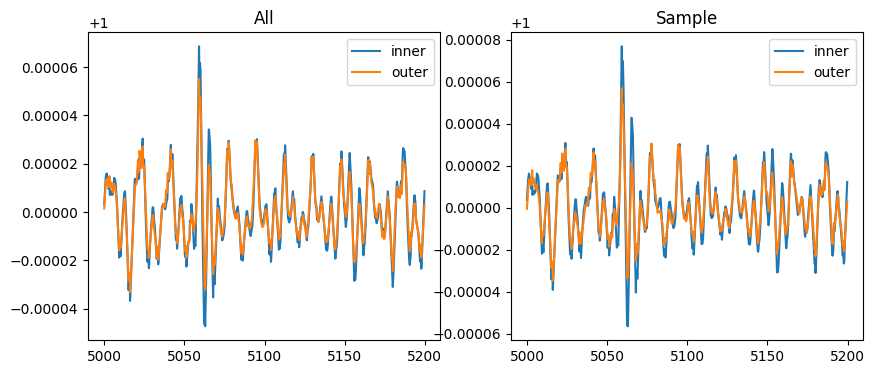

In [54]:
fig, axs = plt.subplots(1, 2, figsize=(10,4))

xs, inner_all, outer_all = build_inner_outer(bank_1_dir, info)
xs = xs[xmin:xmax]
axs[0].plot(xs, inner_all[xmin:xmax], label='inner')
axs[0].plot(xs, outer_all[xmin:xmax], label='outer')
axs[0].legend()
axs[0].set_title('All')

xs, inner_samp, outer_samp = build_inner_outer(bank_1_dir, info, sample=sample)
xs = xs[xmin:xmax]
axs[1].plot(xs, inner_samp[xmin:xmax], label='inner')
axs[1].plot(xs, outer_samp[xmin:xmax], label='outer')
axs[1].legend()
axs[1].set_title('Sample')

## Normalizing gains

In [ ]:
norm_path = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/normalized_gains'
gain_path = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/calibrator_scans_v2'
for bank in range(4):
    save_path = os.path.join(norm_path, str(bank))
    os.makedirs(save_path, exist_ok=True)
    data_path = os.path.join(gain_path, str(bank))
    for epoch in tqdm(os.listdir(data_path), desc=f'Bank {bank}'):
        gain_file_path = os.path.join(data_path, epoch, 'gain.npy')
        gain_data = np.load(gain_file_path)
        norm_gain_data = normalize_weighted(gain_data)
        save_file_path = os.path.join(save_path, f'{epoch}.npy')
        np.save(save_file_path, norm_gain_data)

Bank 0:   0%|          | 0/36 [00:00<?, ?it/s]

Bank 1:   0%|          | 0/36 [00:00<?, ?it/s]

Bank 2:   0%|          | 0/35 [00:00<?, ?it/s]

Bank 3:   0%|          | 0/35 [00:00<?, ?it/s]

### Plotting

In [ ]:
with open('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/time_lookup.json', 'r') as f:
    time_lookup = json.load(f)

In [ ]:
data_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01/decay'
gain_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/normalized_gains'

info = pd.read_csv('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/all_cband_info.csv')

def convert_to_seconds(l):
    mjd, seconds = l.split('_')
    mjd, seconds = int(mjd), int(seconds)
    return mjd * 86400 + seconds

def plot_epoch_spectra_with_gain(epoch, bank, freqs=None):
    temp = info[info['epoch'] == epoch]
    times = temp['time'].apply(convert_to_seconds)
    min_time = min(times)
    times = np.array([time - min(times) for time in times])
    indices = np.argsort(times)
    times = times[indices]
    names = temp['source'].to_numpy()[indices]

    cmap = mpl.colormaps['viridis']
    norm = mpl.colors.Normalize(vmin=min(times), vmax=max(times))

    fig, ax = plt.subplots(figsize=(15,6))
    ypbots = []
    yptops = []
    for name, time in zip(names, times):
        path = os.path.join(data_dir, str(bank), name + '.npy')
        if os.path.exists(path):
            xs, ys = np.load(path)
            if freqs:
                xmin = np.argmin(np.abs(xs - freqs[0]))
                xmax = np.argmin(np.abs(xs - freqs[1]))
                xs = xs[xmin:xmax]
                ys = ys[xmin:xmax]
            ax.plot(xs, ys, color=cmap(norm(time)), alpha=0.3, rasterized=True) #ys/np.max(ys)
            ypbots.append(np.percentile(ys, 5))
            yptops.append(np.percentile(ys, 95))
    
    # Plot normalized gain
    gain_time = convert_to_seconds(time_lookup[epoch])
    gain_path = os.path.join(gain_dir, str(bank), f'{epoch}.npy')
    xs, ys = np.load(gain_path)
    if freqs:
        xmin = np.argmin(np.abs(xs - freqs[0]))
        xmax = np.argmin(np.abs(xs - freqs[1]))
        xs = xs[xmin:xmax]
        ys = ys[xmin:xmax]
    ax.plot(xs, ys, color='r', rasterized=True, label=f'gain; t={gain_time - min_time}s') # Time difference between cal scan and first epoch obs

    if len(ypbots):
        ypbot = np.percentile(ypbots, 5)
        yptop = np.percentile(yptops, 95)
        ypad = 0.1 * (yptop - ypbot)
        ax.set_ylim(ypbot-ypad, yptop+ypad)

    cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax)
    cbar.set_label('Time [s]', fontsize=16)

    ax.set_xlabel(r'$\nu$ [MHz]', fontsize=16)
    ax.set_ylabel('Power', fontsize=16)
    ax.set_title(epoch, fontsize=18)
    ax.legend()

    return fig

In [44]:
plt.rcParams['path.simplify'] = True
plt.rcParams['path.simplify_threshold'] = 0.5

epochs = [file[:-4] for file in os.listdir(os.path.join(gain_dir, '1'))] #bank 1 epochs w/ gains
epochs

['AGBT20A_999_20',
 'AGBT20A_999_38',
 'AGBT20A_999_44',
 'AGBT20A_999_46',
 'AGBT20A_999_47',
 'AGBT20B_999_04',
 'AGBT20B_999_09',
 'AGBT20B_999_25',
 'AGBT20B_999_27',
 'AGBT20B_999_37',
 'AGBT21A_996_18',
 'AGBT21B_999_27',
 'AGBT22A_999_34',
 'AGBT22B_999_16',
 'AGBT22B_999_17',
 'AGBT22B_999_18',
 'AGBT22B_999_29',
 'AGBT23A_999_19',
 'AGBT23A_999_22',
 'AGBT23A_999_23',
 'AGBT23A_999_29',
 'AGBT23A_999_33',
 'AGBT23A_999_40',
 'AGBT23A_999_41',
 'AGBT23B_999_04',
 'AGBT23B_999_07',
 'AGBT23B_999_26',
 'AGBT23B_999_31',
 'AGBT23B_999_32',
 'AGBT23B_999_37',
 'AGBT23B_999_40',
 'AGBT24B_999_06',
 'AGBT24B_999_08',
 'AGBT24B_999_10',
 'AGBT25A_999_11',
 'AGBT25A_999_19']

In [ ]:
pdf = PdfPages('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01_normalized_spectra_bank_1_w_gains.pdf')

for epoch in tqdm(epochs):
    fig = plot_epoch_spectra_with_gain(epoch, 1, freqs=(5000,5200))
    pdf.savefig(fig, bbox_inches='tight')
    plt.close(fig)

pdf.close()

  0%|          | 0/36 [00:00<?, ?it/s]

## Divide

In [ ]:
data_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01/decay'
gain_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/normalized_gains'

info = pd.read_csv('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/all_cband_info.csv')

def convert_to_seconds(l):
    mjd, seconds = l.split('_')
    mjd, seconds = int(mjd), int(seconds)
    return mjd * 86400 + seconds

def plot_epoch_spectra_div(epoch, bank, freqs=None):
    temp = info[info['epoch'] == epoch]
    times = temp['time'].apply(convert_to_seconds)
    min_time = min(times)
    times = np.array([time - min(times) for time in times])
    indices = np.argsort(times)
    times = times[indices]
    names = temp['source'].to_numpy()[indices]

    cmap = mpl.colormaps['viridis']
    norm = mpl.colors.Normalize(vmin=min(times), vmax=max(times))

    fig, ax = plt.subplots(figsize=(15,6))
    ypbots = []
    yptops = []

    # Normalized gain
    gain_path = os.path.join(gain_dir, str(bank), f'{epoch}.npy')
    xs, gain_ys = np.load(gain_path)
    if freqs:
        xmin = np.argmin(np.abs(xs - freqs[0]))
        xmax = np.argmin(np.abs(xs - freqs[1]))
        gain_ys = gain_ys[xmin:xmax]
    
    for name, time in zip(names, times):
        path = os.path.join(data_dir, str(bank), name + '.npy')
        if os.path.exists(path):
            xs, ys = np.load(path)
            if freqs:
                xmin = np.argmin(np.abs(xs - freqs[0]))
                xmax = np.argmin(np.abs(xs - freqs[1]))
                xs = xs[xmin:xmax]
                ys = ys[xmin:xmax]
            ax.plot(xs, ys/gain_ys, color=cmap(norm(time)), alpha=0.3, rasterized=True) #ys/np.max(ys)
            ypbots.append(np.percentile(ys, 5))
            yptops.append(np.percentile(ys, 95))
    
    if len(ypbots):
        ypbot = np.percentile(ypbots, 5)
        yptop = np.percentile(yptops, 95)
        ypad = 0.1 * (yptop - ypbot)
        ax.set_ylim(ypbot-ypad, yptop+ypad)

    cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax)
    cbar.set_label('Time [s]', fontsize=16)

    ax.set_xlabel(r'$\nu$ [MHz]', fontsize=16)
    ax.set_ylabel('Power', fontsize=16)
    ax.set_title(epoch, fontsize=18)

    return fig

In [ ]:
pdf = PdfPages('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01_normalized_spectra_bank_1_div.pdf')

for epoch in tqdm(epochs):
    fig = plot_epoch_spectra_div(epoch, 1, freqs=(5000,5200))
    pdf.savefig(fig, bbox_inches='tight')
    plt.close(fig)

pdf.close()

  0%|          | 0/36 [00:00<?, ?it/s]

## Asymmetry comparison

In [28]:
len(info[info['epoch'].isin(epochs)])

1477

In [35]:
def build_asymmetry_w_div(data_dir, epochs, info, gain_dir=None):
    spectra = os.listdir(data_dir)
    data_info = info[info['epoch'].isin(epochs)].set_index('source')
    
    inner = data_info[(data_info['phi'] < 70)].index.tolist()
    outer = data_info[(data_info['phi'] > 115)].index.tolist()

    def get_spectrum(file):
        data = np.load(os.path.join(data_dir, file))[1]
        if gain_dir:
            epoch = data_info.loc[file[:-4], 'epoch']
            gain_path = os.path.join(gain_dir, f'{epoch}.npy')
            gain_data = np.load(gain_path)[1]
            data = data / gain_data
        return data

    inner_spectra = [get_spectrum(file) for file in spectra if file[:-4] in inner]
    outer_spectra = [get_spectrum(file) for file in spectra if file[:-4] in outer]

    inner_mean = np.mean(inner_spectra, axis=0)
    outer_mean = np.mean(outer_spectra, axis=0)

    xs = np.load(os.path.join(data_dir, spectra[0]))[0]
    asymmetry = (inner_mean - outer_mean) / (inner_mean + outer_mean)
    return xs, asymmetry

Text(0.5, 1.0, 'n=1472')

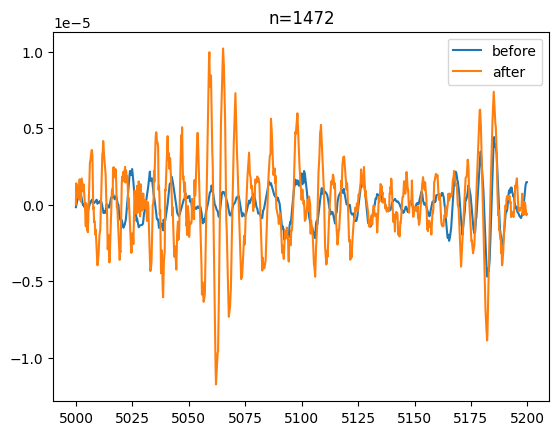

In [ ]:
fig, ax = plt.subplots()

bank_1_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01/decay/1'
gain_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/normalized_gains/1'
epochs = [file[:-4] for file in os.listdir(os.path.join(gain_dir))] #bank 1 epochs w/ gains

n = len([file for file in os.listdir(bank_1_dir) if info.set_index('source').loc[file[:-4], 'epoch'] in epochs])

xs, asymmetry = build_asymmetry_w_div(bank_1_dir, epochs, info)
xmin = np.argmin(np.abs(xs - 5000))
xmax = np.argmin(np.abs(xs - 5200))
xs = xs[xmin:xmax]
ax.plot(xs, asymmetry[xmin:xmax], label='before')

xs, asymmetry_div = build_asymmetry_w_div(bank_1_dir, epochs, info, gain_dir=gain_dir)
xs = xs[xmin:xmax]
ax.plot(xs, asymmetry_div[xmin:xmax], label='after')
ax.legend()
ax.set_title(f'n={n}')

# More normalization tests! YAY!

## Movie

In [ ]:
os.chdir('/home/bhanselman/bhanselman/scripts')
from movies import NormalizedSpectrum

In [ ]:
data_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1'
file = os.listdir(data_dir)[0]
file

'HIP26505.npy'

Normalizing spectrum...
Normalization complete!


MovieWriter ffmpeg unavailable; using Pillow instead.


Writing gif...
gif saved!


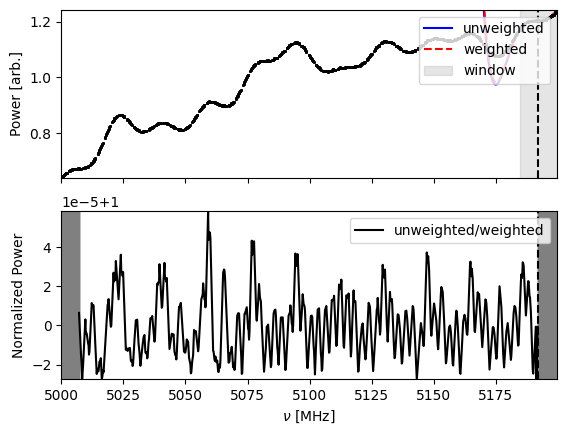

In [ ]:
path = os.path.join(data_dir, file)
norm = NormalizedSpectrum(
    path,
    freq=5100,
    width=100,
    exterior=3,
    order=5,
    a=0.1,
    mode='weighted'
)
save_dir = '/home/bhanselman/bhanselman/movies/cband_5100_example.gif'
norm.generate_movie(save_dir=save_dir)

MovieWriter ffmpeg unavailable; using Pillow instead.


Normalizing spectrum...
Normalization complete!
Writing gif...
gif saved!


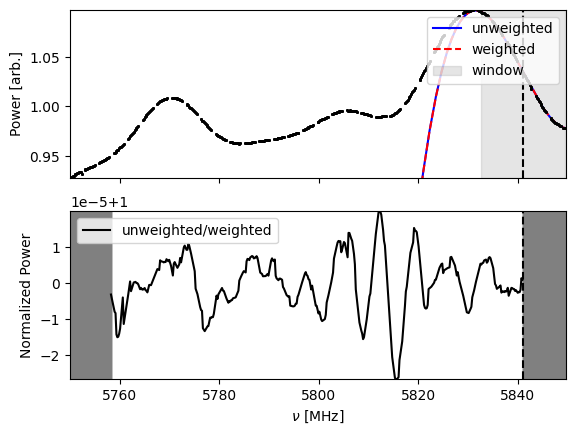

In [ ]:
path = os.path.join(data_dir, 'HIP44263.npy')
norm = NormalizedSpectrum(
    path,
    freq=5800,
    width=50,
    exterior=3,
    order=5,
    a=0.1,
    mode='weighted'
)
save_dir = '/home/bhanselman/bhanselman/movies/cband_5800_example.gif'
norm.generate_movie(save_dir=save_dir)

Normalizing spectrum...
Normalization complete!


MovieWriter ffmpeg unavailable; using Pillow instead.


Writing gif...
gif saved!


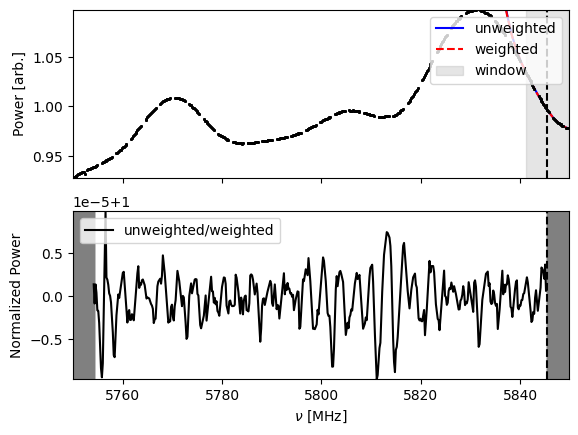

In [ ]:
path = os.path.join(data_dir, 'HIP44263.npy')
norm = NormalizedSpectrum(
    path,
    freq=5800,
    width=50,
    exterior=1.5,
    order=5,
    a=0.1,
    mode='weighted'
)
save_dir = '/home/bhanselman/bhanselman/movies/cband_5800_example_ext_1.5.gif'
norm.generate_movie(save_dir=save_dir)

Normalizing spectrum...
Normalization complete!


MovieWriter ffmpeg unavailable; using Pillow instead.


Writing gif...
gif saved!


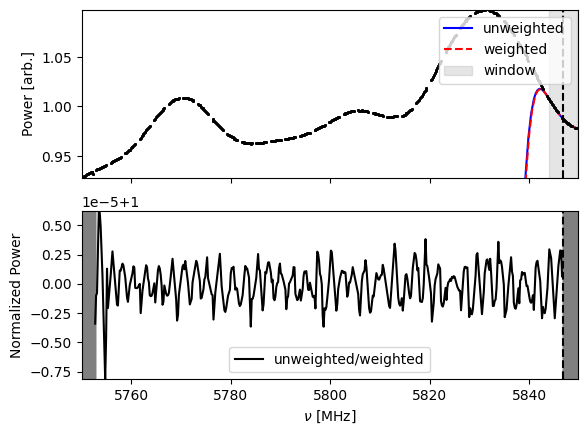

In [ ]:
path = os.path.join(data_dir, 'HIP44263.npy')
norm = NormalizedSpectrum(
    path,
    freq=5800,
    width=50,
    exterior=1,
    order=5,
    a=0.1,
    mode='weighted'
)
save_dir = '/home/bhanselman/bhanselman/movies/cband_5800_example_ext_1.gif'
norm.generate_movie(save_dir=save_dir)

Normalizing spectrum...
Normalization complete!


MovieWriter ffmpeg unavailable; using Pillow instead.


Writing gif...
gif saved!


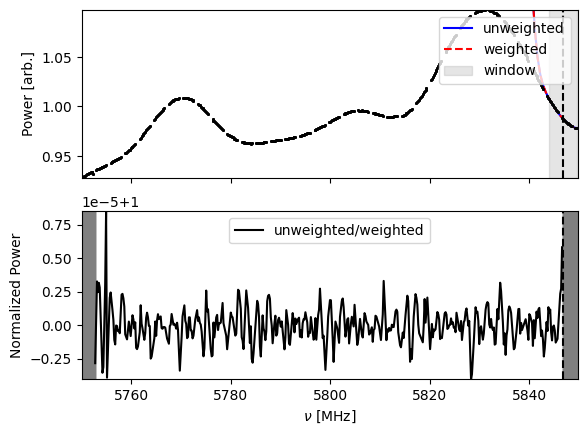

In [ ]:
path = os.path.join(data_dir, 'HIP44263.npy')
norm = NormalizedSpectrum(
    path,
    freq=5800,
    width=50,
    exterior=1,
    order=6,
    a=0.1,
    mode='weighted'
)
save_dir = '/home/bhanselman/bhanselman/movies/cband_5800_example_ext_1_ord_6.gif'
norm.generate_movie(save_dir=save_dir)

Normalizing spectrum...
Normalization complete!


MovieWriter ffmpeg unavailable; using Pillow instead.


Writing gif...
gif saved!


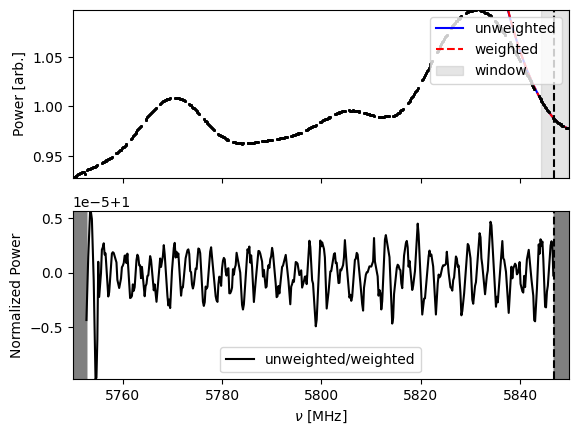

In [ ]:
path = os.path.join(data_dir, 'HIP44263.npy')
norm = NormalizedSpectrum(
    path,
    freq=5800,
    width=50,
    exterior=1,
    order=4,
    a=0.1,
    mode='weighted'
)
save_dir = '/home/bhanselman/bhanselman/movies/cband_5800_example_ext_1_ord_4.gif'
norm.generate_movie(save_dir=save_dir)

Normalizing spectrum...
Normalization complete!


MovieWriter ffmpeg unavailable; using Pillow instead.


Writing gif...
gif saved!


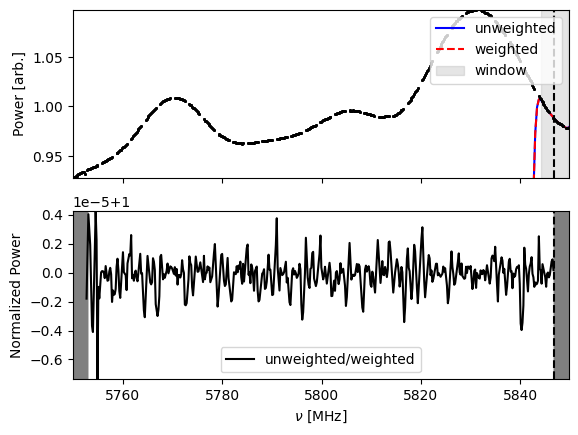

In [ ]:
path = os.path.join(data_dir, 'HIP44263.npy')
norm = NormalizedSpectrum(
    path,
    freq=5800,
    width=50,
    exterior=1,
    order=8,
    a=0.1,
    mode='weighted'
)
save_dir = '/home/bhanselman/bhanselman/movies/cband_5800_example_ext_1_ord_8.gif'
norm.generate_movie(save_dir=save_dir)

In [86]:
def normalize_weighted_new(data, data_dir=None, save_dir=None, a=0.1, b=1, exterior=3, order=5, is_decay=True, **kwargs):
    """
    Standard rolling polynomial normalize procedure. Updated.
    """
    if data_dir:
        xs, ys = np.load(os.path.join(data_dir, data))
    else:
        xs, ys = data
    
    freq_diff = xs[1] - xs[0]
    xs_trimmed, ys_mean = prepare(xs, ys, freq_diff, **kwargs)
    
    new_xs = []
    normalized_spectrum = []
    
    def get_sigma(center):
        if is_decay:
            sigma = v_virial*center/(c*np.sqrt(3))
        else:
            sigma = v_virial*center/(c*np.sqrt(6))
        return sigma
    
    # Loop through the data points and divide each point by the polynomial 
    for x in xs_trimmed:
        i = xs.tolist().index(x)
        window = round_up_to_nearest_odd(2 * exterior * get_sigma(x) / freq_diff)
        
        if i < (window//2): 
            continue
        elif i >= len(xs) - (window//2 + 1):
            break

        ind_xs = np.arange(-(window//2), window//2+1)

        current_ys = ys_mean[i-window//2:i+window//2+1]
        idx = np.isfinite(current_ys)
        
        # Unweighted fit
        #unweighted_params = np.polyfit(ind_xs[idx], current_ys[idx], order)
        unweighted_p = Polynomial.fit(ind_xs[idx], current_ys[idx], order)
        
        # Weighted fit
        if b is None:
            weights = [1 if i != 0 else 0 for i in ind_xs[idx]]
        else:
            sigma = get_sigma(x)
            weights = 1 - a*np.exp(-(freq_diff*ind_xs[idx])**2 / (2*b*sigma**2))
        #weighted_params = np.polyfit(ind_xs[idx], current_ys[idx], order, w=weights)
        weighted_p = Polynomial.fit(ind_xs[idx], current_ys[idx], order, w=weights)

        unweighted = current_ys[window//2] if not np.isnan(current_ys[window//2]) else unweighted_p(0) #unweighted_p(0) #np.poly1d(unweighted_params)
        weighted = weighted_p(0) #np.poly1d(weighted_params)
        
        new_xs.append(x)
        normalized_spectrum.append(unweighted/weighted)
    
    #new_ys = ys_mean[lower: len(xs)-upper]
    normalized = np.array([new_xs, normalized_spectrum])
    #old = np.array([new_xs, new_ys])
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        np.save(os.path.join(save_dir, data), normalized)
    return normalized

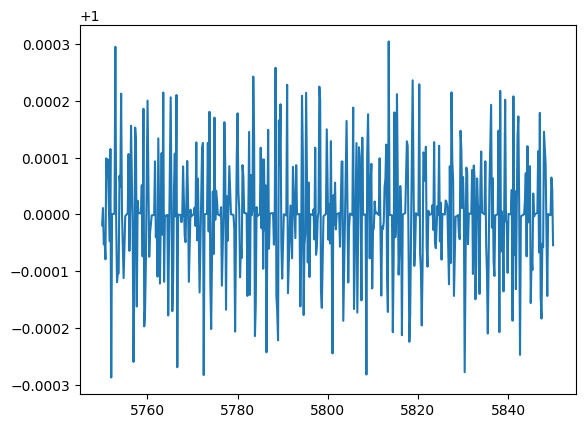

In [74]:
data = np.load(os.path.join(data_dir, 'HIP44263.npy'))
norm_data = normalize_weighted_new(
    data,
    freq=5800,
    width=50,
    order=6,
    exterior=1
)
plt.plot(*norm_data)

In [75]:
def inject_calibrated(name, sig_locs, info, data_dir=None, save_dir=None, calibration_dir=None, signal_sizes=1e-28, is_decay=True, template=False):
    freq, spec = np.load(os.path.join(data_dir, name))
    
    targ_info = info.set_index('source')
    time = convert_to_seconds(targ_info.loc[name[:-4], 'time'])
    sefd_path = os.path.join(calibration_dir, 'median.npy')
    
    theta = targ_info.loc[name[:-4], 'theta']
    shift_factor = get_shift_factor(theta, v_earth)
        
    if template:
        spec = np.ones_like(spec)
        sefd = spec
    else:
        sefd = np.load(sefd_path)[1]

    if not isinstance(sig_locs, (list, np.ndarray)):
        sig_locs = [sig_locs]

    if not isinstance(signal_sizes, (list, np.ndarray)):
        signal_sizes = [signal_sizes] * len(sig_locs)  
    
    if len(sig_locs) != len(signal_sizes):
        raise ValueError("sig_locs and signal_sizes must have the same length.")

    for sig_loc, signal_size in zip(sig_locs, signal_sizes):
        # Calculate line intensity
        if is_decay:
            sig_std = v_virial*sig_loc/(c*np.sqrt(3))
            sig_amp_ratio = 2.75e24*signal_size / (v_virial*(sig_loc/1e3)**3) # convert MHz to GHz # Units: Jy
            col_name = dm_profile
        else:
            sig_std = v_virial*sig_loc/(c*np.sqrt(6))
            sig_amp_ratio = 9.41e14*signal_size / (v_virial*(sig_loc/1e3)**4) # convert MHz to GHz # Units: Jy
            col_name = dm_profile+'_sq'
        
        # Multiply by line-integrated halo density
        sig_amp = sig_amp_ratio * targ_info.loc[name[:-4], col_name]
        
        # Doppler shift
        sig_loc, sig_std, sig_amp = sig_loc * shift_factor, sig_std * shift_factor, sig_amp / shift_factor
        
        # Add the Gaussian to the spectrum
        g = sig_amp*np.exp(-(freq - sig_loc)**2 / (2*sig_std**2))
        spec = spec * (sefd + g) / sefd
    
    # Save/return the injected spectrum
    injected = np.array([freq, spec])
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        np.save(os.path.join(save_dir, name), injected)
    return injected

In [ ]:
info = pd.read_csv('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/all_cband_info.csv')

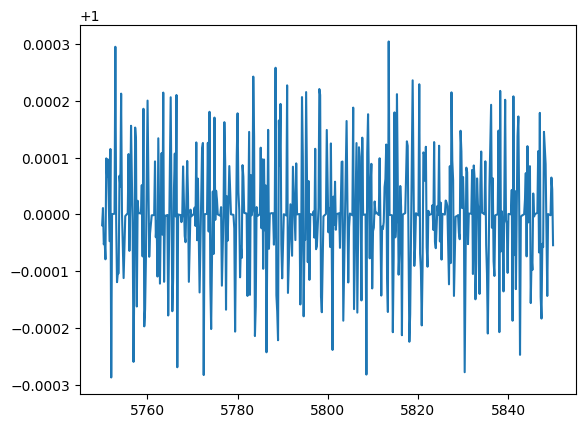

In [ ]:
inj_data = inject_calibrated(
    'HIP44263.npy',
    5800,
    info,
    data_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1',
    calibration_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/median_sefds/1',
    signal_sizes=3e-29
)
norm_data = normalize_weighted_new(
    inj_data,
    freq=5800,
    width=50,
    order=6,
    exterior=1
)
plt.plot(*norm_data)

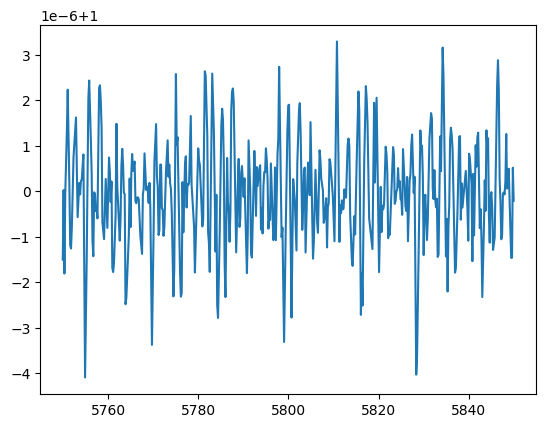

In [ ]:
inj_data = inject_calibrated(
    'HIP44263.npy',
    5800,
    info,
    data_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1',
    calibration_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/median_sefds/1',
    signal_sizes=3e-29
)
norm_data = normalize_weighted(
    inj_data,
    freq=5800,
    width=50,
    order=6,
    exterior=1
)
plt.plot(*norm_data)

Conclusion: very small exterior windows wash out real signals, in both the old and new cases.

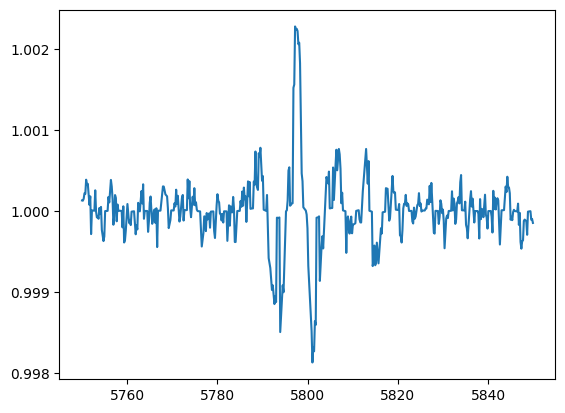

In [ ]:
inj_data = inject_calibrated(
    'HIP44263.npy',
    5800,
    info,
    data_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1',
    calibration_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/median_sefds/1',
    signal_sizes=3e-29
)
norm_data = normalize_weighted_new(
    inj_data,
    freq=5800,
    width=50,
    order=5,
    exterior=3
)
plt.plot(*norm_data)

Slightly worse SNR performance than the old method?

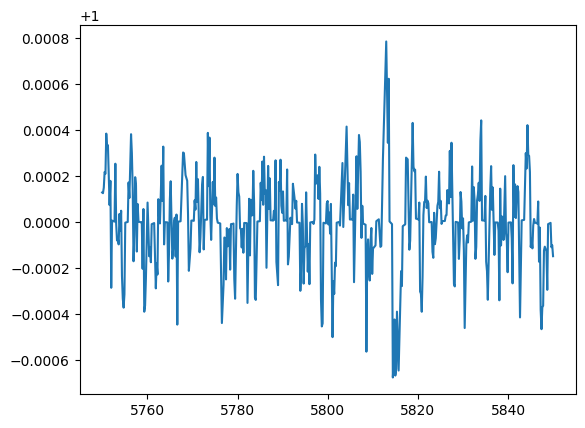

In [109]:
data = np.load(os.path.join(data_dir, 'HIP44263.npy'))
norm_data = normalize_weighted_new(
    data,
    freq=5800,
    width=50,
    order=5,
    exterior=3
)
plt.plot(*norm_data)

### Asymmetry

In [ ]:
def normalize_wrapper(file, freq=None, b=None, inject=False):
    if inject:
        data = inject_calibrated(
            file,
            freq,
            info,
            data_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1',
            calibration_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/median_sefds/1',
            signal_sizes=1e-29
        )
    else:
        data = np.load(os.path.join(data_dir, file))
    norm = normalize_weighted_new(
        data,
        freq=freq,
        width=50,
        b=b
    )
    return file[:-4], norm

def build_asymmetry(data_dict):
    sample_info = bank_info[bank_info['source'].isin(sample)]
    inner = sample_info[(sample_info['phi'] < 70)]['source'].tolist()
    outer = sample_info[(sample_info['phi'] > 115)]['source'].tolist()
    
    inner_spectra = [data_dict[source][1] for source in inner]
    outer_spectra = [data_dict[source][1] for source in outer]

    inner_mean = np.mean(inner_spectra, axis=0)
    outer_mean = np.mean(outer_spectra, axis=0)

    xs = data_dict[inner[0]][0]
    asymmetry = (inner_mean - outer_mean) / (inner_mean + outer_mean)
    return xs, asymmetry

In [ ]:
sample = []
with open(os.path.join('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/snr_targets_200.txt'), 'r') as file:
    for line in file:
        sample.append(line.strip())
sample

['HIP26112',
 'HIP51881',
 'HIP50663',
 'HIP22227',
 'HIP11277',
 'HIP16327',
 'HIP90979',
 'HIP3597',
 'HIP38119',
 'HIP27246',
 'HIP26326',
 'HIP3334',
 'HIP23880',
 'HIP7182',
 'HIP37840',
 'HIP20526',
 'HIP40395',
 'HIP14734',
 'HIP11593',
 'HIP51648',
 'HIP9017',
 'HIP23269',
 'HIP10656',
 'HIP37994',
 'HIP26799',
 'HIP29670',
 'HIP22157',
 'HIP78389',
 'HIP40614',
 'HIP11118',
 'HIP77033',
 'HIP26486',
 'HIP7153',
 'HIP51685',
 'HIP45042',
 'HIP34759',
 'HIP40492',
 'HIP19554',
 'HIP21099',
 'HIP74129',
 'HIP28174',
 'HIP72577',
 'HIP23964',
 'HIP1484',
 'HIP3996',
 'HIP97747',
 'HIP43674',
 'HIP36710',
 'HIP16973',
 'HIP12598',
 'HIP98455',
 'HIP38956',
 'HIP43952',
 'HIP19930',
 'HIP7475',
 'HIP26120',
 'HIP33536',
 'HIP21790',
 'HIP18808',
 'HIP26510',
 'HIP44263',
 'HIP22476',
 'HIP41123',
 'HIP10279',
 'HIP31669',
 'HIP18655',
 'HIP1184',
 'HIP75455',
 'HIP32411',
 'HIP105341',
 'HIP24714',
 'HIP31256',
 'HIP28479',
 'HIP5903',
 'HIP85705',
 'HIP44746',
 'HIP53326',
 'HIP182

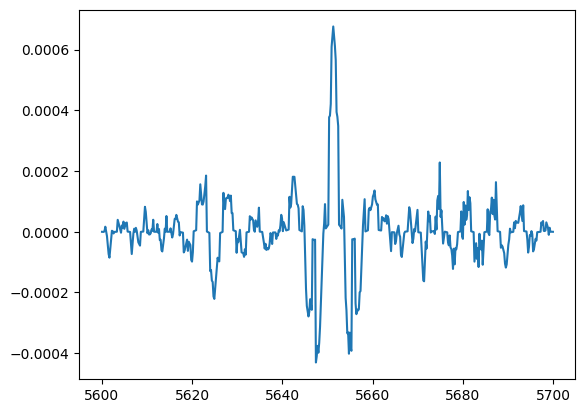

In [ ]:
sample_files = [name + '.npy' for name in sample]

data_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1'
sources = [file[:-4] for file in os.listdir(data_dir)]
bank_info = info[info['source'].isin(sources) & ~info['phi'].between(70,115)]

with Pool(processes=10) as p:
    norm_inj_partial = partial(normalize_wrapper, freq=5650, b=1, inject=True)
    norm_inj_dict = dict(p.imap_unordered(norm_inj_partial, sample_files))

xs, asymmetry_inj = build_asymmetry(norm_inj_dict)
plt.plot(xs, asymmetry_inj)

### Another modification - fixed exterior window

In [43]:
def normalize_weighted_fixed(
        data,
        data_dir=None,
        save_dir=None,
        a=0.1,
        b=1,
        cell_width=1,
        order=5,
        is_decay=True,
        freq=None,
        width=200,
        start=None,
        stop=None
        ):
    """
    Standard rolling polynomial normalize procedure. Updated.
    """
    if data_dir:
        xs, ys = np.load(os.path.join(data_dir, data))
    else:
        xs, ys = data
    
    freq_diff = xs[1] - xs[0]
    
    # Prepare spectrum
    for i in range(16, len(ys)-16, 16):  # Excise the 4 unstable valley points in each coarse channel 
        ys[i] = np.nan
        ys[i+15] = np.nan
        ys[i+1] = np.nan
        ys[i+14] = np.nan
    
    xs_trimmed = xs
    if freq:
        index = np.argmin(np.abs(xs - freq))
        width = int(width / freq_diff)
        start_index = ((index-width) // 16) * 16 # Start of coarse channel containing index-width
        stop_index = -(-(index+width) // 16) * 16 # Stop of coarse channel containing index+width
        xs_trimmed = xs[start_index:stop_index]
        ys_trimmed = ys[start_index:stop_index]
    elif start or stop:
        start_index = 0 if start is None else (np.argmin(np.abs(xs - start)) // 16) * 16
        stop_index = len(xs) - 1 if stop is None else -(-np.argmin(np.abs(xs - stop)) // 16) * 16
        xs_trimmed = xs[start_index:stop_index]
        ys_trimmed = ys[start_index:stop_index]
        
    new_xs = []
    normalized_spectrum = []
    
    def get_sigma(center):
        if is_decay:
            sigma = v_virial*center/(c*np.sqrt(3))
        else:
            sigma = v_virial*center/(c*np.sqrt(6))
        return sigma
    
    ind_xs = np.arange(-16*cell_width, 16*(cell_width+1))

    # Loop through the coarse channels
    for i in range(16*cell_width, len(xs_trimmed)-16*cell_width, 16):
        current_ys = ys_trimmed[i-16*cell_width:i+16*(cell_width+1)]
        current_ys_mean = current_ys / np.nanmean(current_ys)
        idx = np.isfinite(current_ys_mean)

        # Unweighted fit to coarse channels
        unweighted_p = Polynomial.fit(ind_xs[idx], current_ys_mean[idx], order)

        # Loop through points in coarse channel and perform weighted fits
        for j in range(16):
            x = xs_trimmed[i+j]
            # Weighted fit
            if b is None: # 1 bin blanking
                weights = [1 if k != j else 0 for k in ind_xs[idx]]
            else:
                sigma = get_sigma(x)
                weights = 1 - a*np.exp(-(freq_diff*(ind_xs[idx]-j))**2 / (2*b*sigma**2)) # Offset by j
            #weighted_params = np.polyfit(ind_xs[idx], current_ys[idx], order, w=weights)
            weighted_p = Polynomial.fit(ind_xs[idx], current_ys_mean[idx], order, w=weights)
            
            unweighted = unweighted_p(j)
            weighted = weighted_p(j)
            
            new_xs.append(x)
            normalized_spectrum.append(unweighted/weighted)

    normalized = np.array([new_xs, normalized_spectrum])
    #old = np.array([new_xs, new_ys])
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        np.save(os.path.join(save_dir, data), normalized)
    return normalized

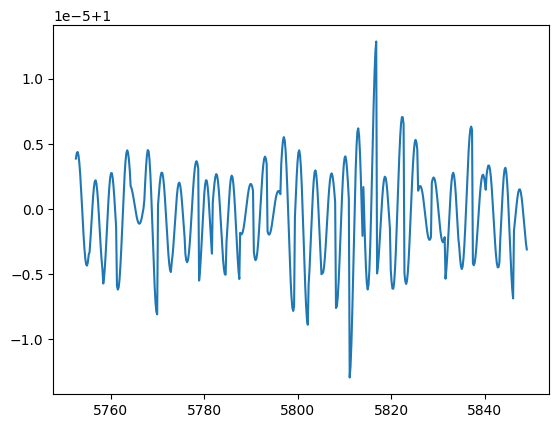

In [ ]:
data_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1'
data = np.load(os.path.join(data_dir, 'HIP44263.npy'))
norm_data = normalize_weighted_fixed(
    data,
    freq=5800,
    width=50,
    order=5,
    cell_width=1
)
plt.plot(*norm_data)

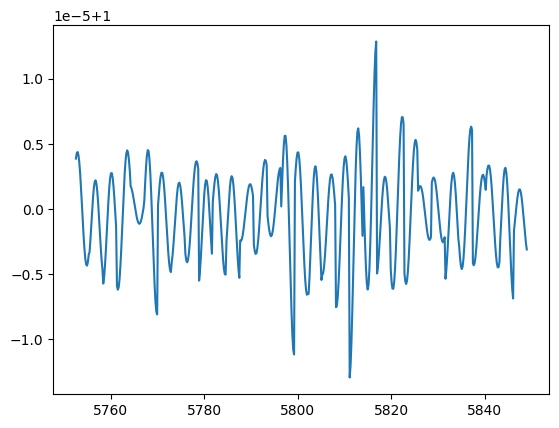

In [ ]:
data = np.load(os.path.join(data_dir, 'HIP44263.npy'))
inj_data = inject_calibrated(
    'HIP44263.npy',
    5800,
    info,
    data_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1',
    calibration_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/median_sefds/1',
    signal_sizes=3e-29
)
norm_data = normalize_weighted_fixed(
    inj_data,
    freq=5800,
    width=50,
    order=5,
    cell_width=1
)
plt.plot(*norm_data)

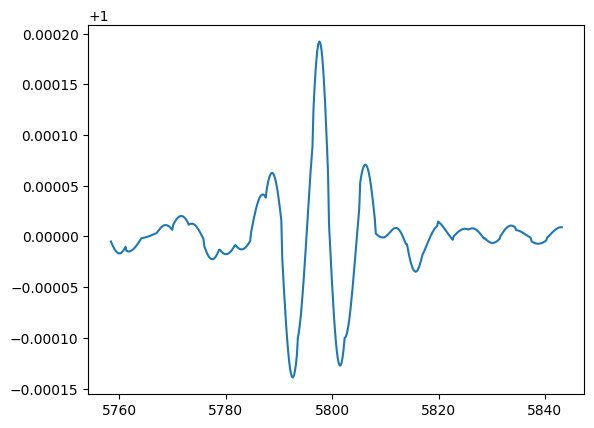

In [ ]:
data = np.load(os.path.join(data_dir, 'HIP44263.npy'))
inj_data = inject_calibrated(
    'HIP44263.npy',
    5800,
    info,
    data_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1',
    calibration_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/median_sefds/1',
    signal_sizes=3e-29
)
norm_data = normalize_weighted_fixed(
    inj_data,
    freq=5800,
    width=50,
    order=5,
    cell_width=3
)
plt.plot(*norm_data)

In [63]:
def normalize_weighted_fixed_new(
        data,
        data_dir=None,
        save_dir=None,
        a=0.1,
        b=1,
        cell_width=1,
        order=5,
        is_decay=True,
        freq=None,
        width=200,
        start=None,
        stop=None
        ):
    """
    Standard rolling polynomial normalize procedure. Updated.
    """
    if data_dir:
        xs, ys = np.load(os.path.join(data_dir, data))
    else:
        xs, ys = data
    
    freq_diff = xs[1] - xs[0]
    
    # Prepare spectrum
    for i in range(16, len(ys)-16, 16):  # Excise the 4 unstable valley points in each coarse channel 
        ys[i] = np.nan
        ys[i+15] = np.nan
        ys[i+1] = np.nan
        ys[i+14] = np.nan
    
    xs_trimmed = xs
    if freq:
        index = np.argmin(np.abs(xs - freq))
        width = int(width / freq_diff)
        start_index = ((index-width) // 16) * 16 # Start of coarse channel containing index-width
        stop_index = -(-(index+width) // 16) * 16 # Stop of coarse channel containing index+width
        xs_trimmed = xs[start_index:stop_index]
        ys_trimmed = ys[start_index:stop_index]
    elif start or stop:
        start_index = 0 if start is None else (np.argmin(np.abs(xs - start)) // 16) * 16
        stop_index = len(xs) - 1 if stop is None else -(-np.argmin(np.abs(xs - stop)) // 16) * 16
        xs_trimmed = xs[start_index:stop_index]
        ys_trimmed = ys[start_index:stop_index]
        
    new_xs = []
    normalized_spectrum = []
    
    def get_sigma(center):
        if is_decay:
            sigma = v_virial*center/(c*np.sqrt(3))
        else:
            sigma = v_virial*center/(c*np.sqrt(6))
        return sigma
    
    ind_xs = np.arange(-16*cell_width, 16*(cell_width+1))

    # Loop through the coarse channels
    for i in range(16*cell_width, len(xs_trimmed)-16*cell_width, 16):
        current_ys = ys_trimmed[i-16*cell_width:i+16*(cell_width+1)]
        current_ys_mean = current_ys / np.nanmean(current_ys)
        idx = np.isfinite(current_ys_mean)

        # Unweighted fit to coarse channels
        unweighted_p = Polynomial.fit(ind_xs[idx], current_ys_mean[idx], order)

        # Loop through points in coarse channel and perform weighted fits
        for j in range(16):
            x = xs_trimmed[i+j]
            # Weighted fit
            if b is None: # 1 bin blanking
                weights = [1 if k != j else 0 for k in ind_xs[idx]]
            else:
                sigma = get_sigma(x)
                weights = 1 - a*np.exp(-(freq_diff*(ind_xs[idx]-j))**2 / (2*b*sigma**2)) # Offset by j
            #weighted_params = np.polyfit(ind_xs[idx], current_ys[idx], order, w=weights)
            weighted_p = Polynomial.fit(ind_xs[idx], current_ys_mean[idx], order, w=weights)
            
            unweighted = current_ys_mean[16*cell_width+j] if not np.isnan(current_ys_mean[16*cell_width+j]) else unweighted_p(j) #unweighted_p(j)
            weighted = weighted_p(j)
            
            new_xs.append(x)
            normalized_spectrum.append(unweighted/weighted)

    normalized = np.array([new_xs, normalized_spectrum])
    #old = np.array([new_xs, new_ys])
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        np.save(os.path.join(save_dir, data), normalized)
    return normalized

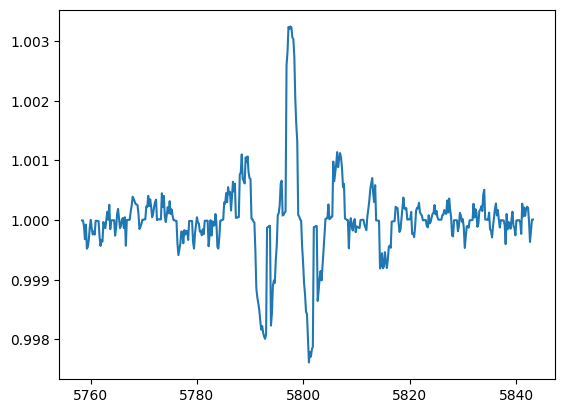

In [ ]:
data = np.load(os.path.join(data_dir, 'HIP44263.npy'))
inj_data = inject_calibrated(
    'HIP44263.npy',
    5800,
    info,
    data_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1',
    calibration_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/median_sefds/1',
    signal_sizes=3e-29
)
norm_data = normalize_weighted_fixed_new(
    inj_data,
    freq=5800,
    width=50,
    order=5,
    cell_width=3
)
plt.plot(*norm_data)

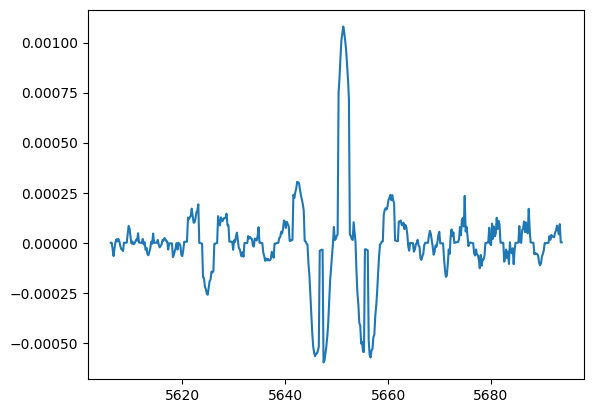

In [ ]:
def normalize_wrapper(file, freq=None, b=None, inject=False):
    if inject:
        data = inject_calibrated(
            file,
            freq,
            info,
            data_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1',
            calibration_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/median_sefds/1',
            signal_sizes=1e-29
        )
    else:
        data = np.load(os.path.join(data_dir, file))
    norm = normalize_weighted_fixed_new(
        data,
        freq=freq,
        width=50,
        b=b,
        cell_width=3
    )
    return file[:-4], norm

def build_asymmetry(data_dict):
    sample_info = bank_info[bank_info['source'].isin(sample)]
    inner = sample_info[(sample_info['phi'] < 70)]['source'].tolist()
    outer = sample_info[(sample_info['phi'] > 115)]['source'].tolist()
    
    inner_spectra = [data_dict[source][1] for source in inner]
    outer_spectra = [data_dict[source][1] for source in outer]

    inner_mean = np.mean(inner_spectra, axis=0)
    outer_mean = np.mean(outer_spectra, axis=0)

    xs = data_dict[inner[0]][0]
    asymmetry = (inner_mean - outer_mean) / (inner_mean + outer_mean)
    return xs, asymmetry

sample = []
with open(os.path.join('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/snr_targets_200.txt'), 'r') as file:
    for line in file:
        sample.append(line.strip())

sample_files = [name + '.npy' for name in sample]

data_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1'
sources = [file[:-4] for file in os.listdir(data_dir)]
bank_info = info[info['source'].isin(sources) & ~info['phi'].between(70,115)]

with Pool(processes=10) as p:
    norm_inj_partial = partial(normalize_wrapper, freq=5650, b=1, inject=True)
    norm_inj_dict = dict(p.imap_unordered(norm_inj_partial, sample_files))

xs, asymmetry_inj = build_asymmetry(norm_inj_dict)
plt.plot(xs, asymmetry_inj)

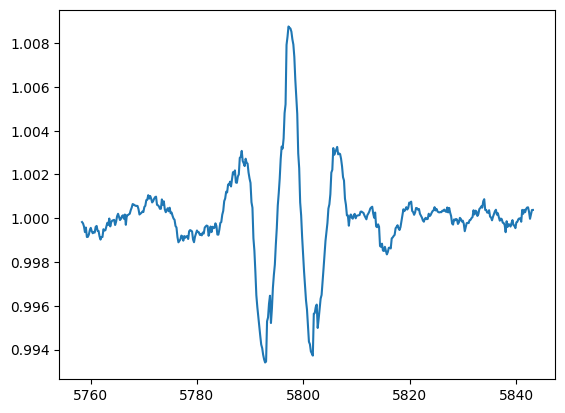

In [ ]:
data = np.load(os.path.join(data_dir, 'HIP44263.npy'))
inj_data = inject_calibrated(
    'HIP44263.npy',
    5800,
    info,
    data_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1',
    calibration_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/median_sefds/1',
    signal_sizes=3e-29
)
norm_data = normalize_weighted_fixed_new(
    inj_data,
    freq=5800,
    width=50,
    order=5,
    cell_width=3,
    a=1
)
plt.plot(*norm_data)

Increasing a reveals the overall trend.

#### 5650 MHz:

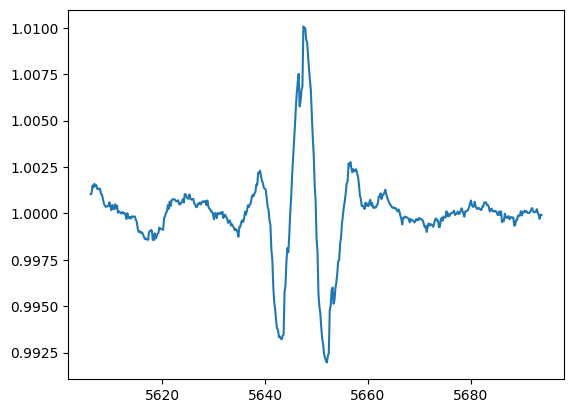

In [ ]:
data = np.load(os.path.join(data_dir, 'HIP44263.npy'))
inj_data = inject_calibrated(
    'HIP44263.npy',
    5650,
    info,
    data_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1',
    calibration_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/median_sefds/1',
    signal_sizes=3e-29
)
norm_data = normalize_weighted_fixed_new(
    inj_data,
    freq=5650,
    width=50,
    order=5,
    cell_width=3,
    a=1
)
plt.plot(*norm_data)

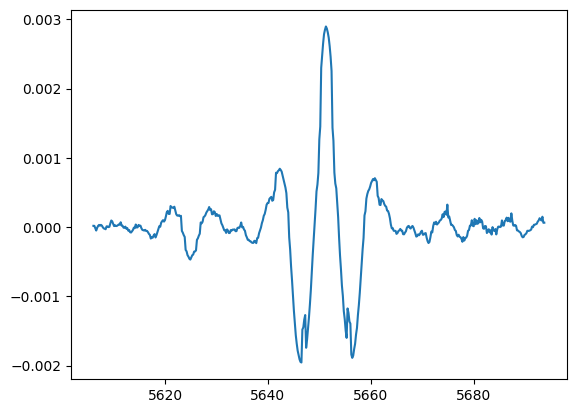

In [ ]:
def normalize_wrapper(file, freq=None, b=None, inject=False):
    if inject:
        data = inject_calibrated(
            file,
            freq,
            info,
            data_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1',
            calibration_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/median_sefds/1',
            signal_sizes=1e-29
        )
    else:
        data = np.load(os.path.join(data_dir, file))
    norm = normalize_weighted_fixed_new(
        data,
        freq=freq,
        width=50,
        b=b,
        cell_width=3,
        a=1
    )
    return file[:-4], norm

def build_asymmetry(data_dict):
    sample_info = bank_info[bank_info['source'].isin(sample)]
    inner = sample_info[(sample_info['phi'] < 70)]['source'].tolist()
    outer = sample_info[(sample_info['phi'] > 115)]['source'].tolist()
    
    inner_spectra = [data_dict[source][1] for source in inner]
    outer_spectra = [data_dict[source][1] for source in outer]

    inner_mean = np.mean(inner_spectra, axis=0)
    outer_mean = np.mean(outer_spectra, axis=0)

    xs = data_dict[inner[0]][0]
    asymmetry = (inner_mean - outer_mean) / (inner_mean + outer_mean)
    return xs, asymmetry

sample = []
with open(os.path.join('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/snr_targets_200.txt'), 'r') as file:
    for line in file:
        sample.append(line.strip())

sample_files = [name + '.npy' for name in sample]

data_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1'
sources = [file[:-4] for file in os.listdir(data_dir)]
bank_info = info[info['source'].isin(sources) & ~info['phi'].between(70,115)]

with Pool(processes=10) as p:
    norm_inj_partial = partial(normalize_wrapper, freq=5650, b=1, inject=True)
    norm_inj_dict = dict(p.imap_unordered(norm_inj_partial, sample_files))

xs, asymmetry_inj = build_asymmetry(norm_inj_dict)
plt.plot(xs, asymmetry_inj)

**I don't think this is worth the struggle. You're much better off doing a classic C-band normalization study. Bring these findings to Karl though.**

In [114]:
np.sqrt(0.05)*v_virial*5500/(c*np.sqrt(3))

0.5921163229878491

# Normalization studies - misc plots

## Intensity asymmetries for decay 052926_01 heatmap (ext=3, b=1)

In [ ]:
info = pd.read_csv('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/all_cband_info.csv')

In [23]:
def build_asymmetry(data_dir, info, sample=None):
    spectra = os.listdir(data_dir)

    if sample:
        spectra = [file for file in spectra if file[:-4] in sample]
    
    inner = info[(info['phi'] < 70)]['source'].tolist()
    outer = info[(info['phi'] > 115)]['source'].tolist()
    
    inner_spectra = [np.load(os.path.join(data_dir, file))[1] for file in spectra if file[:-4] in inner]
    outer_spectra = [np.load(os.path.join(data_dir, file))[1] for file in spectra if file[:-4] in outer]

    inner_mean = np.mean(inner_spectra, axis=0)
    outer_mean = np.mean(outer_spectra, axis=0)

    xs = np.load(os.path.join(data_dir, spectra[0]))[0]
    asymmetry = (inner_mean - outer_mean) / (inner_mean + outer_mean)
    return xs, asymmetry

Text(0, 0.5, 'Asymmetry')

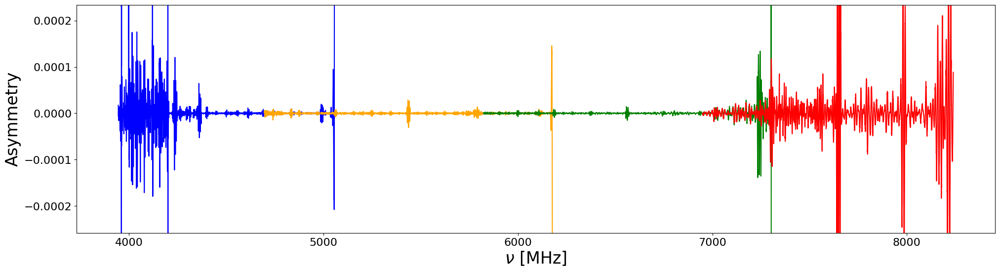

In [ ]:
data_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01/decay'
colors = ['blue', 'orange', 'green', 'red']

fig, ax = plt.subplots(figsize=(24,6))
plt.rcParams['xtick.labelsize'] = 16
plt.rcParams['ytick.labelsize'] = 16

ypbots = []
yptops = []

for bank, color in enumerate(colors):
    bank_dir = os.path.join(data_dir, str(bank))
    xs, asym = build_asymmetry(bank_dir, info)
    ax.plot(xs, asym, color=color)
    ypbots.append(np.percentile(asym, 1))
    yptops.append(np.percentile(asym, 99))

ax.set_ylim(min(ypbots), max(yptops))
ax.set_xlabel('$\\nu$ [MHz]', fontsize=24)
ax.set_ylabel('Asymmetry', fontsize=24)

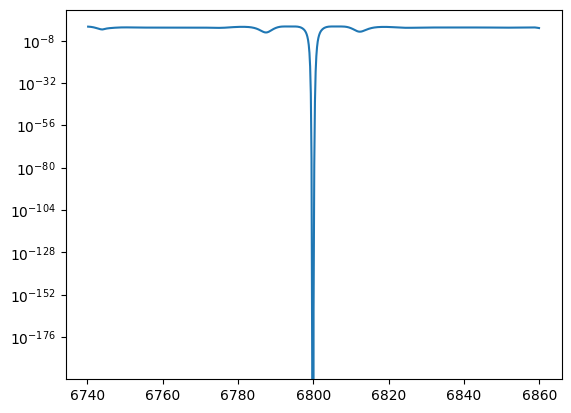

In [ ]:
pval_path = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/snr_evals_cband/grid_weighted_decay/pvals/2/6800/b_0.25_ext_4.5.npy'
pvals = np.load(pval_path)
plt.plot(*pvals)
plt.yscale('log')

In [8]:
np.min(pvals[1])

0.0

In [11]:
xs, pvals_comb = pvals

In [12]:
idx = np.argmin(np.abs(6800 - xs))
window = pvals_comb[idx-20:idx+20]
window_fin = window[window != 0]
np.min(window_fin)

4.6087507394133116e-191

# Asymmetry tests

In [4]:
semesters = list(set(l[4:7] for l in info['epoch']))
semesters

['19A',
 '18B',
 '23A',
 '17B',
 '21A',
 '24A',
 '25A',
 '22A',
 '20B',
 '22B',
 '21B',
 '23B',
 '19B',
 '20A',
 '24B',
 '18A']

In [13]:
def get_semester(targ):
    targ_info = info.set_index('source')
    return targ_info.loc[targ, 'epoch'][4:7]

In [22]:
def build_asymmetry_by_semester(data_dir, info, sample=None):
    spectra = os.listdir(data_dir)

    if sample:
        spectra = [file for file in spectra if file[:-4] in sample]
    
    inner = info[(info['phi'] < 70)]['source'].tolist()
    outer = info[(info['phi'] > 115)]['source'].tolist()
    
    semesters = list(set(l[4:7] for l in info['epoch']))
    inner_spectra = [
        [
            np.load(os.path.join(data_dir, file))[1]
            for file in spectra
            if file[:-4] in inner and get_semester(file[:-4]) == sem
        ]
        for sem in semesters
    ]
    outer_spectra = [
        [
            np.load(os.path.join(data_dir, file))[1]
            for file in spectra
            if file[:-4] in outer and get_semester(file[:-4]) == sem
        ]
        for sem in semesters
    ]

    inner_spectra = [l for l in inner_spectra if len(l)]
    outer_spectra = [l for l in outer_spectra if len(l)]

    inner_mean = [np.mean(l, axis=0) for l in inner_spectra]
    outer_mean = [np.mean(l, axis=0) for l in outer_spectra]

    inner_sum = np.sum(inner_mean, axis=0)
    outer_sum = np.sum(outer_mean, axis=0)

    xs = np.load(os.path.join(data_dir, spectra[0]))[0]
    asymmetry = (inner_sum - outer_sum) / (inner_sum + outer_sum)
    return xs, asymmetry

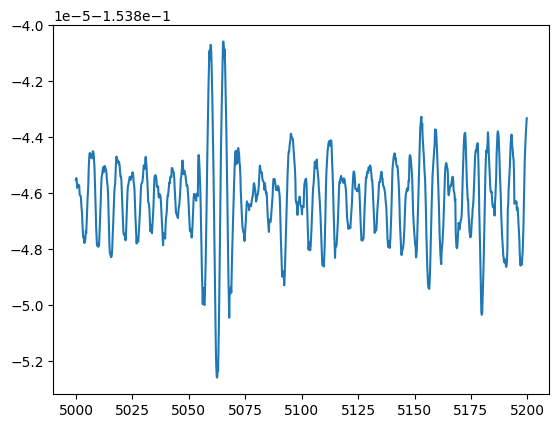

In [ ]:
bank_1_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01/decay/1'

xs, asym = build_asymmetry_by_semester(bank_1_dir, info)
xmin = np.argmin(np.abs(xs - 5000))
xmax = np.argmin(np.abs(xs - 5200))
xs = xs[xmin:xmax]
plt.plot(xs, asym[xmin:xmax])

In [40]:
def build_asymmetry_w_div(data_dir, info, epochs=None, gain_dir=None):
    spectra = os.listdir(data_dir)
    if epochs:
        data_info = info[info['epoch'].isin(epochs)].set_index('source')
    else:
        data_info = info.set_index('source')
    
    inner = data_info[(data_info['phi'] < 70)].index.tolist()
    outer = data_info[(data_info['phi'] > 115)].index.tolist()

    def get_spectrum(file):
        data = np.load(os.path.join(data_dir, file))[1]
        if gain_dir:
            epoch = data_info.loc[file[:-4], 'epoch']
            gain_path = os.path.join(gain_dir, f'{epoch}.npy')
            gain_data = np.load(gain_path)[1]
            data = data / gain_data
        return data

    inner_spectra = [get_spectrum(file) for file in spectra if file[:-4] in inner]
    outer_spectra = [get_spectrum(file) for file in spectra if file[:-4] in outer]

    inner_mean = np.mean(inner_spectra, axis=0)
    outer_mean = np.mean(outer_spectra, axis=0)

    xs = np.load(os.path.join(data_dir, spectra[0]))[0]
    asymmetry = (inner_mean - outer_mean) / (inner_mean + outer_mean)
    print(inner)
    return xs, asymmetry

['HIP61867', 'HIP75266', 'HIP74821', 'HIP92936', 'HIP85090', 'HIP82003', 'HIP98204', 'HIP97792', 'HIP85433', 'HIP84862', 'HIP84415', 'HIP84871', 'HIP84607', 'HIP79105', 'HIP85341', 'HIP75663', 'HIP73038', 'HIP84061', 'HIP72990', 'HIP84621', 'HIP72567', 'HIP72603', 'HIP71807', 'HIP71823', 'HIP72622', 'HIP71875', 'HIP71899', 'HIP73010', 'HIP85057', 'HIP72339', 'HIP85157', 'HIP72546', 'HIP72561', 'HIP72659', 'HIP70782', 'HIP71141', 'HIP74129', 'HIP71227', 'HIP74328', 'HIP74170', 'HIP73056', 'HIP85855', 'HIP72661', 'HIP72321', 'HIP71912', 'HIP77336', 'HIP84976', 'HIP72535', 'HIP78097', 'HIP86287', 'HIP72577', 'HIP86029', 'HIP74670', 'HIP77244', 'HIP74427', 'HIP80553', 'HIP95677', 'HIP81425', 'HIP97423', 'HIP95893', 'HIP80484', 'HIP96008', 'HIP97437', 'HIP102664', 'HIP96950', 'HIP102569', 'HIP102671', 'HIP74930', 'HIP86321', 'HIP85962', 'HIP85789', 'HIP85826', 'HIP90690', 'HIP90626', 'HIP93274', 'HIP92984', 'HIP90365', 'HIP91156', 'HIP86032', 'HIP86435', 'HIP93525', 'HIP79692', 'HIP74072', 

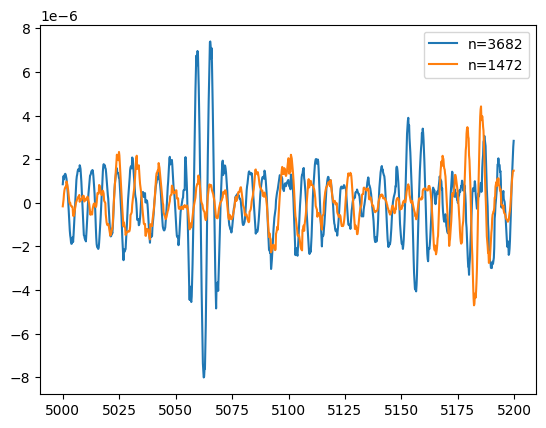

In [ ]:
bank_1_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01/decay/1'
gain_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/normalized_gains/1'
epochs = [file[:-4] for file in os.listdir(os.path.join(gain_dir))]

xs, asym_all = build_asymmetry_w_div(bank_1_dir, info)
xmin = np.argmin(np.abs(xs - 5000))
xmax = np.argmin(np.abs(xs - 5200))
xs = xs[xmin:xmax]
plt.plot(xs, asym_all[xmin:xmax], label='n=3682')

xs, asym_samp = build_asymmetry_w_div(bank_1_dir, info, epochs=epochs)
xs = xs[xmin:xmax]
plt.plot(xs, asym_samp[xmin:xmax], label='n=1472')
plt.legend()

In [42]:
len(os.listdir(bank_1_dir))

3682

# Root-finding tests: secant method

In [43]:
def objective(x, p):
    log_three_sigma = -np.log10(.5*math.erfc(3/np.sqrt(2)))
    log_pval = -p(x)
    return log_pval - log_three_sigma

def secant_method(f, x0, x1, t=2):
    y0, y1 = f(x0), f(x1)
    i = 2
    while abs(x0 - x1) > 5 * 10**(-t):
        x2 = x1 - y1 * (x1 - x0) / (y1 - y0)
        y2 = f(x2)
        x0, x1 = x1, x2
        y0, y1 = y1, y2
        i += 1
        print(x1)
    print(f'Convergence to {t} decimal places in {i} evaluations')
    return x1

def bisection_method(f, x0, x1, t=2):
    i = 0
    while abs(x0 - x1) > 5 * 10**(-t): #2 decimal places
        x2 = (x0 + x1) / 2
        y2 = f(x2)
        if y2 > 0:
            x1 = x2
        else:
            x0 = x2
        i += 1
    print(f'Convergence to {t} decimal places in {i} evaluations')
    return x2

In [ ]:
pval_array = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/snr_evals_cband/mini_analysis_5500_weighted_decay/states/b_0.5_ext_5.0.npy')
pval_array

array([[1.00000000e-30, 3.16227766e-31, 1.77827941e-31, 2.37137371e-31,
        2.73841963e-31],
       [2.01581270e-34, 8.64959470e-05, 1.77065694e-02, 2.54874967e-03,
        5.92354972e-04]])

In [45]:
log_three_sigma = -np.log10(.5*math.erfc(3/np.sqrt(2)))
log_three_sigma

2.8696990359293686

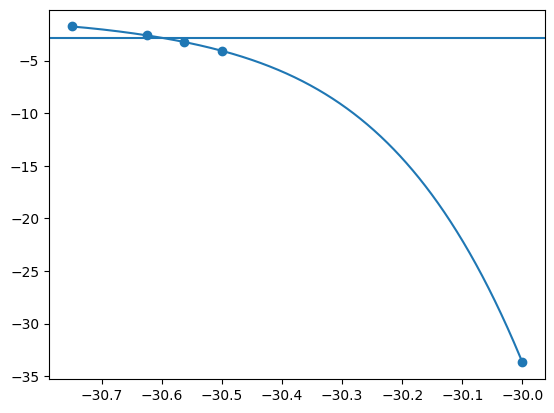

In [46]:
xs, ys = np.log10(pval_array[0]), np.log10(pval_array[1])
plt.scatter(xs, ys)
plt.axhline(-(log_three_sigma))
p = Polynomial.fit(xs, ys, len(pval_array[0])-1)
x = np.linspace(min(xs), max(xs), 1000)
plt.plot(x, p(x))

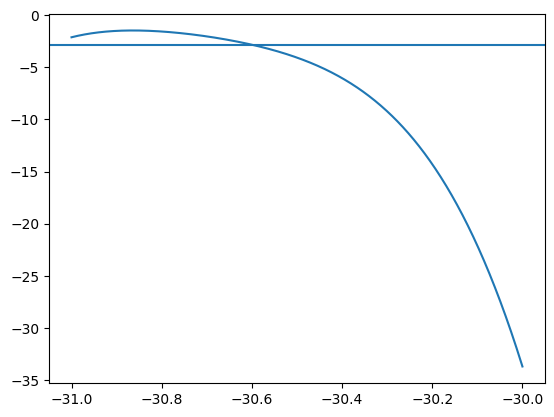

In [47]:
x_2 = np.linspace(-31, -30, 1000)
plt.plot(x_2, p(x_2))
plt.axhline(-(log_three_sigma))

In [51]:
f = partial(objective, p=p)
x_secant = secant_method(f, -31, -30, t=4)
x_bisect = bisection_method(f, -31, -30, t=4)

-30.976015929458566
-30.945720795223277
-31.118404584153975
-31.023048757719096
-31.046300046750243
-31.054612494993297
-31.053580174400956
-31.05361024189991
Convergence to 4 decimal places in 10 evaluations
Convergence to 4 decimal places in 11 evaluations


In [52]:
x_secant

-31.05361024189991

In [53]:
x_bisect

-30.59521484375

In [50]:
from scipy.optimize import brentq
def p_mod(x):
    return p(x) + log_three_sigma

brentq(p_mod, -31, -30)

-30.595691981351955

# "Weighted" asymmetry

In [3]:
def build_weighted_asymmetry(data_dir, info, angle, sample=None):
    targs = os.listdir(data_dir)

    data_info = info[info['source'].apply(lambda l: l + '.npy').isin(targs)]
    
    spectra = [np.load(os.path.join(data_dir, name + '.npy'))[1] for name in data_info['source']]
    if angle == 'theta':
        weights = [get_shift_factor(theta, 225) for theta in data_info['theta']]
    else:
        weights = data_info['nfw'].tolist()
    weights = (weights - np.mean(weights)) / np.std(weights)
    
    weighted_spectra = [w*spec for w, spec in zip(weights, spectra)]
    weighted_spectra_sum = np.sum(weighted_spectra, axis=0)
    weights_sum = np.sum(np.abs(weights))

    xs = np.load(os.path.join(data_dir, targs[0]))[0]
    asymmetry = weighted_spectra_sum / weights_sum
    return xs, asymmetry, weights

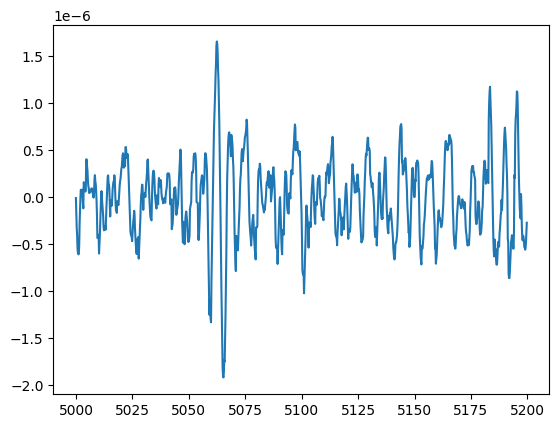

In [ ]:
bank_1_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01/decay/1'
info = pd.read_csv('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/all_cband_info.csv')

xs, asym, weights = build_weighted_asymmetry(bank_1_dir, info, 'theta')
xmin = np.argmin(np.abs(xs - 5000))
xmax = np.argmin(np.abs(xs - 5200))
xs = xs[xmin:xmax]
plt.plot(xs, asym[xmin:xmax])

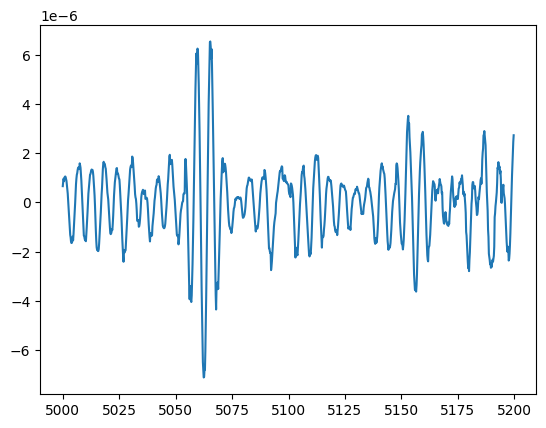

In [5]:
xs, asym, weights = build_weighted_asymmetry(bank_1_dir, info, 'phi')
xmin = np.argmin(np.abs(xs - 5000))
xmax = np.argmin(np.abs(xs - 5200))
xs = xs[xmin:xmax]
plt.plot(xs, asym[xmin:xmax])

In [6]:
def build_asymmetry(data_dir, info, angle, sample=None):
    spectra = os.listdir(data_dir)

    if sample:
        spectra = [file for file in spectra if file[:-4] in sample]
    
    cutoffs = (65, 65) if angle == 'theta' else (70, 115)
    inner = info[(info[angle] < cutoffs[0])]['source'].tolist()
    outer = info[(info[angle] > cutoffs[1])]['source'].tolist()
    
    inner_spectra = [np.load(os.path.join(data_dir, file))[1] for file in spectra if file[:-4] in inner]
    outer_spectra = [np.load(os.path.join(data_dir, file))[1] for file in spectra if file[:-4] in outer]

    inner_mean = np.mean(inner_spectra, axis=0)
    outer_mean = np.mean(outer_spectra, axis=0)

    xs = np.load(os.path.join(data_dir, spectra[0]))[0]
    asymmetry = (inner_mean - outer_mean) / (inner_mean + outer_mean)
    return xs, asymmetry

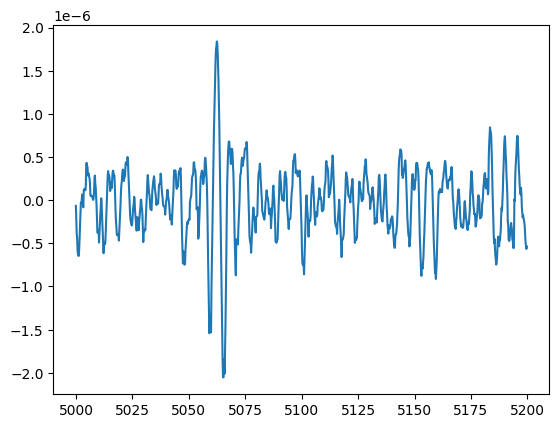

In [7]:
xs, asym = build_asymmetry(bank_1_dir, info, 'theta')
xmin = np.argmin(np.abs(xs - 5000))
xmax = np.argmin(np.abs(xs - 5200))
xs = xs[xmin:xmax]
plt.plot(xs, asym[xmin:xmax])

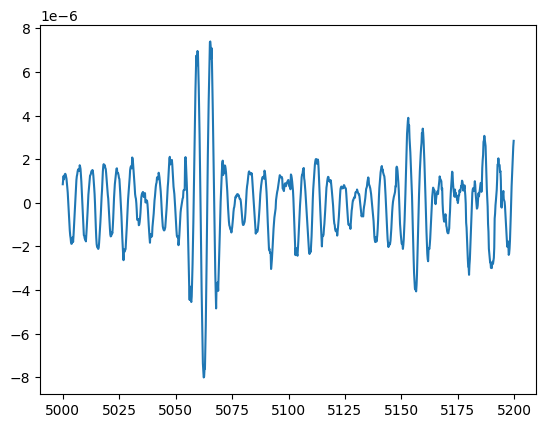

In [8]:
xs, asym = build_asymmetry(bank_1_dir, info, 'phi')
xmin = np.argmin(np.abs(xs - 5000))
xmax = np.argmin(np.abs(xs - 5200))
xs = xs[xmin:xmax]
plt.plot(xs, asym[xmin:xmax])

In [15]:
import numpy as np
from scipy.optimize import minimize

def optimize_continuous_weights(
    S,
    g,
    nuisance_basis=None,
    w0=None,
    lam=1e-2,
    max_abs_weight=None,
):
    """
    S: (N, F) normalized spectra
    g: (N,) expected DM contrast per spectrum
       e.g. velocity projection or J-factor contrast
    nuisance_basis: (K, F) basis vectors for unwanted spectral structure.
                    If None, uses full spectral residual power.
    w0: initial/regularization weights
    lam: regularization strength toward w0
    max_abs_weight: optional bound on |w_i|
    """

    N, F = S.shape
    g = np.asarray(g, dtype=float)

    if w0 is None:
        w0 = g / (np.linalg.norm(g) + 1e-12)
    else:
        w0 = np.asarray(w0, dtype=float)

    if nuisance_basis is None:
        # Penalize total weighted spectral power.
        M = S
    else:
        # Penalize projection onto nuisance modes.
        # M has shape (N, K)
        M = S @ nuisance_basis.T

    def obj(w):
        nuisance = M.T @ w
        reg = w - w0
        return nuisance @ nuisance + lam * (reg @ reg)

    def grad(w):
        return 2 * (M @ (M.T @ w)) + 2 * lam * (w - w0)

    constraints = [
        {
            "type": "eq",
            "fun": lambda w: np.dot(w, g) - 1.0,
            "jac": lambda w: g,
        }
    ]

    if max_abs_weight is None:
        bounds = None
    else:
        bounds = [(-max_abs_weight, max_abs_weight)] * N

    res = minimize(
        obj,
        w0,
        jac=grad,
        constraints=constraints,
        bounds=bounds,
        method="SLSQP",
        options={"maxiter": 1000, "ftol": 1e-10},
    )

    if not res.success:
        raise RuntimeError(res.message)

    return res.x

In [9]:
targs = os.listdir(bank_1_dir)
data_info = info[info['source'].apply(lambda l: l + '.npy').isin(targs)]
spectra = np.array([np.load(os.path.join(bank_1_dir, name + '.npy'))[1, xmin:xmax] for name in data_info['source']])
weights = data_info['nfw'].to_numpy()
weights = (weights - np.mean(weights)) / np.std(weights)

In [16]:
w_opt = optimize_continuous_weights(
    S=spectra,
    g=weights,
    lam=1e-2,
    max_abs_weight=0.05,
)

(array([2787.,  532.,  133.,  109.,   45.,   30.,   25.,   11.,    3.,
           7.]),
 array([-1.84770428e-04,  3.97244824e-05,  2.64219393e-04,  4.88714303e-04,
         7.13209213e-04,  9.37704124e-04,  1.16219903e-03,  1.38669394e-03,
         1.61118885e-03,  1.83568376e-03,  2.06017867e-03]),
 <BarContainer object of 10 artists>)

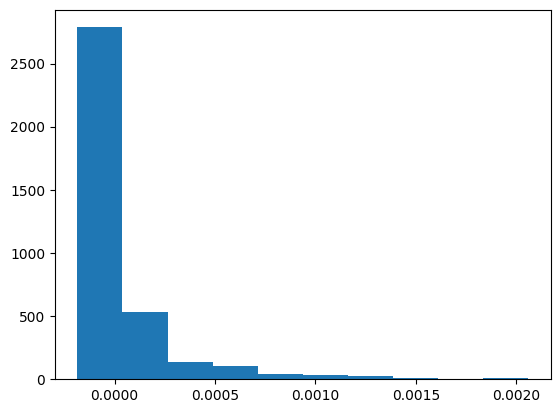

In [21]:
plt.hist(w_opt)

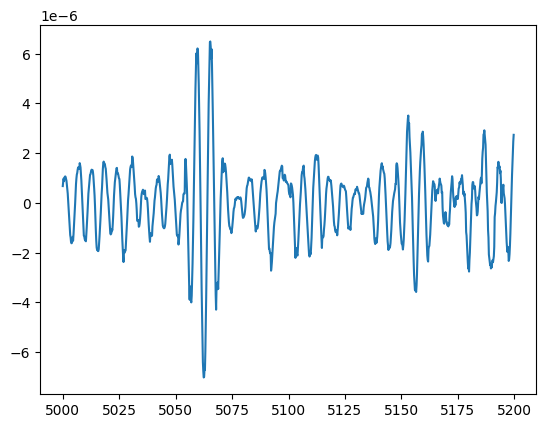

In [19]:
weighted_spectra = [w*spec for w, spec in zip(w_opt, spectra)]
weighted_spectra_sum = np.sum(weighted_spectra, axis=0)
weights_sum = np.sum(np.abs(w_opt))

xs = np.load(os.path.join(bank_1_dir, targs[0]))[0][xmin:xmax]
asymmetry = weighted_spectra_sum / weights_sum
plt.plot(xs, asymmetry)

In [22]:
from sklearn.decomposition import PCA

def estimate_nuisance_modes(S, n_components=20):
    """
    S: (N, F) normalized spectra.
    Returns nuisance modes with shape (n_components, F).
    """
    S_centered = S - np.nanmedian(S, axis=0, keepdims=True)

    pca = PCA(
        n_components=n_components,
        svd_solver="randomized",
        random_state=0,
    )
    pca.fit(S_centered)

    return pca.components_

In [24]:
nuisance_modes = estimate_nuisance_modes(spectra, n_components=20)
nuisance_modes

array([[-0.00835635, -0.01210292, -0.01493587, ..., -0.02300624,
        -0.02743013, -0.02995919],
       [-0.0647991 , -0.06253017, -0.05480981, ..., -0.04254215,
        -0.046425  , -0.05064029],
       [ 0.01810816,  0.01775599,  0.01599493, ..., -0.03529927,
        -0.04066325, -0.04696539],
       ...,
       [-0.02045035, -0.02544199, -0.02850137, ...,  0.04531024,
         0.04496467,  0.04204317],
       [ 0.03231788,  0.03487222,  0.03691763, ..., -0.01356436,
        -0.02854531, -0.03565185],
       [ 0.00202195,  0.0048769 ,  0.00660686, ...,  0.05603897,
         0.04385097,  0.03547951]])

In [25]:
nuisance_modes.shape

(20, 1092)

In [27]:
w_opt = optimize_continuous_weights(
    S=spectra,
    g=weights,
    nuisance_basis=nuisance_modes,
    lam=1e-2,
    max_abs_weight=0.05,
)

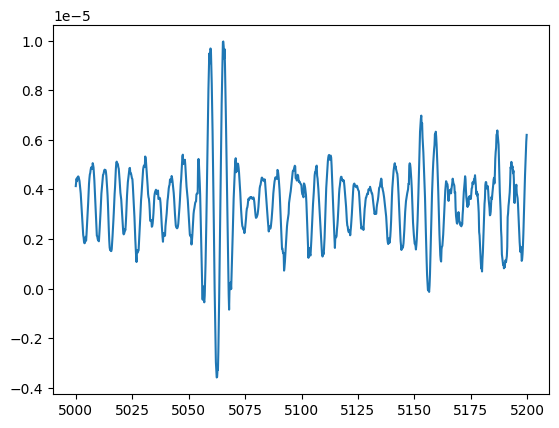

In [28]:
weighted_spectra = [w*spec for w, spec in zip(w_opt, spectra)]
weighted_spectra_sum = np.sum(weighted_spectra, axis=0)
weights_sum = np.sum(np.abs(w_opt))

xs = np.load(os.path.join(bank_1_dir, targs[0]))[0][xmin:xmax]
asymmetry = weighted_spectra_sum / weights_sum
plt.plot(xs, asymmetry)

# Simulated annealing?

## Population state - intensity asymmetry

In [ ]:
bank_1_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01/decay/1'
info = pd.read_csv('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/all_cband_info.csv')
bank_1_info = info[info['source'].apply(lambda l: l+'.npy').isin(os.listdir(bank_1_dir))]
bank_1_info

,source,epoch,time,ra,dec,l,b,theta,phi,nfw,nfw_sq,iso,iso_sq,burkert,burkert_sq,moore,moore_sq
0,HIP26505,AGBT18B_999_67,58447_21709,84.5450,51.4460,159.928287,10.503083,70.278665,157.447207,1.020946e+08,5.164261e+14,2.551421e+08,1.168364e+15,8.748690e+07,4.216032e+14,2.231434e+07,2.987899e+13
1,HIP38956,AGBT18B_999_67,58447_29926,119.5538,41.3005,178.734214,29.539403,88.898766,150.435934,1.041950e+08,5.338421e+14,2.579748e+08,1.193159e+15,8.938129e+07,4.357796e+14,2.282110e+07,3.094497e+13
2,HIP24680,AGBT18B_999_67,58447_21287,79.4427,82.2491,130.707811,23.835749,46.100941,126.624918,1.165119e+08,6.425196e+14,2.736638e+08,1.336188e+15,1.004763e+08,5.237526e+14,2.582143e+07,3.766908e+13
3,HIP25749,AGBT18B_999_67,58447_22754,82.4714,53.4326,157.534348,10.457592,67.927336,155.334399,1.026629e+08,5.211065e+14,2.559132e+08,1.175083e+15,8.799945e+07,4.254149e+14,2.245130e+07,3.016514e+13
4,HIP26556,AGBT18B_999_67,58447_27434,84.7019,55.7476,156.185492,12.755920,66.808126,153.160951,1.033052e+08,5.264244e+14,2.567805e+08,1.182667e+15,8.857872e+07,4.297441e+14,2.260622e+07,3.049055e+13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3930,HIP117419,AGBT25A_999_05,60729_14256,357.0548,55.6079,114.030304,-6.167421,24.763563,113.882534,1.272499e+08,7.467170e+14,2.861592e+08,1.457161e+15,1.101094e+08,6.071761e+14,2.847568e+07,4.422645e+13
3931,HIP117259,AGBT25A_999_05,60729_13614,356.6273,55.1572,113.681460,-6.544129,24.518731,113.517831,1.276105e+08,7.503742e+14,2.865612e+08,1.461158e+15,1.104320e+08,6.100859e+14,2.856542e+07,4.445847e+13
3935,HIP26519,AGBT25A_999_05,60729_21617,84.6624,51.0691,160.295848,10.373524,70.630896,157.828433,1.019979e+08,5.156318e+14,2.550105e+08,1.167220e+15,8.739964e+07,4.209561e+14,2.229104e+07,2.983045e+13
3936,HIP24380,AGBT25A_999_05,60729_24884,78.4605,46.9798,161.500612,4.735081,71.566027,160.924796,1.012769e+08,5.097317e+14,2.540262e+08,1.158682e+15,8.674929e+07,4.161489e+14,2.211744e+07,2.947013e+13


In [4]:
inner_mask = bank_1_info['phi'] < 70
outer_mask = bank_1_info['phi'] > 115
state = np.zeros(len(bank_1_info))
state[inner_mask] = 1
state[outer_mask] = -1

In [5]:
targs = os.listdir(bank_1_dir)
xs = np.load(os.path.join(bank_1_dir, targs[0]))[0]
xmin = np.argmin(np.abs(xs-5000))
xmax = np.argmin(np.abs(xs-5200))

In [8]:
# Load in the spectra in advance
spectra = np.array([np.load(os.path.join(bank_1_dir, file))[1][xmin:xmax] for file in os.listdir(bank_1_dir)])

## Objective function - uninjected std

In [ ]:
def objective(spectra, state):
    inner = state == 1
    outer = state == -1
    inner_mean = np.mean(spectra[inner], axis=0)
    outer_mean = np.mean(spectra[outer], axis=0)
    asymmetry = (inner_mean - outer_mean) / (inner_mean + outer_mean)
    noise = np.std(asymmetry)
    return noise

### Objective function runtime

In [11]:
import timeit
def f():
    return objective(spectra, state)
total_time = timeit.timeit(f, number=10000)
print(f'Average: {(total_time/10):.3f} ms')

Average: 5.878 ms


## Optimization

In [26]:
def simulated_annealing(f, x0, n_iter, T, cooling_rate):
    n = len(x0)

    f_best = f(x0)
    x_best = x0

    xs = [x_best]
    fs = [f_best]

    print(f'Initial f: {f_best}')

    for i in trange(1, n_iter):
        # Generate a new candidate
        x_new = x_best.copy()

        # Make a random swap
        j, k = random.sample(range(n), 2)
        x_new[j], x_new[k] = x_new[k], x_new[j]

        # Evaluate the objective
        f_new = f(x_new)
        
        # Delta
        delta = f_new - f_best

        # Accept or reject the candidate
        if delta < 0:
            x_best = x_new
            f_best = f_new
        else:
            p = np.exp(-delta / T)
            if random.random() < p:
                x_best = x_new
                f_best = f_new
        
        # Save state
        xs.append(x_new)
        fs.append(f_new)

        # Decrease temperature every 100 iterations
        if i % 100 == 0:
            T *= cooling_rate
    
    print(f'Final f: {f_best}')

    # Return best state and full chain
    return x_best, f_best, xs, fs

### 100000 iters, 1e-8 temperature, 0.99 cooling rate

In [27]:
def obj(state):
    return objective(spectra, state)

state_best, noise_best, states, stds = simulated_annealing(obj, state, 100_000, 1e-8, 0.99)

Initial f: 1.795691365666454e-06


  0%|          | 0/99999 [00:00<?, ?it/s]

Final f: 1.396834537939538e-08


### Iteration plot

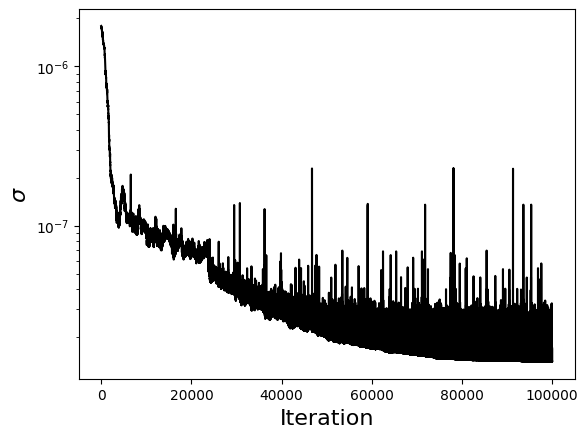

In [30]:
fig, ax = plt.subplots()
ax.plot(range(1, 100_001), stds, c='k')
ax.set_xlabel('Iteration', fontsize=16)
ax.set_ylabel(r'$\sigma$', fontsize=16)
ax.set_yscale('log')

### Best asymmetry

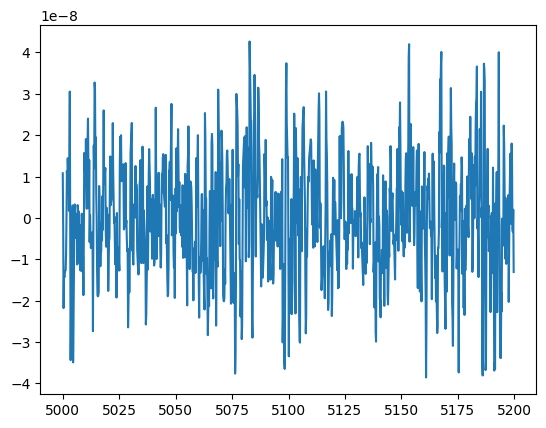

In [32]:
inner = state_best == 1
outer = state_best == -1
inner_mean = np.mean(spectra[inner], axis=0)
outer_mean = np.mean(spectra[outer], axis=0)
asymmetry_best = (inner_mean - outer_mean) / (inner_mean + outer_mean)
plt.plot(xs[xmin:xmax], asymmetry_best)

### Animated Aitoff projection of samples

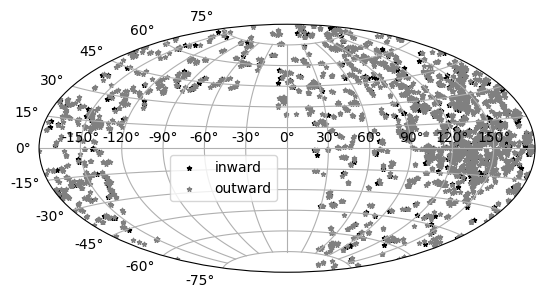

In [ ]:
inner = state_best == 1
outer = state_best == -1
inner_info = bank_1_info[inner]
outer_info = bank_1_info[outer]

inner_gal = SkyCoord(inner_info['l'], inner_info['b'], unit='deg', frame='galactic')
outer_gal = SkyCoord(outer_info['l'], outer_info['b'], unit='deg', frame='galactic')

fig = plt.figure()
ax = fig.add_subplot(111, projection='aitoff')
ax.grid(zorder=0)

inner_sc = ax.scatter(inner_gal.l.wrap_at('180d').radian, inner_gal.b.radian, s=10, marker='*', c='k', label='inward')
outer_sc = ax.scatter(outer_gal.l.wrap_at('180d').radian, outer_gal.b.radian, s=10, marker='*', c='gray', label='outward')

ax.legend(bbox_to_anchor=(0.25, 0.5))

In [35]:
len(inner_info), len(outer_info)

(354, 2138)

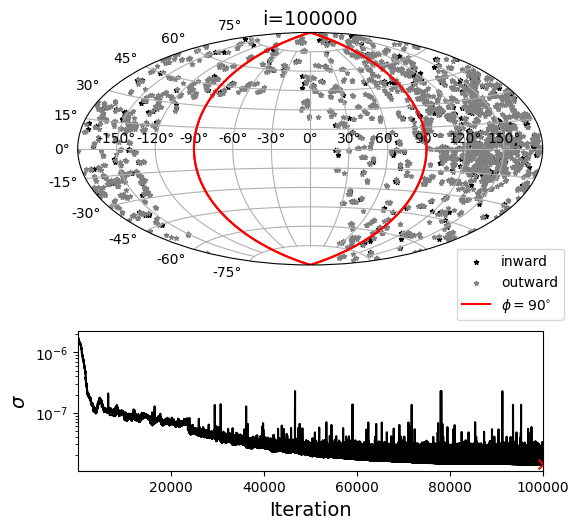

In [ ]:
from matplotlib.animation import FuncAnimation
fig = plt.figure(figsize=(6, 6))
gs = fig.add_gridspec(2, 1, height_ratios=[2, 1])
ax1 = fig.add_subplot(gs[0], projection='aitoff')
ax2 = fig.add_subplot(gs[1])

ax1.grid(zorder=0)

inner_sc = ax1.scatter([], [], s=10, marker='*', c='k', label='inward')
outer_sc = ax1.scatter([], [], s=10, marker='*', c='gray', label='outward')
ax1.plot([-np.pi/2, -np.pi/2], [-np.pi/2, np.pi/2], c='r')
ax1.plot([np.pi/2, np.pi/2], [np.pi/2, -np.pi/2], c='r', label=r'$\phi=90^{\circ}$')
ax1.legend(bbox_to_anchor=(0.8, 0.1))

iters = ax2.plot(range(1, 100_001), stds, c='k')
ax2.set_xlim(1, 100_000)
ax2.set_xlabel('Iteration', fontsize=14)
ax2.set_ylabel(r'$\sigma$', fontsize=14)
ax2.set_yscale('log')
pt = ax2.scatter([], [], color='r', marker='x', s=50, zorder=2)

text = ax1.set_title('n=0', fontsize=14)

l_ = np.linspace(-np.pi, np.pi, 1000)
b_ = np.linspace(-np.pi/2, np.pi/2, 1000)
L, B = np.meshgrid(l_, b_)

def get_theta_phi(l, b):
    galactic_coords = SkyCoord(l, b, unit='rad', frame='galactic')
    v_sun = SkyCoord(90, 0, unit='deg', frame='galactic')
    v_gc = SkyCoord(0, 0, unit='deg', frame='galactic')
    theta = v_sun.separation(galactic_coords).deg
    phi = v_gc.separation(galactic_coords).deg
    return theta, phi

THETA, PHI = get_theta_phi(L, B)
phi_contour = ax1.contour(L, B, (PHI-90), [0], colors='r')

def frame(idx):
    state = states[idx]

    inner = state == 1
    outer = state == -1
    inner_info = bank_1_info[inner]
    outer_info = bank_1_info[outer]

    inner_gal = SkyCoord(inner_info['l'], inner_info['b'], unit='deg', frame='galactic')
    outer_gal = SkyCoord(outer_info['l'], outer_info['b'], unit='deg', frame='galactic')
    
    inner_plot = np.array([inner_gal.l.wrap_at('180d').radian, inner_gal.b.radian]).T
    outer_plot = np.array([outer_gal.l.wrap_at('180d').radian, outer_gal.b.radian]).T
    inner_sc.set_offsets(inner_plot)
    outer_sc.set_offsets(outer_plot)

    pt.set_offsets([idx+1, stds[idx]])

    text.set_text(f'i={idx+1}')

    return inner_sc, outer_sc, pt, text

def draw():
    return frame(0) # i=1

def animate(i):
    return frame((i+1)*100-1) #i=multiple of 100
    
anim = FuncAnimation(
    fig=fig,
    func=animate,
    frames=1000,
    blit=True
)

save_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/062026/01/movie.gif'
anim.save(save_dir, writer='pillow', fps=60, dpi=300)

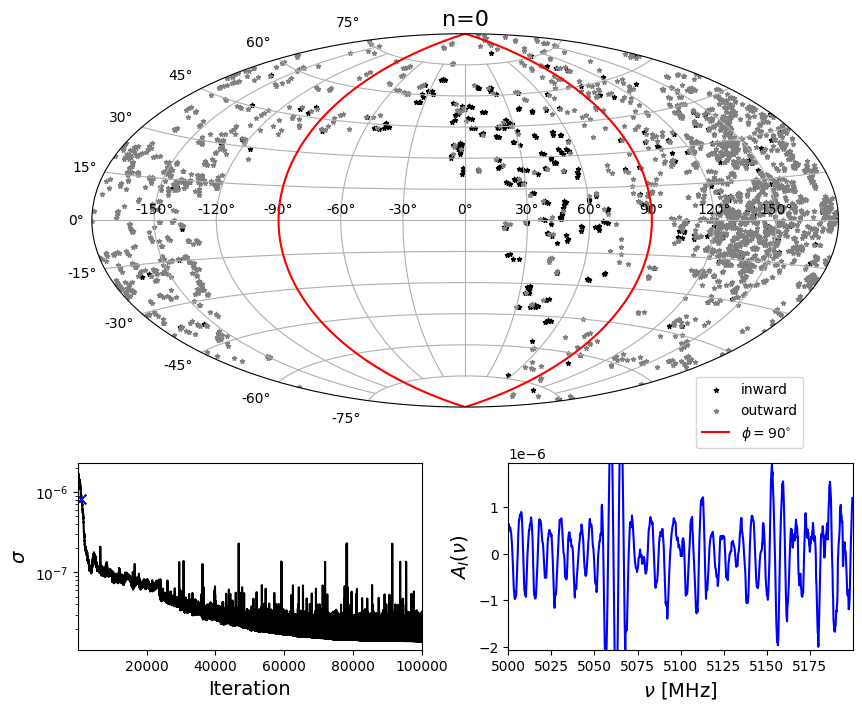

In [31]:
fig = plt.figure(figsize=(10, 8))
gs = fig.add_gridspec(2, 2, height_ratios=[2, 1], wspace=0.25)
ax1 = fig.add_subplot(gs[0,:], projection='aitoff')
ax2 = fig.add_subplot(gs[1,0])
ax3 = fig.add_subplot(gs[1,1])

ax1.grid(zorder=0)

inner_sc = ax1.scatter([], [], s=10, marker='*', c='k', label='inward')
outer_sc = ax1.scatter([], [], s=10, marker='*', c='gray', label='outward')

iters = ax2.plot(range(1, 100_001), stds, c='k')
ax2.set_xlim(1, 100_000)
ax2.set_xlabel('Iteration', fontsize=14)
ax2.set_ylabel(r'$\sigma$', fontsize=14)
ax2.set_yscale('log')
pt = ax2.scatter([], [], color='b', marker='x', s=50, zorder=2)

asym, = ax3.plot([], [], c='b')
ax3.set_xlim(xs[xmin], xs[xmax])
ax3.set_xlabel(r'$\nu$ [MHz]', fontsize=14)
ax3.set_ylabel(r'$A_I(\nu)$', fontsize=14)

text = ax1.set_title('n=0', fontsize=16)

state = states[1099]

inner = state == 1
outer = state == -1
inner_info = bank_1_info[inner]
outer_info = bank_1_info[outer]

inner_gal = SkyCoord(inner_info['l'], inner_info['b'], unit='deg', frame='galactic')
outer_gal = SkyCoord(outer_info['l'], outer_info['b'], unit='deg', frame='galactic')

inner_plot = np.array([inner_gal.l.wrap_at('180d').radian, inner_gal.b.radian]).T
outer_plot = np.array([outer_gal.l.wrap_at('180d').radian, outer_gal.b.radian]).T
inner_sc.set_offsets(inner_plot)
outer_sc.set_offsets(outer_plot)

pt.set_offsets([1100, stds[1099]])

inner = state == 1
outer = state == -1
inner_mean = np.mean(spectra[inner], axis=0)
outer_mean = np.mean(spectra[outer], axis=0)
asymmetry = (inner_mean - outer_mean) / (inner_mean + outer_mean)

asym.set_data(xs[xmin:xmax], asymmetry)
ax3.set_ylim(1.1*np.percentile(asymmetry, 2), 1.1*np.percentile(asymmetry, 98))

ax1.plot([-np.pi/2, -np.pi/2], [-np.pi/2, np.pi/2], c='r')
ax1.plot([np.pi/2, np.pi/2], [np.pi/2, -np.pi/2], c='r', label=r'$\phi=90^{\circ}$')

ax1.legend(bbox_to_anchor=(0.8, 0.1))

### Save states

In [ ]:
opt_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/062026/01/'
os.makedirs(opt_dir, exist_ok=True)

np.save(os.path.join(opt_dir, 'best_state.npy'), state_best)
np.save(os.path.join(opt_dir, 'states.npy'), states)
np.save(os.path.join(opt_dir, 'stds.npy'), stds)

### Load states

In [ ]:
opt_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/062026/01/'

state_best = np.load(os.path.join(opt_dir, 'best_state.npy'))
states = np.load(os.path.join(opt_dir, 'states.npy'))
stds = np.load(os.path.join(opt_dir, 'stds.npy'))

### Full bank 1 asymmetry

(-1e-06, 1e-06)

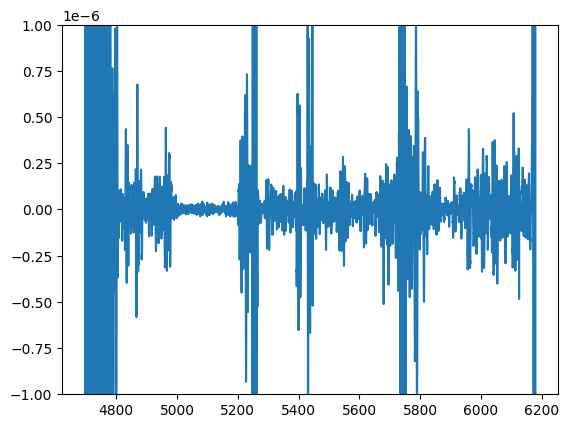

In [13]:
spectra = np.array([np.load(os.path.join(bank_1_dir, file))[1] for file in os.listdir(bank_1_dir)])
inner = state_best == 1
outer = state_best == -1
inner_mean = np.mean(spectra[inner], axis=0)
outer_mean = np.mean(spectra[outer], axis=0)
asymmetry_best = (inner_mean - outer_mean) / (inner_mean + outer_mean)
plt.plot(xs, asymmetry_best)
plt.ylim(-1e-6, 1e-6)

(5450.0, 5650.0)

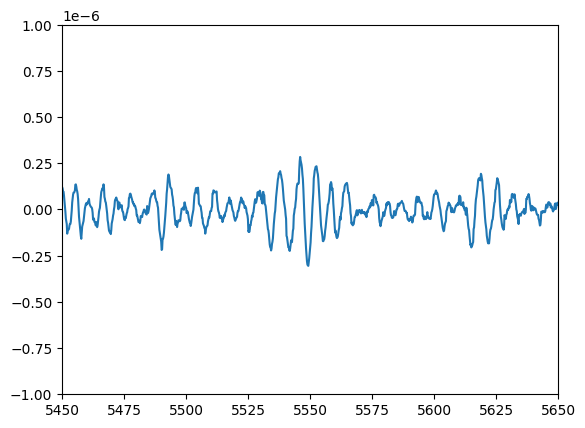

In [14]:
plt.plot(xs, asymmetry_best)
plt.ylim(-1e-6, 1e-6)
plt.xlim(5450, 5650)

Should've guessed...

### Asymmetry distribution

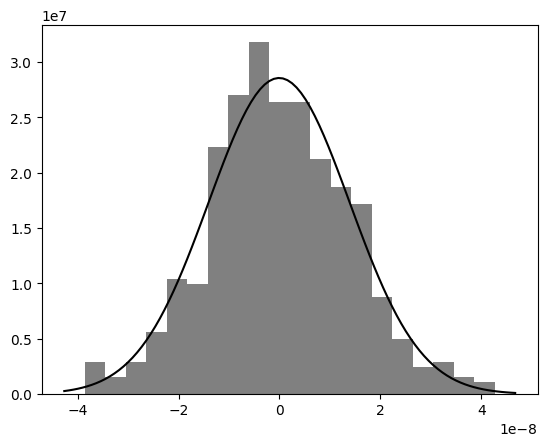

In [15]:
plt.hist(asymmetry_best[xmin:xmax], density=True, color='gray', bins=20)
mean, std = np.mean(asymmetry_best[xmin:xmax]), np.std(asymmetry_best[xmin:xmax])
histmin, histmax = plt.xlim()
x = np.linspace(histmin, histmax, 100)
p = scipy.stats.norm.pdf(x, mean, std)
plt.plot(x, p, c='k')

In [16]:
np.median(asymmetry_best[xmin:xmax])

-5.705242565665418e-10

In [17]:
scipy.stats.median_abs_deviation(asymmetry_best[xmin:xmax])

9.134256893024818e-09

### FFT

In [18]:
xs

array([4695.83129883, 4696.0144043 , 4696.19750977, ..., 6179.35180664,
       6179.53491211, 6179.71801758])

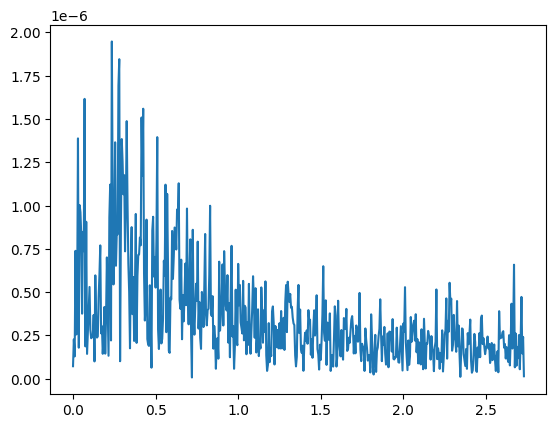

In [19]:
freq_diff = xs[1] - xs[0]
asym = asymmetry_best[xmin:xmax]
N = len(asym)

yf = np.abs(np.fft.rfft(asym))
xf = np.fft.rfftfreq(N, d=freq_diff)
plt.plot(xf, yf)

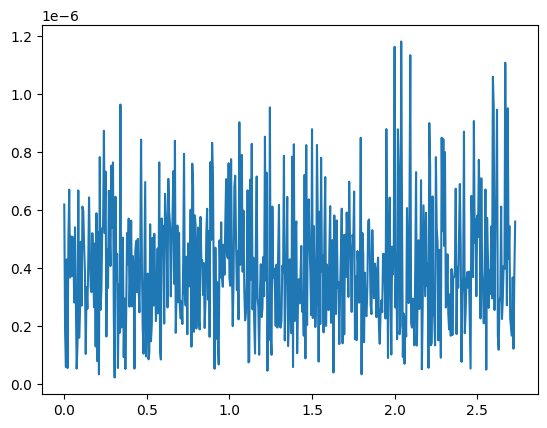

In [22]:
# FFT of a Gaussian
gauss = np.random.normal(0, np.std(asymmetry_best[xmin:xmax]), size=len(asymmetry_best[xmin:xmax]))

yf = np.abs(np.fft.rfft(gauss))
xf = np.fft.rfftfreq(N, d=freq_diff)
plt.plot(xf, yf)

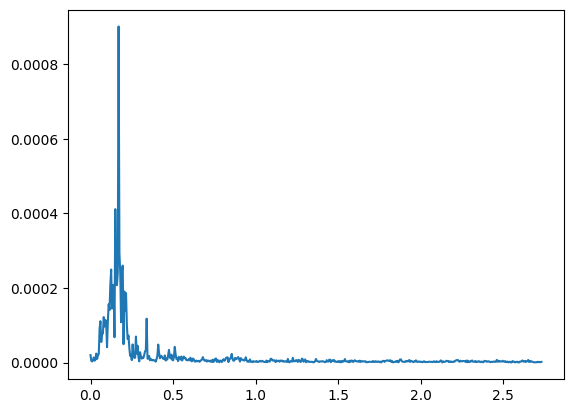

In [28]:
# FFT of bad asymmetry

xs, asym_bad = build_asymmetry(bank_1_dir, info)
xmin = np.argmin(np.abs(xs - 5000))
xmax = np.argmin(np.abs(xs - 5200))

yf = np.abs(np.fft.rfft(asym_bad[xmin:xmax]))
xf = np.fft.rfftfreq(N, d=freq_diff)
plt.plot(xf, yf)

## New neighborhood function: flip or swap, 90 deg cutoff

In [7]:
inner_all_mask = bank_1_info['phi'] < 90
outer_all_mask = bank_1_info['phi'] > 90
sum(inner_all_mask), sum(outer_all_mask)

(715, 2967)

In [7]:
inner_all_inds = [i for i, s in enumerate(inner_all_mask) if s]
outer_all_inds = [i for i, s in enumerate(outer_all_mask) if s]
inner_all_inds

[220,
 222,
 227,
 291,
 312,
 362,
 363,
 364,
 370,
 371,
 372,
 430,
 434,
 435,
 436,
 448,
 450,
 451,
 452,
 453,
 454,
 455,
 463,
 464,
 465,
 466,
 470,
 472,
 476,
 478,
 479,
 481,
 482,
 485,
 486,
 488,
 489,
 493,
 494,
 497,
 499,
 501,
 502,
 503,
 504,
 505,
 506,
 507,
 508,
 509,
 511,
 513,
 514,
 518,
 522,
 525,
 526,
 528,
 529,
 532,
 533,
 536,
 537,
 541,
 543,
 552,
 560,
 567,
 568,
 569,
 574,
 580,
 582,
 584,
 645,
 646,
 647,
 648,
 651,
 652,
 662,
 663,
 664,
 665,
 666,
 667,
 668,
 669,
 670,
 671,
 672,
 673,
 674,
 676,
 677,
 682,
 709,
 715,
 716,
 718,
 719,
 720,
 721,
 722,
 723,
 724,
 725,
 726,
 727,
 728,
 729,
 731,
 735,
 737,
 739,
 744,
 748,
 749,
 758,
 759,
 760,
 761,
 762,
 764,
 765,
 795,
 802,
 851,
 853,
 858,
 859,
 861,
 863,
 865,
 915,
 916,
 921,
 923,
 924,
 927,
 928,
 929,
 930,
 931,
 932,
 933,
 934,
 936,
 937,
 938,
 939,
 941,
 942,
 943,
 944,
 945,
 946,
 947,
 948,
 949,
 950,
 951,
 952,
 953,
 954,
 955,
 956

In [8]:
def next_neighbor(x):
    x_new = x.copy()

    # Pick inner or outer
    if random.random() < 0.5:
        inds = [i for i, s in enumerate(inner_all_mask) if s]
        inner = True
    else:
        inds = [i for i, s in enumerate(outer_all_mask) if s]
        inner = False
    
    # Pick flip or swap
    idx = random.choice(inds)
    if random.random() < 0.5: # Flip
        x_new[idx] = (1 - x_new[idx]) if inner else -(1 + x_new[idx])
    else: # Swap
        inds2 = [i for i in inds if x_new[i] != x_new[idx]]
        idx2 = random.choice(inds2)
        x_new[idx], x_new[idx2] = x_new[idx2], x_new[idx]
    
    return x_new

In [12]:
targs = os.listdir(bank_1_dir)
xs = np.load(os.path.join(bank_1_dir, targs[0]))[0]
xmin = np.argmin(np.abs(xs-5000))
xmax = np.argmin(np.abs(xs-5200))
spectra = np.array([np.load(os.path.join(bank_1_dir, file))[1][xmin:xmax] for file in os.listdir(bank_1_dir)])

def objective(spectra, state):
    inner = state == 1
    outer = state == -1
    inner_mean = np.mean(spectra[inner], axis=0)
    outer_mean = np.mean(spectra[outer], axis=0)
    asymmetry = (inner_mean - outer_mean) / (inner_mean + outer_mean)
    noise = np.std(asymmetry)
    return noise

In [9]:
def simulated_annealing(f, x0, n_iter, T, cooling_rate):
    n = len(x0)

    f_best = f(x0)
    x_best = x0

    xs = [x_best]
    fs = [f_best]

    print(f'Initial f: {f_best}')

    for i in trange(1, n_iter):
        # Generate a new candidate via neighborhood function
        x_new = next_neighbor(x_best)

        # Evaluate the objective
        f_new = f(x_new)
        
        # Delta
        delta = f_new - f_best

        # Accept or reject the candidate
        if delta < 0:
            x_best = x_new
            f_best = f_new
        else:
            p = np.exp(-delta / T)
            if random.random() < p:
                x_best = x_new
                f_best = f_new
        
        # Save state
        xs.append(x_new)
        fs.append(f_new)

        # Decrease temperature every 100 iterations
        if i % 100 == 0:
            T *= cooling_rate
    
    print(f'Final f: {f_best}')

    # Return best state and full chain
    return x_best, f_best, xs, fs

def obj(state):
    return objective(spectra, state)

In [ ]:
def obj(state):
    return objective(spectra, state)

# Initial state
inner_mask = bank_1_info['phi'] < 70
outer_mask = bank_1_info['phi'] > 115
state = np.zeros(len(bank_1_info))
state[inner_mask] = 1
state[outer_mask] = -1

# Run optimization
state_best, noise_best, states, stds = simulated_annealing(obj, state, 100_000, 1e-8, 0.99)

Initial f: 1.795691365666454e-06


  0%|          | 0/99999 [00:00<?, ?it/s]

Final f: 2.2792138668278758e-08


In [ ]:
opt_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/062226/01/'
os.makedirs(opt_dir, exist_ok=True)

np.save(os.path.join(opt_dir, 'best_state.npy'), state_best)
np.save(os.path.join(opt_dir, 'states.npy'), states)
np.save(os.path.join(opt_dir, 'stds.npy'), stds)

### Plot asymmetry

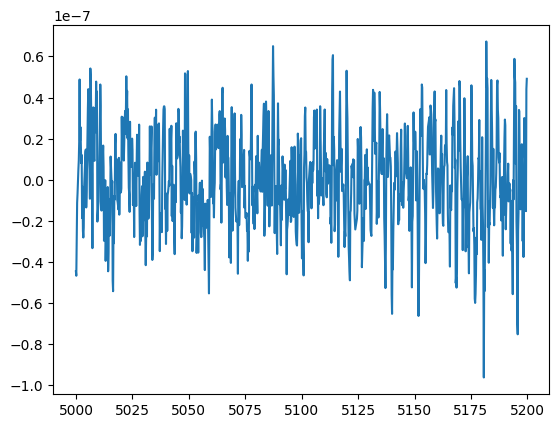

In [16]:
inner = state_best == 1
outer = state_best == -1
inner_mean = np.mean(spectra[inner], axis=0)
outer_mean = np.mean(spectra[outer], axis=0)
asymmetry_best = (inner_mean - outer_mean) / (inner_mean + outer_mean)
plt.plot(xs[xmin:xmax], asymmetry_best)

### Gif

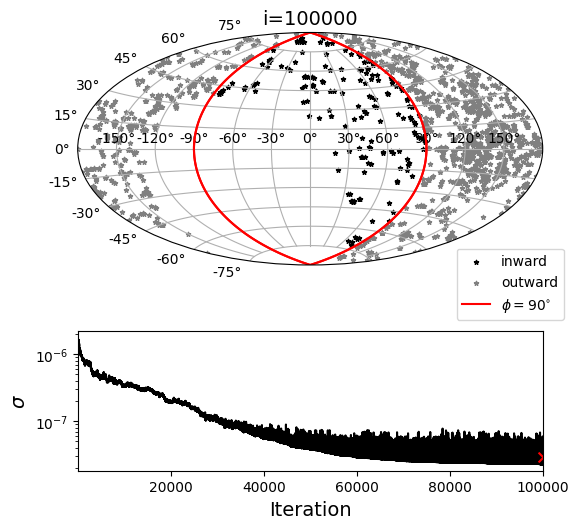

In [ ]:
from matplotlib.animation import FuncAnimation
fig = plt.figure(figsize=(6, 6))
gs = fig.add_gridspec(2, 1, height_ratios=[2, 1])
ax1 = fig.add_subplot(gs[0], projection='aitoff')
ax2 = fig.add_subplot(gs[1])

ax1.grid(zorder=0)

inner_sc = ax1.scatter([], [], s=10, marker='*', c='k', label='inward')
outer_sc = ax1.scatter([], [], s=10, marker='*', c='gray', label='outward')
ax1.plot([-np.pi/2, -np.pi/2], [-np.pi/2, np.pi/2], c='r')
ax1.plot([np.pi/2, np.pi/2], [np.pi/2, -np.pi/2], c='r', label=r'$\phi=90^{\circ}$')
ax1.legend(bbox_to_anchor=(0.8, 0.1))

iters = ax2.plot(range(1, 100_001), stds, c='k')
ax2.set_xlim(1, 100_000)
ax2.set_xlabel('Iteration', fontsize=14)
ax2.set_ylabel(r'$\sigma$', fontsize=14)
ax2.set_yscale('log')
pt = ax2.scatter([], [], color='r', marker='x', s=50, zorder=2)

text = ax1.set_title('n=0', fontsize=14)

l_ = np.linspace(-np.pi, np.pi, 1000)
b_ = np.linspace(-np.pi/2, np.pi/2, 1000)
L, B = np.meshgrid(l_, b_)

def get_theta_phi(l, b):
    galactic_coords = SkyCoord(l, b, unit='rad', frame='galactic')
    v_sun = SkyCoord(90, 0, unit='deg', frame='galactic')
    v_gc = SkyCoord(0, 0, unit='deg', frame='galactic')
    theta = v_sun.separation(galactic_coords).deg
    phi = v_gc.separation(galactic_coords).deg
    return theta, phi

THETA, PHI = get_theta_phi(L, B)
phi_contour = ax1.contour(L, B, (PHI-90), [0], colors='r')

def frame(idx):
    state = states[idx]

    inner = state == 1
    outer = state == -1
    inner_info = bank_1_info[inner]
    outer_info = bank_1_info[outer]

    inner_gal = SkyCoord(inner_info['l'], inner_info['b'], unit='deg', frame='galactic')
    outer_gal = SkyCoord(outer_info['l'], outer_info['b'], unit='deg', frame='galactic')
    
    inner_plot = np.array([inner_gal.l.wrap_at('180d').radian, inner_gal.b.radian]).T
    outer_plot = np.array([outer_gal.l.wrap_at('180d').radian, outer_gal.b.radian]).T
    inner_sc.set_offsets(inner_plot)
    outer_sc.set_offsets(outer_plot)

    pt.set_offsets([idx+1, stds[idx]])

    text.set_text(f'i={idx+1}')

    return inner_sc, outer_sc, pt, text

def draw():
    return frame(0) # i=1

def animate(i):
    return frame((i+1)*100-1) #i=multiple of 100
    
anim = FuncAnimation(
    fig=fig,
    func=animate,
    frames=1000,
    blit=True
)

save_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/062226/01/movie.gif'
anim.save(save_dir, writer='pillow', fps=60, dpi=300)

In [20]:
# Size of populations
inner = state_best == 1
outer = state_best == -1
inner_info = bank_1_info[inner]
outer_info = bank_1_info[outer]
len(inner_info), len(outer_info)

(181, 1272)

## The big test: full bank 1 asymmetry MAD

In [18]:
import time

In [42]:
def objective_mad(spectra, state):
    inner = state == 1
    outer = state == -1
    
    inner_mean = np.mean(spectra[inner], axis=0)
    outer_mean = np.mean(spectra[outer], axis=0)
    
    asymmetry = (inner_mean - outer_mean) / (inner_mean + outer_mean)

    noise = scipy.stats.median_abs_deviation(asymmetry)

    return noise

In [43]:
# FULL bank 1 spectra
spectra = np.array([np.load(os.path.join(bank_1_dir, file))[1] for file in os.listdir(bank_1_dir)])

def obj_mad(state):
    return objective_mad(spectra, state)

# Initial state
inner_mask = bank_1_info['phi'] < 70
outer_mask = bank_1_info['phi'] > 115
state = np.zeros(len(bank_1_info))
state[inner_mask] = 1
state[outer_mask] = -1

# Run optimization
state_best, noise_best, states, stds = simulated_annealing(obj_mad, state, 100_000, 1e-8, 0.99)

Initial f: 1.105274672383749e-06


  0%|          | 0/99999 [00:00<?, ?it/s]

Final f: 8.30144821575582e-08


In [ ]:
opt_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/062226/02/'
os.makedirs(opt_dir, exist_ok=True)

np.save(os.path.join(opt_dir, 'best_state.npy'), state_best)
np.save(os.path.join(opt_dir, 'states.npy'), states)
np.save(os.path.join(opt_dir, 'stds.npy'), stds)

In [45]:
# Size of populations
inner = state_best == 1
outer = state_best == -1
inner_info = bank_1_info[inner]
outer_info = bank_1_info[outer]
len(inner_info), len(outer_info)

(237, 1420)

(-1e-05, 1e-05)

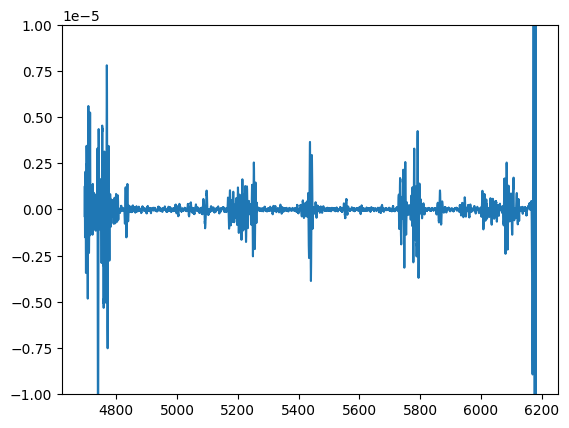

In [53]:
inner = state_best == 1
outer = state_best == -1
inner_mean = np.mean(spectra[inner], axis=0)
outer_mean = np.mean(spectra[outer], axis=0)
asymmetry_best = (inner_mean - outer_mean) / (inner_mean + outer_mean)
plt.plot(xs, asymmetry_best)
plt.ylim(-1e-5, 1e-5)
#plt.xlim(5000, 5200)

## 1e-29 signal at 5650 MHz

In [ ]:
def normalize_wrapper(file, freq=None, b=1, exterior=3, inject=False):
    if inject:
        data = inject_calibrated_cband(
            file,
            freq,
            info,
            data_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1',
            calibration_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/median_sefds/1',
            signal_sizes=1e-29
        )
    else:
        data = np.load(os.path.join('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1', file))
    norm = normalize_weighted(
        data,
        freq=freq,
        width=100,
        b=b,
        exterior=exterior
    )
    return file[:-4], norm

def build_asymmetry(data_dict, state):
    inner_spectra = [spec[1] for x, spec in zip(state, data_dict.values()) if x == 1]
    outer_spectra = [spec[1] for x, spec in zip(state, data_dict.values()) if x == -1]

    inner_mean = np.mean(inner_spectra, axis=0)
    outer_mean = np.mean(outer_spectra, axis=0)

    xs = list(data_dict.values())[0][0]
    asymmetry = (inner_mean - outer_mean) / (inner_mean + outer_mean)
    return xs, asymmetry

In [ ]:
bank_1_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01/decay/1'
info = pd.read_csv('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/all_cband_info.csv')
bank_1_info = info[info['source'].apply(lambda l: l+'.npy').isin(os.listdir(bank_1_dir))]
inner_mask = bank_1_info['phi'] < 70
outer_mask = bank_1_info['phi'] > 115
original_state = np.zeros(len(bank_1_info))
original_state[inner_mask] = 1
original_state[outer_mask] = -1
targs = os.listdir(bank_1_dir)
xs = np.load(os.path.join(bank_1_dir, targs[0]))[0]
xmin = np.argmin(np.abs(xs-5550))
xmax = np.argmin(np.abs(xs-5750))
spectra = np.array([np.load(os.path.join(bank_1_dir, file))[1][xmin:xmax] for file in os.listdir(bank_1_dir)])

In [ ]:
opt_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/062226/02/'
state_best = np.load(os.path.join(opt_dir, 'best_state.npy'))

In [37]:
files = bank_1_info['source'].apply(lambda l: l + '.npy')
print(files)
with Pool(processes=10) as p:
    norm_inj_partial = partial(normalize_wrapper, freq=5650, inject=True)
    norm_uninj_partial = partial(normalize_wrapper, freq=5650, inject=False)
    norm_inj_dict = dict(tqdm(p.imap(norm_inj_partial, files), total=len(files)))
    norm_uninj_dict = dict(tqdm(p.imap(norm_uninj_partial, files), total=len(files)))

0        HIP26505.npy
1        HIP38956.npy
2        HIP24680.npy
3        HIP25749.npy
4        HIP26556.npy
            ...      
3930    HIP117419.npy
3931    HIP117259.npy
3935     HIP26519.npy
3936     HIP24380.npy
3937     HIP27126.npy
Name: source, Length: 3682, dtype: object


  0%|          | 0/3682 [00:00<?, ?it/s]

  0%|          | 0/3682 [00:00<?, ?it/s]

In [10]:
def calculate_asymmetry_snr(xs, inj, freq, window=10):
    mask = abs(xs - freq) < window
    window_ys = inj[mask]
    signal = np.max(window_ys)
    noise = np.std(inj[~mask])
    return signal / noise

Before SNR: 15.02957439001494
After SNR: 13.20377359217682


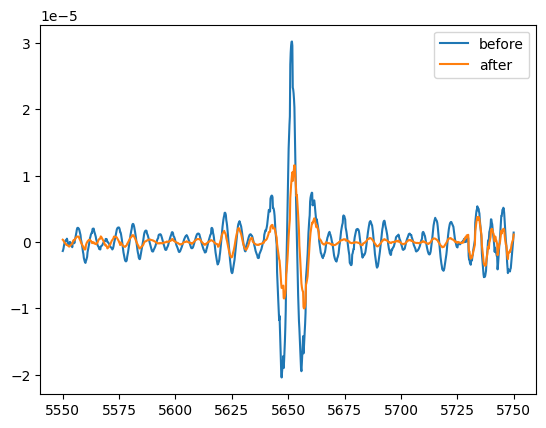

In [38]:
xs, asymmetry_inj = build_asymmetry(norm_inj_dict, original_state)
xs, asymmetry_uninj = build_asymmetry(norm_uninj_dict, original_state)
xs, asymmetry_inj_best = build_asymmetry(norm_inj_dict, state_best)
xs, asymmetry_uninj_best = build_asymmetry(norm_uninj_dict, state_best)

fig, ax = plt.subplots()
ax.plot(xs, asymmetry_inj, label='before')
ax.plot(xs, asymmetry_inj_best, label='after')
ax.legend()

before_snr = calculate_asymmetry_snr(xs, asymmetry_inj, 5650)
after_snr = calculate_asymmetry_snr(xs, asymmetry_inj_best, 5650)
print(f'Before SNR: {before_snr}')
print(f'After SNR: {after_snr}')

In [36]:
def indicator(phi):
    if phi < 70:
        return 1
    elif phi > 115:
        return -1
    return 0
test = bank_1_info['phi'].apply(indicator)
sum(original_state == test)

3682

### Templates

In [ ]:
def normalize_wrapper(file, freq=None, b=1, exterior=3, inject=False):
    if inject:
        data = inject_calibrated_cband(
            file,
            freq,
            info,
            data_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1',
            calibration_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/median_sefds/1',
            signal_sizes=1e-29,
            template=True
        )
    else:
        data = np.load(os.path.join('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1', file))
    norm = normalize_weighted(
        data,
        freq=freq,
        width=100,
        b=b,
        exterior=exterior
    )
    return file[:-4], norm

In [4]:
def build_asymmetry(data_dict, state):
    inner_spectra = [spec[1] for x, spec in zip(state, data_dict.values()) if x == 1]
    outer_spectra = [spec[1] for x, spec in zip(state, data_dict.values()) if x == -1]

    inner_mean = np.mean(inner_spectra, axis=0)
    outer_mean = np.mean(outer_spectra, axis=0)

    xs = list(data_dict.values())[0][0]
    asymmetry = (inner_mean - outer_mean) / (inner_mean + outer_mean)
    return xs, asymmetry

In [7]:
files = bank_1_info['source'].apply(lambda l: l + '.npy')
print(files)
with Pool(processes=10) as p:
    norm_inj_partial = partial(normalize_wrapper, freq=5650, inject=True)
    norm_uninj_partial = partial(normalize_wrapper, freq=5650, inject=False)
    norm_inj_dict = dict(tqdm(p.imap(norm_inj_partial, files), total=len(files)))
    norm_uninj_dict = dict(tqdm(p.imap(norm_uninj_partial, files), total=len(files)))

0        HIP26505.npy
1        HIP38956.npy
2        HIP24680.npy
3        HIP25749.npy
4        HIP26556.npy
            ...      
3930    HIP117419.npy
3931    HIP117259.npy
3935     HIP26519.npy
3936     HIP24380.npy
3937     HIP27126.npy
Name: source, Length: 3682, dtype: object


  0%|          | 0/3682 [00:00<?, ?it/s]

  0%|          | 0/3682 [00:00<?, ?it/s]

Before SNR: 0.0001798530998585893
After SNR: 7.228746785309304e-05


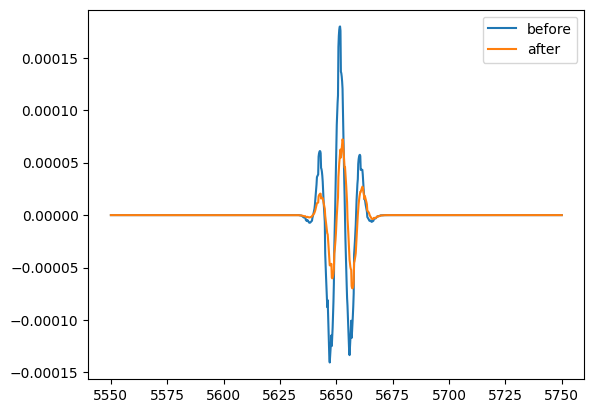

In [8]:
xs, asymmetry_inj = build_asymmetry(norm_inj_dict, original_state)
xs, asymmetry_uninj = build_asymmetry(norm_uninj_dict, original_state)
xs, asymmetry_inj_best = build_asymmetry(norm_inj_dict, state_best)
xs, asymmetry_uninj_best = build_asymmetry(norm_uninj_dict, state_best)

fig, ax = plt.subplots()
ax.plot(xs, asymmetry_inj, label='before')
ax.plot(xs, asymmetry_inj_best, label='after')
ax.legend()

before_snr = np.max(asymmetry_inj)
after_snr = np.max(asymmetry_inj_best)
print(f'Before SNR: {before_snr}')
print(f'After SNR: {after_snr}')

In [10]:
files = bank_1_info['source'].apply(lambda l: l + '.npy')
spectra = np.array([file for file in os.listdir(bank_1_dir)])
files

0        HIP26505.npy
1        HIP38956.npy
2        HIP24680.npy
3        HIP25749.npy
4        HIP26556.npy
            ...      
3930    HIP117419.npy
3931    HIP117259.npy
3935     HIP26519.npy
3936     HIP24380.npy
3937     HIP27126.npy
Name: source, Length: 3682, dtype: object

In [11]:
spectra

array(['HIP27188.npy', 'HIP26505.npy', 'HIP26006.npy', ...,
       'HIP24380.npy', 'HIP27126.npy', 'HIP26519.npy'], dtype='<U13')

### Testy westy

In [32]:
asymmetry

array([5.08754655e-07, 5.86007046e-07, 6.30913659e-07, ...,
       8.36384314e-07, 1.05286651e-06, 1.19281813e-06])

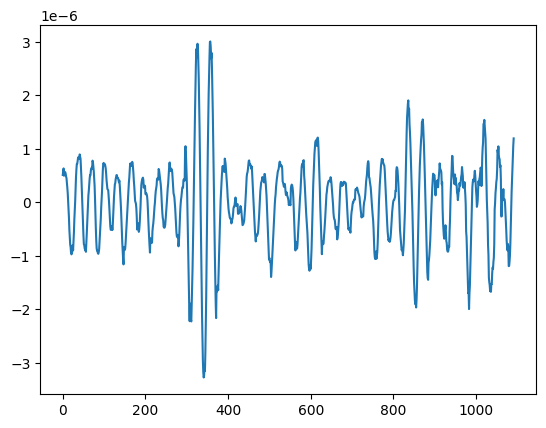

In [33]:
plt.plot(asymmetry)

In [34]:
xs_temp = np.arange(len(asymmetry))
asymmetry = scipy.interpolate.make_interp_spline(xs_temp[::15], asymmetry[::15], k=3)(xs_temp)

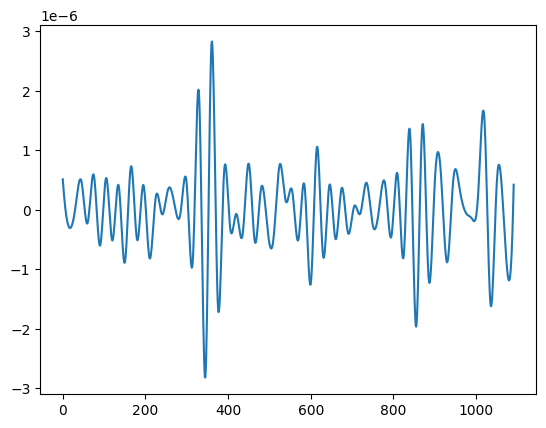

In [35]:
plt.plot(asymmetry)

### Template_peak / MAD SNR test

In [ ]:
opt_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/062326/01/'
state_best = np.load(os.path.join(opt_dir, 'best_state.npy'))

In [5]:
def calculate_asymmetry_snr(xs, uninj, inj, freq, window=10):
    mask = abs(xs - freq) < window
    window_ys = inj[mask]
    signal = np.max(window_ys)
    noise = scipy.stats.median_abs_deviation(inj[~mask]) #np.std(uninj)
    return signal / noise

Before SNR: 25.258496135096646
After SNR: 132.78323241531837


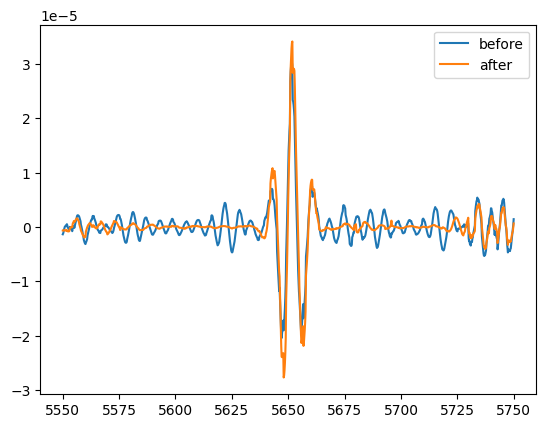

In [56]:
# files = bank_1_info['source'].apply(lambda l: l + '.npy')
# print(files)
# with Pool(processes=10) as p:
#     norm_inj_partial = partial(normalize_wrapper, freq=5650, inject=True)
#     norm_uninj_partial = partial(normalize_wrapper, freq=5650, inject=False)
#     norm_inj_dict = dict(tqdm(p.imap(norm_inj_partial, files), total=len(files)))
#     norm_uninj_dict = dict(tqdm(p.imap(norm_uninj_partial, files), total=len(files)))

xs, asymmetry_inj = build_asymmetry(norm_inj_dict, original_state)
xs, asymmetry_uninj = build_asymmetry(norm_uninj_dict, original_state)
xs, asymmetry_inj_best = build_asymmetry(norm_inj_dict, state_best)
xs, asymmetry_uninj_best = build_asymmetry(norm_uninj_dict, state_best)

fig, ax = plt.subplots()
ax.plot(xs, asymmetry_inj, label='before')
ax.plot(xs, asymmetry_inj_best, label='after')
ax.legend()

before_snr = calculate_asymmetry_snr(xs, asymmetry_uninj, asymmetry_inj, 5650)
after_snr = calculate_asymmetry_snr(xs, asymmetry_uninj_best, asymmetry_inj_best, 5650)
print(f'Before SNR: {before_snr}')
print(f'After SNR: {after_snr}')

#### Save the normalized spectra for future use

In [ ]:
def save_all(data_dict, subdir):
    path = f'/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/norm_1e29_5650_tests/{subdir}'
    os.makedirs(path, exist_ok=True)
    for name, spec in data_dict.items():
        np.save(os.path.join(path, name), spec)

save_all(norm_inj_dict, 'injected')
save_all(norm_uninj_dict, 'uninjected')

#### 062326/02

In [ ]:
def load_all(subdir):
    path = f'/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/norm_1e29_5650_tests/{subdir}'
    data_dict = {
        file[:-4]: np.load(os.path.join(path, file))
        for file in bank_1_info['source'].apply(lambda l: l + '.npy')
    }
    return data_dict

norm_inj_dict = load_all('injected')
norm_uninj_dict = load_all('uninjected')

In [7]:
norm_inj_dict.keys()

dict_keys(['HIP26505', 'HIP38956', 'HIP24680', 'HIP25749', 'HIP26556', 'HIP26006', 'HIP26801', 'HIP25808', 'HIP26124', 'HIP26779', 'HIP95087', 'HIP25650', 'HIP27188', 'HIP26408', 'HIP27018', 'HIP26429', 'HIP115872', 'HIP115369', 'HIP38304', 'HIP96001', 'HIP115613', 'HIP38488', 'HIP95178', 'HIP38248', 'HIP115714', 'HIP96137', 'HIP51066', 'HIP115482', 'HIP51468', 'HIP53985', 'HIP51411', 'HIP51648', 'HIP53355', 'HIP53417', 'HIP53299', 'HIP53370', 'HIP53443', 'HIP54155', 'HIP53441', 'HIP53326', 'HIP53430', 'HIP54182', 'HIP53539', 'HIP53591', 'HIP53454', 'HIP54426', 'HIP53596', 'HIP112829', 'HIP53894', 'HIP112641', 'HIP96526', 'HIP83772', 'HIP112846', 'HIP53688', 'HIP82887', 'HIP84714', 'HIP112904', 'HIP111309', 'HIP110924', 'HIP113023', 'HIP82066', 'HIP82522', 'HIP80946', 'HIP114425', 'HIP83128', 'HIP111489', 'HIP111029', 'HIP111028', 'HIP111214', 'HIP82065', 'HIP112500', 'HIP110888', 'HIP111249', 'HIP83919', 'HIP84179', 'HIP82718', 'HIP111528', 'HIP36899', 'HIP114788', 'HIP81961', 'HIP111

In [8]:
def build_asymmetry(data_dict, state):
    inner_spectra = [spec[1] for x, spec in zip(state, data_dict.values()) if x == 1]
    outer_spectra = [spec[1] for x, spec in zip(state, data_dict.values()) if x == -1]

    inner_mean = np.mean(inner_spectra, axis=0)
    outer_mean = np.mean(outer_spectra, axis=0)

    xs = list(data_dict.values())[0][0]
    asymmetry = (inner_mean - outer_mean) / (inner_mean + outer_mean)
    return xs, asymmetry

def calculate_asymmetry_snr(xs, uninj, inj, freq, window=10):
    mask = abs(xs - freq) < window
    window_ys = inj[mask]
    signal = np.max(window_ys)
    noise = scipy.stats.median_abs_deviation(inj[~mask]) #np.std(uninj[mask]) #scipy.stats.median_abs_deviation(uninj) #np.std(uninj)
    return signal / noise

In [ ]:
opt_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/062326/02/'
state_best = np.load(os.path.join(opt_dir, 'best_state.npy'))

Before SNR: 25.258496135096646
After SNR: 188.50539725786095


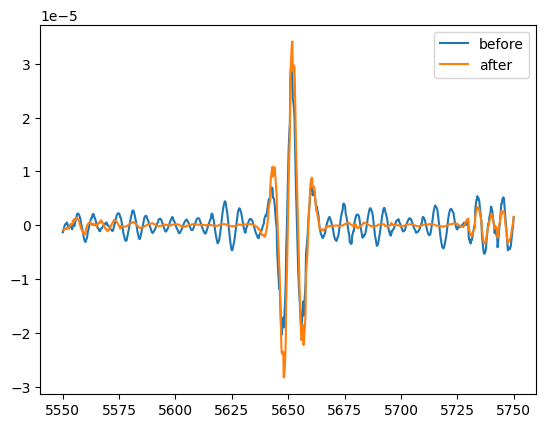

In [59]:
xs, asymmetry_inj = build_asymmetry(norm_inj_dict, original_state)
xs, asymmetry_uninj = build_asymmetry(norm_uninj_dict, original_state)
xs, asymmetry_inj_best = build_asymmetry(norm_inj_dict, state_best)
xs, asymmetry_uninj_best = build_asymmetry(norm_uninj_dict, state_best)

fig, ax = plt.subplots()
ax.plot(xs, asymmetry_inj, label='before')
ax.plot(xs, asymmetry_inj_best, label='after')
ax.legend()

before_snr = calculate_asymmetry_snr(xs, asymmetry_uninj, asymmetry_inj, 5650)
after_snr = calculate_asymmetry_snr(xs, asymmetry_uninj_best, asymmetry_inj_best, 5650)
print(f'Before SNR: {before_snr}')
print(f'After SNR: {after_snr}')

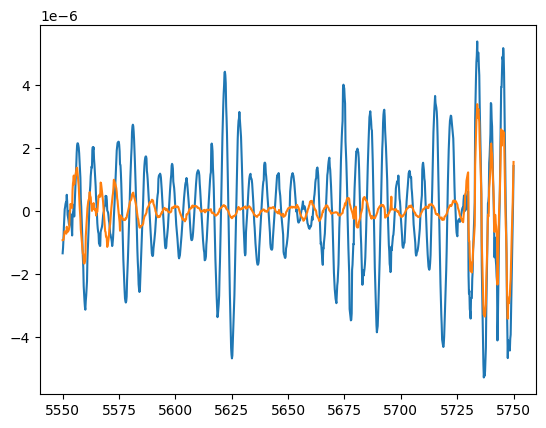

In [34]:
fig, ax = plt.subplots()
ax.plot(xs, asymmetry_uninj, label='before')
ax.plot(xs, asymmetry_uninj_best, label='after')

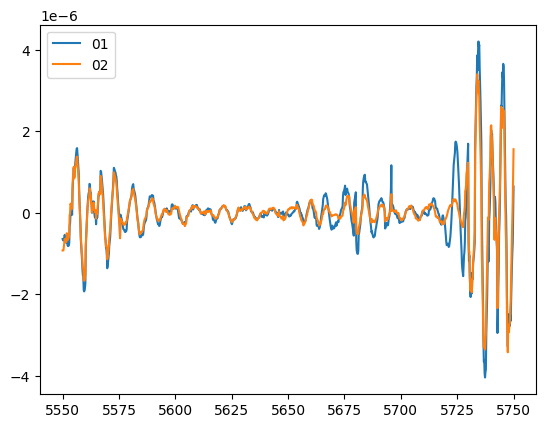

In [ ]:
state_best_1 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/062326/01/best_state.npy')
xs, asymmetry_uninj = build_asymmetry(norm_uninj_dict, state_best)
xs, asymmetry_uninj_1 = build_asymmetry(norm_uninj_dict, state_best_1)

fig, ax = plt.subplots()
ax.plot(xs, asymmetry_uninj_1, label='01')
ax.plot(xs, asymmetry_uninj, label='02')
ax.legend()


## Bleh

In [ ]:
state_best = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/062326/01/best_state.npy')
sum(state_best == 1), sum(state_best == -1)

(268, 1968)

In [ ]:
print([x for x in np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/062326/01/stds.npy')[:1000]])

[159.98392967203927, 159.34693133031467, 160.48577513414162, 160.3230878074143, 160.21893219062034, 160.29727429564676, 160.53919477213176, 159.42976377248226, 160.79679568762975, 160.71526669953354, 160.7077765809014, 160.8084661527409, 161.30893924516764, 161.04453910466543, 160.9844446902576, 161.26832977797667, 161.38310452141576, 160.55575083184377, 160.83849078700132, 161.4427125267675, 161.5925885766822, 161.63632037184385, 161.38513397729784, 161.2125384033896, 161.84461398763406, 161.66233572950873, 162.14874963236903, 162.67199502898612, 162.73999943352203, 160.4776729185579, 162.86018238635924, 162.8097006684591, 162.65182408908623, 162.84800683397353, 162.35928850101558, 163.00768191458707, 162.83997318884133, 162.90360615533055, 162.53430447733294, 163.16773064994302, 161.57613403631078, 164.18485271175584, 163.67696157274003, 164.1042915050093, 164.02465559618884, 165.32699724835453, 164.93604983916168, 164.97595861481116, 165.23094759140466, 165.2863640770944, 164.006966

In [ ]:
print([x for x in np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/062226/01/stds.npy')[:10]])

[1.795691365666454e-06, 1.7982762034653268e-06, 1.791670291510076e-06, 1.7881004156442158e-06, 1.786370859739811e-06, 1.7676150485490688e-06, 1.7634446142466693e-06, 1.762733982707691e-06, 1.7619755921912306e-06, 1.774228033301944e-06]


In [ ]:
state_best = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/062326/02/best_state.npy')
sum(state_best == 1), sum(state_best == -1)

(252, 1650)

#### 062426/01

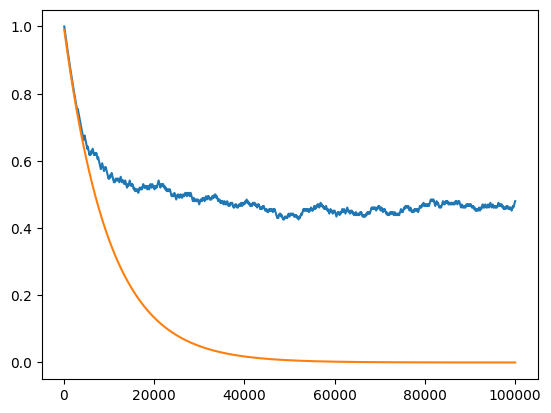

In [ ]:
temps = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/062426/01/temps.npy')
plt.plot(np.arange(100, 100_001, 100), temps)
plt.plot(np.arange(100, 100_001, 100), 0.99 ** (np.arange(1, 1001)))


Before SNR: 25.258496135096646
After SNR: 220.7711895635319


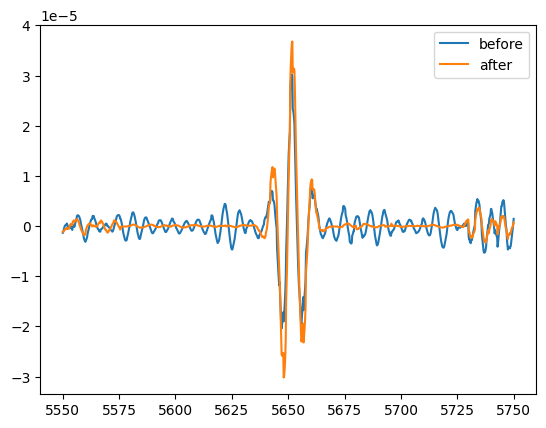

In [ ]:
opt_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/062426/01/'
state_best = np.load(os.path.join(opt_dir, 'best_state.npy'))

xs, asymmetry_inj = build_asymmetry(norm_inj_dict, original_state)
xs, asymmetry_uninj = build_asymmetry(norm_uninj_dict, original_state)
xs, asymmetry_inj_best = build_asymmetry(norm_inj_dict, state_best)
xs, asymmetry_uninj_best = build_asymmetry(norm_uninj_dict, state_best)

fig, ax = plt.subplots()
ax.plot(xs, asymmetry_inj, label='before')
ax.plot(xs, asymmetry_inj_best, label='after')
ax.legend()

before_snr = calculate_asymmetry_snr(xs, asymmetry_uninj, asymmetry_inj, 5650)
after_snr = calculate_asymmetry_snr(xs, asymmetry_uninj_best, asymmetry_inj_best, 5650)
print(f'Before SNR: {before_snr}')
print(f'After SNR: {after_snr}')

#### 062526/01

Before SNR: 25.258496135096646
After SNR: 267.75204638077525


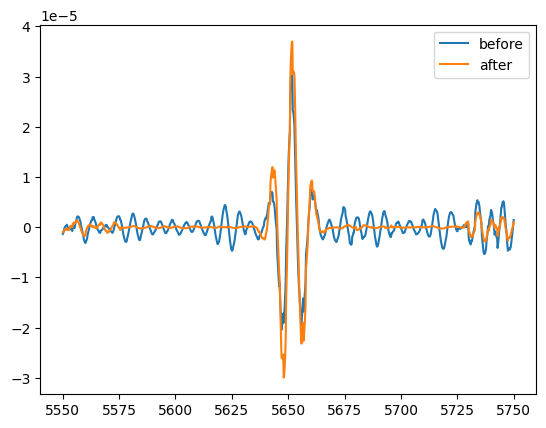

In [ ]:
opt_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/062526/01/'
state_best = np.load(os.path.join(opt_dir, 'best_state.npy'))

xs, asymmetry_inj = build_asymmetry(norm_inj_dict, original_state)
xs, asymmetry_uninj = build_asymmetry(norm_uninj_dict, original_state)
xs, asymmetry_inj_best = build_asymmetry(norm_inj_dict, state_best)
xs, asymmetry_uninj_best = build_asymmetry(norm_uninj_dict, state_best)

fig, ax = plt.subplots()
ax.plot(xs, asymmetry_inj, label='before')
ax.plot(xs, asymmetry_inj_best, label='after')
ax.legend()

before_snr = calculate_asymmetry_snr(xs, asymmetry_uninj, asymmetry_inj, 5650)
after_snr = calculate_asymmetry_snr(xs, asymmetry_uninj_best, asymmetry_inj_best, 5650)
print(f'Before SNR: {before_snr}')
print(f'After SNR: {after_snr}')

## b_0.5_ext_5

In [ ]:
norm_partial = partial(
    normalize_weighted,
    b=0.5,
    exterior=5,
    data_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1',
    save_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/bank_1_b_0.5_ext_5'
)

bank_1_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1'
info = pd.read_csv('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/all_cband_info.csv')
bank_1_info = info[info['source'].apply(lambda l: l + '.npy').isin(os.listdir(bank_1_dir))]
files = bank_1_info['source'].apply(lambda l: l + '.npy')

with Pool(processes=10) as p:
    _ = list(tqdm(p.imap_unordered(norm_partial, files), total=len(files)))

  0%|          | 0/3682 [00:00<?, ?it/s]

In [ ]:
def norm():
    return normalize_weighted(
        os.listdir('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1')[0],
        data_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1'
    )

In [9]:
import time
start = time.perf_counter()
_ = norm()
end = time.perf_counter()
print(end-start)

8.578350679017603


In [ ]:
from numba import njit

@njit
def norm_numba():
    return normalize_weighted(
        os.listdir('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1')[0],
        data_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1'
    )

SystemError: initialization of _internal failed without raising an exception

In [11]:
%pip show numpy numba

Name: numpy
Version: 1.26.4
Summary: Fundamental package for array computing in Python
Home-page: https://numpy.org
Author: Travis E. Oliphant et al.
Author-email: 
License: Copyright (c) 2005-2023, NumPy Developers.
        All rights reserved.
        
        Redistribution and use in source and binary forms, with or without
        modification, are permitted provided that the following conditions are
        met:
        
            * Redistributions of source code must retain the above copyright
               notice, this list of conditions and the following disclaimer.
        
            * Redistributions in binary form must reproduce the above
               copyright notice, this list of conditions and the following
               disclaimer in the documentation and/or other materials provided
               with the distribution.
        
            * Neither the name of the NumPy Developers nor the names of any
               contributors may be used to endorse or promo

## Interactive movie!

In [3]:
%matplotlib widget

In [4]:
from matplotlib import widgets
from matplotlib.ticker import MultipleLocator

In [ ]:
# Functions and stuff
def build_asymmetry(state):
    '''Form asymmetry from a given state.'''
    inner = state == 1
    outer = state == -1
    
    inner_mean = np.mean(spectra[inner], axis=0)
    outer_mean = np.mean(spectra[outer], axis=0)
    
    asymmetry = (inner_mean - outer_mean) / (inner_mean + outer_mean)
    
    return asymmetry

# Bank 1 info
bank_1_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01/decay/1'
info = pd.read_csv('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/all_cband_info.csv')
bank_1_info = info[info['source'].apply(lambda l: l + '.npy').isin(os.listdir(bank_1_dir))]

# All bank 1 spectra, full range
files = bank_1_info['source'].apply(lambda l: l + '.npy')
xs = np.load(os.path.join(bank_1_dir, files[0]))[0]
spectra = np.array([np.load(os.path.join(bank_1_dir, file))[1] for file in files])

In [ ]:
# Load in states
states = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/062326/02/states.npy')
objs = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/062326/02/stds.npy')

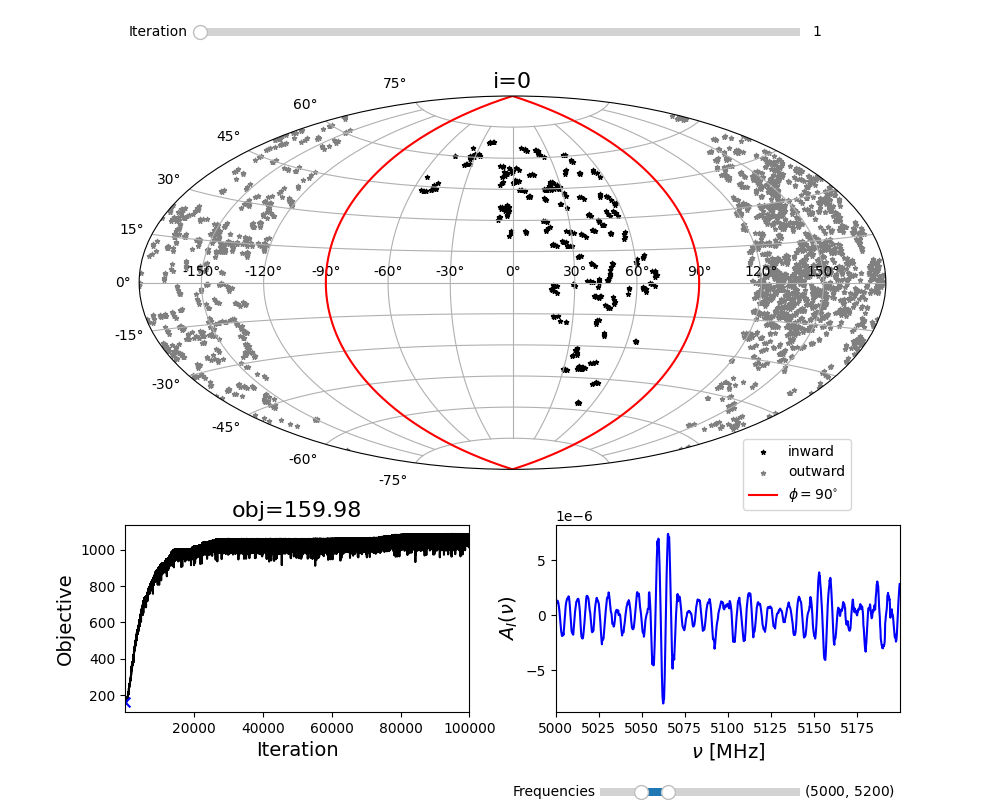

In [7]:
fig = plt.figure(figsize=(10, 8))
gs = fig.add_gridspec(2, 2, height_ratios=[2, 1], wspace=0.25)
ax1 = fig.add_subplot(gs[0,:], projection='aitoff')
ax2 = fig.add_subplot(gs[1,0])
ax3 = fig.add_subplot(gs[1,1])

ax1.grid(zorder=0)

init_lower = 5000
init_upper = 5200

# global ax3_ylim
# ax3_ylim = (0,0)

inner = states[0] == 1
outer = states[0] == -1
inner_info = bank_1_info[inner]
outer_info = bank_1_info[outer]

inner_gal = SkyCoord(inner_info['l'], inner_info['b'], unit='deg', frame='galactic')
outer_gal = SkyCoord(outer_info['l'], outer_info['b'], unit='deg', frame='galactic')

inner_sc = ax1.scatter(inner_gal.l.wrap_at('180d').radian, inner_gal.b.radian, s=10, marker='*', c='k', label='inward')
outer_sc = ax1.scatter(outer_gal.l.wrap_at('180d').radian, outer_gal.b.radian, s=10, marker='*', c='gray', label='outward')
ax1.plot([-np.pi/2, -np.pi/2], [-np.pi/2, np.pi/2], c='r')
ax1.plot([np.pi/2, np.pi/2], [np.pi/2, -np.pi/2], c='r', label=r'$\phi=90^{\circ}$')

ax1.legend(bbox_to_anchor=(0.8, 0.1))

iters, = ax2.plot(range(1, 100_001), objs, c='k')
ax2.set_xlim(1, 100_000)
ax2.set_xlabel('Iteration', fontsize=14)
ax2.set_ylabel('Objective', fontsize=14)
#ax2.set_yscale('log')
pt = ax2.scatter(1, objs[0], color='b', marker='x', s=50, zorder=2)

xmin = np.argmin(np.abs(xs-init_lower))
xmax = np.argmin(np.abs(xs-init_upper))
asymmetry = build_asymmetry(states[0])
asym, = ax3.plot(xs[xmin:xmax], asymmetry[xmin:xmax], c='b')
ax3.set_xlim(xs[xmin], xs[xmax])
ax3.set_xlabel(r'$\nu$ [MHz]', fontsize=14)
ax3.set_ylabel(r'$A_I(\nu)$', fontsize=14)
ax3.set_autoscale_on(False)

text = ax1.set_title('i=0', fontsize=16)
text2 = ax2.set_title(f'obj={objs[0]:.2f}', fontsize=16)

def update(val):
    idx = iter_slider.val
    state = states[idx-1]

    inner = state == 1
    outer = state == -1
    inner_info = bank_1_info[inner]
    outer_info = bank_1_info[outer]

    inner_gal = SkyCoord(inner_info['l'], inner_info['b'], unit='deg', frame='galactic')
    outer_gal = SkyCoord(outer_info['l'], outer_info['b'], unit='deg', frame='galactic')
    
    inner_plot = np.array([inner_gal.l.wrap_at('180d').radian, inner_gal.b.radian]).T
    outer_plot = np.array([outer_gal.l.wrap_at('180d').radian, outer_gal.b.radian]).T
    inner_sc.set_offsets(inner_plot)
    outer_sc.set_offsets(outer_plot)

    asymmetry = build_asymmetry(state)
    lower, upper = freq_slider.val
    xmin = np.argmin(np.abs(xs-lower))
    xmax = np.argmin(np.abs(xs-upper))
    asym.set_data(xs[xmin:xmax], asymmetry[xmin:xmax])

    pt.set_offsets([idx, objs[idx-1]])
    xitermin, xitermax = idx-10, idx+10
    ax2.set_xlim(xitermin, xitermax)
    ax2.xaxis.set_major_locator(MultipleLocator(5))
    objs_temp = objs[max(0, xitermin-1):min(xitermax-1, 99_999)]
    yitermin, yitermax = min(objs_temp), max(objs_temp)
    ax2.set_ylim(0.99 * yitermin, 1.01 * yitermax)

    text.set_text(f'i={idx}')
    text2.set_text(f'obj={objs[idx-1]:.2f}')

    fig.canvas.draw_idle()

ax_iter = fig.add_axes((0.2, 0.95, 0.6, 0.02))
iter_slider = widgets.Slider(
    ax=ax_iter,
    label="Iteration",
    valmin=1,
    valmax=100_000,
    valinit=1,
    valstep=1,
    orientation="horizontal"
)
iter_slider.on_changed(update)

def change_freq_limits(val):
    xmin = np.argmin(np.abs(xs-val[0]))
    xmax = np.argmin(np.abs(xs-val[1]))
    asymmetry = build_asymmetry(states[iter_slider.val-1])
    asym.set_data(xs[xmin:xmax], asymmetry[xmin:xmax])
    ax3.set_xlim(val[0], val[1])
    fig.canvas.draw_idle()

ax_freq = fig.add_axes((0.6, 0, 0.2, 0.02))
freq_slider = widgets.RangeSlider(
    ax=ax_freq,
    label="Frequencies",
    valmin=xs.min(),
    valmax=xs.max(),
    valinit=(5000, 5200),
    orientation="horizontal"
)
freq_slider.on_changed(change_freq_limits)

# def freeze(labels):
#     ax3_ylim = ax3.get_ylim()
#     fig.canvas.draw_idle()

# rax = fig.add_axes([0.5, 0, 0.1, 0.05])
# check = widgets.CheckButtons(
#     ax=rax,
#     labels=['Freeze y'],
#     actives=[False]
# )
# check.on_clicked(freeze)

def on_key(event):
    if event.key == 'right':
        new_val = min(iter_slider.val + 1, iter_slider.valmax)
        iter_slider.set_val(new_val)
    elif event.key == 'left':
        new_val = max(iter_slider.val - 1, iter_slider.valmin)
        iter_slider.set_val(new_val)

fig.canvas.mpl_connect('key_press_event', on_key)

plt.show()

0

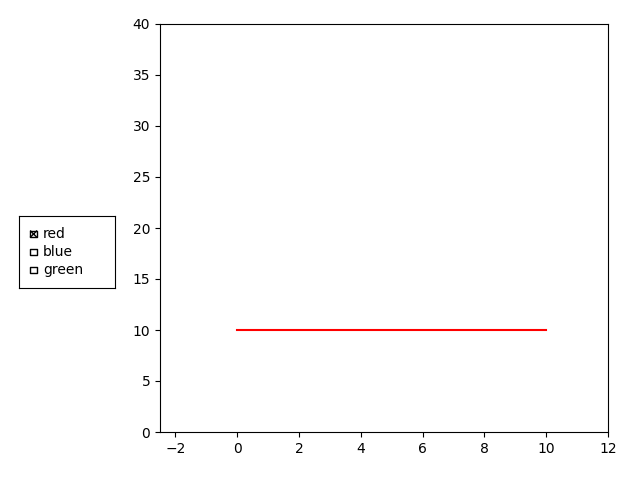

In [40]:
import matplotlib.pyplot as plt
from matplotlib.widgets import CheckButtons

x = range(0, 11)
y1 = [10] * 11
y2 = [20] * 11
y3 = [30] * 11

fig, ax = plt.subplots()
p1, = ax.plot(x, y1, color='red', label='red')
p2, = ax.plot(x, y2, color='blue', label='blue', visible=False)
p3, = ax.plot(x, y3, color='green', label='green', visible=False)
lines = [p1, p2, p3]

plt.axis([-2.5, 12, 0, 40])
plt.subplots_adjust(left=0.25, bottom=0.1, right=0.95, top=0.95)


# checkbuton widget
labels = ['red', 'blue', 'green']
activated = [True, False, False]
axCheckButton = plt.axes([0.03, 0.4, 0.15, 0.15])
chxbox = CheckButtons(axCheckButton, labels, activated)

def set_visible(label):
	index = labels.index(label)
	lines[index].set_visible(not lines[index].get_visible())
	plt.draw()

chxbox.on_clicked(set_visible)


In [ ]:
np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/062926/02/perfs.npy')

array([ 138.29878983,  140.65098679,  149.75258169,  167.73720006,
        170.24418385,  184.14918853,  224.41586945,  220.63932898,
        228.43372923,  259.27263749,  271.50443842,  306.90204542,
        317.01276438,  352.48933293,  366.50845699,  412.58539859,
        421.15358291,  460.79111967,  472.21984352,  495.73827492,
        497.85420459,  538.04542454,  535.92078765,  567.57762183,
        596.16111602,  603.8831214 ,  622.59739618,  658.71427596,
        649.63747308,  676.79100864,  710.22346881,  714.32273112,
        734.40379238,  752.21858178,  788.9930577 ,  788.81764682,
        815.92976692,  815.90393355,  838.81530384,  837.73748839,
        879.56217246,  886.80514404,  893.07157683,  907.04447717,
        953.81225434,  949.26335792,  951.31121598,  997.09819009,
        985.36881012,  998.26896055, 1023.89118392, 1044.36896905,
       1055.58547331, 1080.06233431, 1090.47791408, 1166.42202886,
       1119.27340286, 1129.33186626, 1154.66804747, 1146.37268

# Kurtosis?

In [ ]:
asymmetry = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/063026/02/best_asymmetry.npy')
asymmetry

array([ 1.25969446e-06,  8.18177441e-07,  6.96912671e-07, ...,
       -3.56306442e-04, -7.21415428e-04, -9.67908880e-02])

(array([  58.,   74.,   97.,  114.,  148.,  222.,  287.,  468., 1423.,
        1434., 1255.,  434.,  291.,  219.,  190.,  116.,   76.,   83.,
          59.]),
 array([-3.        , -2.68421053, -2.36842105, -2.05263158, -1.73684211,
        -1.42105263, -1.10526316, -0.78947368, -0.47368421, -0.15789474,
         0.15789474,  0.47368421,  0.78947368,  1.10526316,  1.42105263,
         1.73684211,  2.05263158,  2.36842105,  2.68421053,  3.        ]),
 <BarContainer object of 19 artists>)

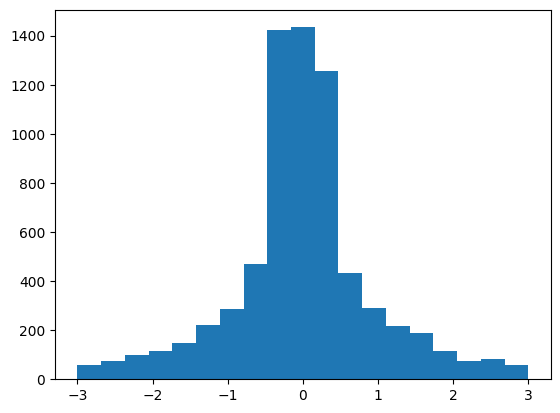

In [12]:
# Remove outliers
q1, q3 = np.percentile(asymmetry, 25), np.percentile(asymmetry, 75)
iqr = q3 - q1
asymmetry_cut = asymmetry[(asymmetry > q1 - 3*iqr) & (asymmetry < q3 + 3*iqr)]
# Standardize
asymmetry_standardized = (asymmetry_cut - np.mean(asymmetry_cut)) / np.std(asymmetry_cut)
bins = np.linspace(-3, 3, 20)
plt.hist(asymmetry_standardized, bins=bins)

In [13]:
scipy.stats.kurtosis(asymmetry_cut)

1.6639955318107837

(array([ 108.,  185.,  313.,  607., 2422., 2250.,  590.,  343.,  181.,
         136.]),
 array([-6.87463131e-07, -5.48851264e-07, -4.10239397e-07, -2.71627529e-07,
        -1.33015662e-07,  5.59620570e-09,  1.44208073e-07,  2.82819941e-07,
         4.21431808e-07,  5.60043675e-07,  6.98655543e-07]),
 <BarContainer object of 10 artists>)

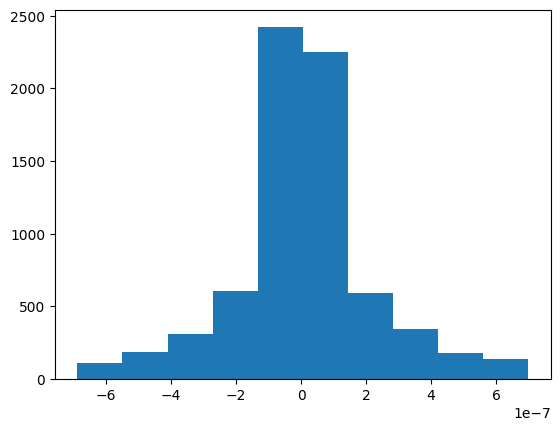

In [14]:
plt.hist(asymmetry_cut)

In [11]:
scipy.stats.kurtosis(asymmetry)

8097.445312507017

## Test - 062026/01 (very first trial; nearly Gaussian)

(array([  3.,  12.,   9.,  18.,  40.,  51.,  96., 120., 149., 123., 123.,
         99.,  90.,  70.,  38.,  17.,  16.,   5.,   5.]),
 array([-3.        , -2.68421053, -2.36842105, -2.05263158, -1.73684211,
        -1.42105263, -1.10526316, -0.78947368, -0.47368421, -0.15789474,
         0.15789474,  0.47368421,  0.78947368,  1.10526316,  1.42105263,
         1.73684211,  2.05263158,  2.36842105,  2.68421053,  3.        ]),
 <BarContainer object of 19 artists>)

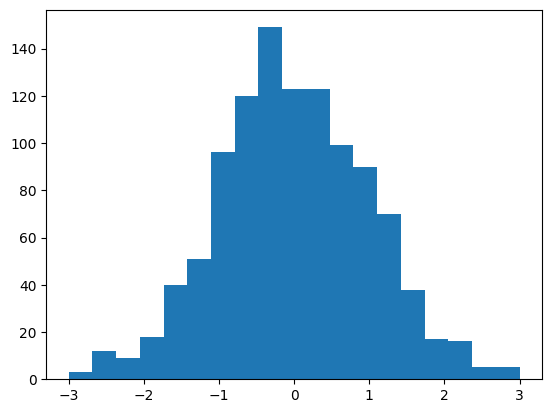

In [ ]:
bank_1_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01/decay/1'
spectra = np.array([np.load(os.path.join(bank_1_dir, file))[1] for file in os.listdir(bank_1_dir)])
state_best = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/062026/01/best_state.npy')
inner = state_best == 1
outer = state_best == -1
inner_mean = np.mean(spectra[inner], axis=0)
outer_mean = np.mean(spectra[outer], axis=0)
asymmetry = (inner_mean - outer_mean) / (inner_mean + outer_mean)

targs = os.listdir(bank_1_dir)
xs = np.load(os.path.join(bank_1_dir, targs[0]))[0]
xmin = np.argmin(np.abs(xs-5000))
xmax = np.argmin(np.abs(xs-5200))

asymmetry = asymmetry[xmin:xmax]

# Remove outliers
q1, q3 = np.percentile(asymmetry, 25), np.percentile(asymmetry, 75)
iqr = q3 - q1
asymmetry_cut = asymmetry[(asymmetry > q1 - 1.5*iqr) & (asymmetry < q3 + 1.5*iqr)]
# Standardize
asymmetry_standardized = (asymmetry_cut - np.mean(asymmetry_cut)) / np.std(asymmetry_cut)
bins = np.linspace(-3, 3, 20)
plt.hist(asymmetry_standardized, bins=bins)

In [36]:
scipy.stats.kurtosis(asymmetry_cut)

-0.04982698153060339

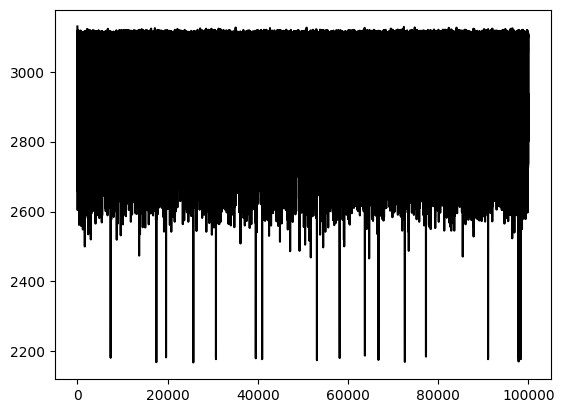

In [ ]:
objs = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/063026/03/stds.npy')
plt.plot(range(1, 100_001), objs, c='k')

In [18]:
max(objs)

3129.624534961419

In [22]:
np.mean(np.abs(np.diff(objs)))

132.37322840957665

# C-band heatmaps with optimized (I/O) populations only

In [ ]:
from matplotlib.colors import Normalize
from astropy.visualization import ZScaleInterval
import warnings
warnings.filterwarnings("ignore")

info_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/all_cband_info.csv'

info = pd.read_csv(info_dir)
bank_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01/decay/1'
bank_1_info = info[info['source'].apply(lambda l: l+'.npy').isin(os.listdir(bank_dir))]

state_best = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/063026/02/best_state.npy')
pop_mask = state_best == 1
info = bank_1_info[pop_mask]

print(info)

         source           epoch         time        ra      dec           l   
38     HIP53441  AGBT18B_999_67  58447_39247  163.9944  -1.0008  253.608023  \
47    HIP112829  AGBT20B_999_25  59132_24996  342.8103  54.1423  105.815983   
52    HIP112846  AGBT20B_999_25  59132_26260  342.8519  53.9531  105.753054   
58    HIP110924  AGBT20B_999_25  59132_30304  337.1060  51.3169  101.409216   
59    HIP113023  AGBT20B_999_25  59132_30961  343.3276  52.7295  105.463032   
...         ...             ...          ...       ...      ...         ...   
3924  HIP116291  AGBT25A_999_05  60729_10339  353.4524  54.5156  111.734442   
3926  HIP116425  AGBT25A_999_05  60729_11653  353.8613  54.0153  111.815698   
3930  HIP117419  AGBT25A_999_05  60729_14256  357.0548  55.6079  114.030304   
3931  HIP117259  AGBT25A_999_05  60729_13614  356.6273  55.1572  113.681460   
3936   HIP24380  AGBT25A_999_05  60729_24884   78.4605  46.9798  161.500612   

              b       theta         phi           n

In [21]:
inner_all_mask = bank_1_info['phi'] < 90
sum((state_best == 1) & inner_all_mask), sum((state_best == 1) & ~inner_all_mask)

(185, 1058)

In [ ]:
plt.rcParams.update({'font.size': 14, 'axes.labelsize': 14})

def round_up_to_nearest_10(number):
    return math.ceil(number / 10) * 10

def convert_to_seconds(l):
    mjd, seconds = l.split('_')
    mjd, seconds = int(mjd), int(seconds)
    return mjd * 86400 + seconds

def plot_heatmap(case, bank, data_dir, xs, info, start_freq=8000, width=100, n_bins=50, time=False):
    mask = (xs >= start_freq) & (xs < start_freq + width)
    nans = np.full(xs.shape, np.nan)[mask]
    end_freq = xs[mask][-1]

    info['time_mjd'] = info['time'].apply(lambda mjd: int(mjd.split('_')[0])) #[int(mjd.split('_')[0]) for mjd in info['time']]
    info['cos_theta'] = info['theta'].apply(lambda theta: math.cos(math.radians(theta))) #[math.cos(math.radians(theta)) for theta in info['theta']]
    info['cos_phi'] = info['phi'].apply(lambda phi: math.cos(math.radians(phi))) #[math.cos(math.radians(phi)) for phi in info['phi']]

    bins = np.linspace(-1, 1, n_bins+1)
    time_bins = np.linspace(min(info['time_mjd']), max(info['time_mjd']), n_bins+1)
    info['time_mjd_bin'] = pd.cut(info['time_mjd'], time_bins, labels=False)
    info['cos_theta_bin'] = pd.cut(info['cos_theta'], bins, labels=False)
    info['cos_phi_bin'] = pd.cut(info['cos_phi'], bins, labels=False)

    def create_map(bin_column):
        for i in range(n_bins):
            sources = info[info[bin_column] == i]['source'].tolist()
            spectra = np.array([np.load(os.path.join(data_dir, file))[1][mask] for file in os.listdir(data_dir) if file[:-4] in sources])
            if spectra.size:
                avg = np.mean(spectra, axis=0)
                yield avg
            else:
                yield nans
    
    if time:
        time_map = list(create_map('time_mjd_bin'))

        fig, ax = plt.subplots(figsize=(12,8))

        interval = ZScaleInterval()
        vmin, vmax = interval.get_limits(np.array(time_map))
        vmax = max(vmax, 2 - vmin)
        ndigits = -int(math.floor(math.log10(vmax - 1))) + 1
        vmax = round(vmax, ndigits)
        vmin = 2 - vmax
        norm = Normalize(vmin=vmin, vmax=vmax)
        extent = [np.min(xs[mask]), np.max(xs[mask]), min(info['time_mjd']), max(info['time_mjd'])]

        im = ax.imshow(time_map, extent=extent, origin='lower', norm=norm, aspect='auto')
        
        ax.set_ylabel('Modified JD', fontsize=18)
        ax.set_xlabel(r'$\nu$ [MHz]', fontsize=18)
        fig.suptitle(f'Bank {bank} {case}: {round(start_freq)}-{round(end_freq)} MHz', fontsize=20)

        cbar = fig.colorbar(im, ax=ax, orientation='vertical', fraction=0.0335, pad=0.04, ticks=np.linspace(vmin, vmax, 5))
        cbar.set_label('Normalized Power', fontsize=18)
        
    else:
        theta_map = list(create_map('cos_theta_bin'))
        phi_map = list(create_map('cos_phi_bin'))
    
        fig, ax = plt.subplots(figsize=(12,8))
        #plt.subplots_adjust(hspace=0.15)

        interval = ZScaleInterval()
        vmin, vmax = interval.get_limits(np.array(theta_map))
        vmax = max(vmax, 2 - vmin)
        ndigits = -int(math.floor(math.log10(vmax - 1))) + 1
        vmax = round(vmax, ndigits)
        vmin = 2 - vmax
        norm = Normalize(vmin=vmin, vmax=vmax)
        extent = [np.min(xs[mask]), np.max(xs[mask]), -1, 1]

        #im0 = axs[0].imshow(theta_map, extent=extent, origin='lower', norm=norm, aspect='auto')
        im1 = ax.imshow(phi_map, extent=extent, origin='lower', norm=norm, aspect='auto')
        
        #axs[0].set_ylabel(r'$\mathrm{cos}({\theta})$', fontsize=18)
        ax.set_ylabel(r'$\mathrm{cos}({\phi})$', fontsize=18)
        ax.set_xlabel(r'$\nu$ [MHz]', fontsize=18)
        fig.suptitle(f'Bank {bank} {case}: {round(start_freq)}-{round(end_freq)} MHz', fontsize=20)
        ax.set_yticks(np.linspace(-1, 1, 9))
        ax.set_aspect('auto')

        #tick_locs = ax[0].get_xticks
        #axs[0].set_xticklabels([])
        #axs[1].set_xticklabels([round(loc * freqs + min(xs)) for loc in tick_locs])
        cbar = fig.colorbar(im1, ax=ax, orientation='vertical', fraction=0.0335, pad=0.04, ticks=np.linspace(vmin, vmax, 5))
        cbar.set_label('Normalized Power', fontsize=18)
    
    return fig

is_decay = True

pdf = PdfPages(f'/home/bhanselman/bhanselman/heatmaps/063026_02_decay_bank_1.pdf')

xs = np.load(os.path.join(bank_dir, os.listdir(bank_dir)[0]))[0]    
start_freqs = np.arange(round_up_to_nearest_10(xs[0]), xs[-1], 100)

for start_freq in tqdm(start_freqs):
    fig = plot_heatmap(
        'decay',
        1,
        bank_dir,
        xs,
        info,
        start_freq=start_freq,
        width=100,
        n_bins=50,
    )
    pdf.savefig(fig, bbox_inches='tight', dpi=500)
    plt.close(fig)

pdf.close()

  0%|          | 0/15 [00:00<?, ?it/s]

## Just Aya's cones (same as 052926_01, but with 70-115 phis removed, for easier comparison)

In [ ]:
info_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/all_cband_info.csv'

info = pd.read_csv(info_dir)
bank_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01/decay/1'
bank_1_info = info[info['source'].apply(lambda l: l+'.npy').isin(os.listdir(bank_dir))]

#state_best = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/063026/02/best_state.npy')
#pop_mask = state_best == 1
info = bank_1_info[~bank_1_info['phi'].between(70, 115)]

info['time_mjd'] = info['time'].apply(lambda mjd: int(mjd.split('_')[0])) #[int(mjd.split('_')[0]) for mjd in info['time']]
info['cos_theta'] = info['theta'].apply(lambda theta: math.cos(math.radians(theta))) #[math.cos(math.radians(theta)) for theta in info['theta']]
info['cos_phi'] = info['phi'].apply(lambda phi: math.cos(math.radians(phi))) #[math.cos(math.radians(phi)) for phi in info['phi']]

bins = np.linspace(-1, 1, 50+1)
time_bins = np.linspace(min(info['time_mjd']), max(info['time_mjd']), 50+1)
info['time_mjd_bin'] = pd.cut(info['time_mjd'], time_bins, labels=False)
info['cos_theta_bin'] = pd.cut(info['cos_theta'], bins, labels=False)
info['cos_phi_bin'] = pd.cut(info['cos_phi'], bins, labels=False)

plt.rcParams.update({'font.size': 14, 'axes.labelsize': 14})

is_decay = True

pdf = PdfPages(f'/home/bhanselman/bhanselman/heatmaps/063026_02_decay_bank_1_aya.pdf')

xs = np.load(os.path.join(bank_dir, os.listdir(bank_dir)[0]))[0]    
start_freqs = np.arange(round_up_to_nearest_10(xs[0]), xs[-1], 100)

for start_freq in tqdm(start_freqs):
    fig = plot_heatmap(
        'decay',
        1,
        bank_dir,
        xs,
        info,
        start_freq=start_freq,
        width=100,
        n_bins=50,
    )
    pdf.savefig(fig, bbox_inches='tight', dpi=500)
    plt.close(fig)

pdf.close()

/tmp/ipykernel_1186348/1247666249.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  info['time_mjd'] = info['time'].apply(lambda mjd: int(mjd.split('_')[0])) #[int(mjd.split('_')[0]) for mjd in info['time']]
/tmp/ipykernel_1186348/1247666249.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  info['cos_theta'] = info['theta'].apply(lambda theta: math.cos(math.radians(theta))) #[math.cos(math.radians(theta)) for theta in info['theta']]
/tmp/ipykernel_1186348/1247666249.py:13: SettingWithCopyWarning: 
A v

  0%|          | 0/15 [00:00<?, ?it/s]

## Phi distribution comparison

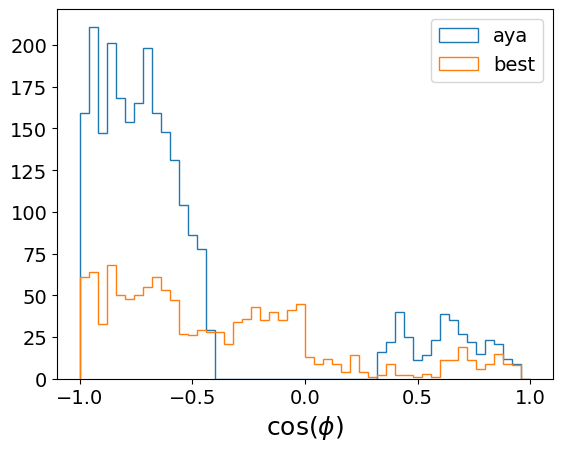

In [ ]:
state_best = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/063026/02/best_state.npy')

info_best = bank_1_info[state_best == 1]
info_aya = bank_1_info[~bank_1_info['phi'].between(70, 115)]
bins = np.linspace(-1, 1, 50+1)
plt.hist(info_aya['phi'].apply(lambda phi: math.cos(math.radians(phi))), bins=bins, histtype='step', label='aya')
plt.hist(info_best['phi'].apply(lambda phi: math.cos(math.radians(phi))), bins=bins, histtype='step', label='best')
plt.xlabel(r'$\cos(\phi)$', fontsize=18)
plt.legend()

## Time heatmaps

In [ ]:
# Aya
pdf = PdfPages(f'/home/bhanselman/bhanselman/heatmaps/063026_02_decay_bank_1_time_aya.pdf')

info_aya['time_mjd'] = info_aya['time'].apply(lambda mjd: int(mjd.split('_')[0]))
time_bins = np.linspace(min(info_aya['time_mjd']), max(info_aya['time_mjd']), 50+1)
info_aya['time_mjd_bin'] = pd.cut(info_aya['time_mjd'], time_bins, labels=False)

xs = np.load(os.path.join(bank_dir, os.listdir(bank_dir)[0]))[0]    
start_freqs = np.arange(round_up_to_nearest_10(xs[0]), xs[-1], 100)

for start_freq in tqdm(start_freqs):
    fig = plot_heatmap(
        'decay',
        1,
        bank_dir,
        xs,
        info_aya,
        start_freq=start_freq,
        width=100,
        n_bins=50,
        time=True
    )
    pdf.savefig(fig, bbox_inches='tight', dpi=500)
    plt.close(fig)

pdf.close()

  0%|          | 0/15 [00:00<?, ?it/s]

In [ ]:
# Best
pdf = PdfPages(f'/home/bhanselman/bhanselman/heatmaps/063026_02_decay_bank_1_time_best.pdf')

info_best['time_mjd'] = info_best['time'].apply(lambda mjd: int(mjd.split('_')[0]))
time_bins = np.linspace(min(info_best['time_mjd']), max(info_best['time_mjd']), 50+1)
info_best['time_mjd_bin'] = pd.cut(info_best['time_mjd'], time_bins, labels=False)

xs = np.load(os.path.join(bank_dir, os.listdir(bank_dir)[0]))[0]    
start_freqs = np.arange(round_up_to_nearest_10(xs[0]), xs[-1], 100)

for start_freq in tqdm(start_freqs):
    fig = plot_heatmap(
        'decay',
        1,
        bank_dir,
        xs,
        info_best,
        start_freq=start_freq,
        width=100,
        n_bins=50,
        time=True
    )
    pdf.savefig(fig, bbox_inches='tight', dpi=500)
    plt.close(fig)

pdf.close()

  0%|          | 0/15 [00:00<?, ?it/s]

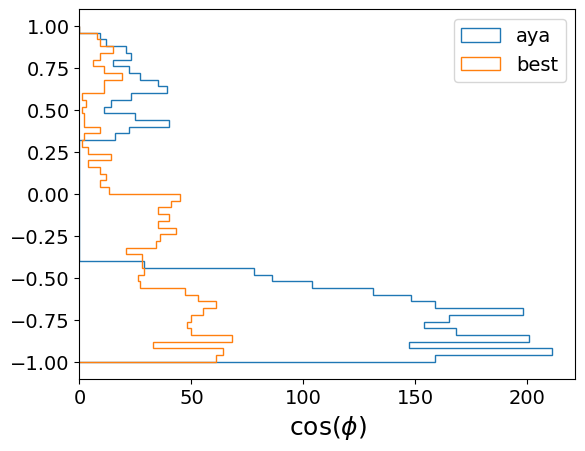

In [ ]:
state_best = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/063026/02/best_state.npy')

info_best = bank_1_info[state_best == 1]
info_aya = bank_1_info[~bank_1_info['phi'].between(70, 115)]
bins = np.linspace(-1, 1, 50+1)
plt.hist(info_aya['phi'].apply(lambda phi: math.cos(math.radians(phi))), bins=bins, histtype='step', orientation='horizontal', label='aya')
plt.hist(info_best['phi'].apply(lambda phi: math.cos(math.radians(phi))), bins=bins, histtype='step', orientation='horizontal', label='best')
plt.xlabel(r'$\cos(\phi)$', fontsize=18)
plt.legend()

# Moving MAD - test

(-1e-06, 1e-06)

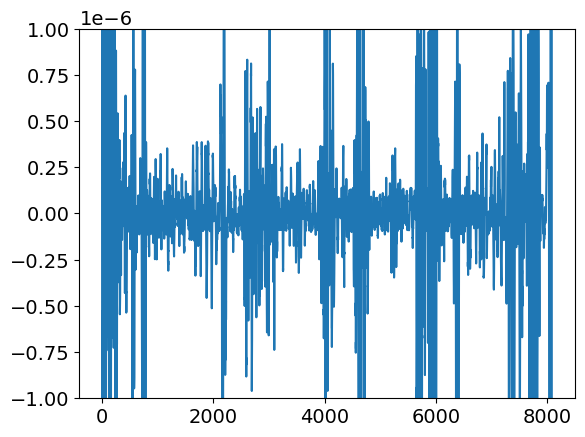

In [ ]:
asymmetry = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/063026/02/best_asymmetry.npy')
plt.plot(asymmetry)
plt.ylim(-1e-6, 1e-6)

In [32]:
def moving_mad_average(asymmetry, width=500):
    def mad(i):
        window = asymmetry[i-width:i+width]
        return scipy.stats.median_abs_deviation(window)
    mads = list(map(mad, range(500, len(asymmetry)-500)))
    return mads, np.mean(mads)

In [33]:
mads, mean = moving_mad_average(asymmetry)

In [43]:
mean

1.0351702576006969e-07

In [40]:
mad = scipy.stats.median_abs_deviation(asymmetry)
mad

9.807101949481908e-08

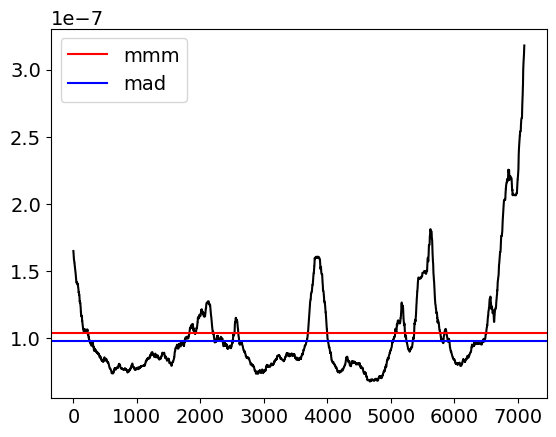

In [41]:
plt.plot(mads, c='k')
plt.axhline(mean, c='r', label='mmm')
plt.axhline(mad, c='b', label='mad')
plt.legend()

In [ ]:
state_best = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070126/04/best_state.npy')
info = pd.read_csv(info_dir)
bank_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01/decay/1'
bank_1_info = info[info['source'].apply(lambda l: l+'.npy').isin(os.listdir(bank_dir))]
inner_all_mask = bank_1_info['phi'] < 90
sum((state_best == 1) & inner_all_mask), sum((state_best == 1) & ~inner_all_mask)

(178, 1030)

## Weighted average moving median squared deviation (WAMMSD)

In [14]:
plt.rcParams.update({'font.size': 14, 'axes.labelsize': 14})

In [10]:
def median_sq_deviations(asymmetry, width=500):
    def msd(i):
        window = asymmetry[i-width:i+width]
        devs = np.abs(window) ** 2
        return np.median(devs)
    msds = list(map(msd, range(500, len(asymmetry)-500)))
    return msds

In [ ]:
asymmetry = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/063026/02/best_asymmetry.npy')
msds = median_sq_deviations(asymmetry)

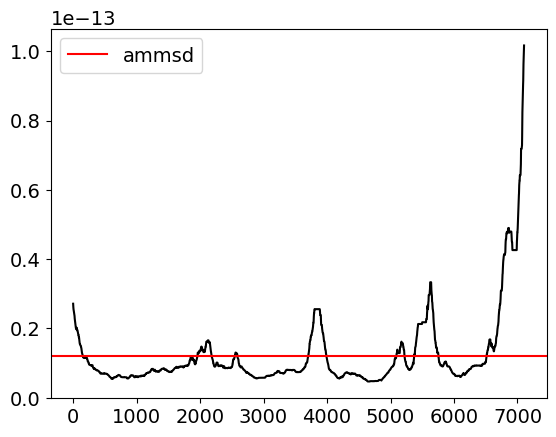

In [18]:
plt.plot(msds, c='k')
plt.axhline(np.mean(msds), c='r', label='ammsd')
plt.legend()

In [20]:
np.sqrt(np.mean(msds))

1.0988874820536554e-07

In [47]:
# Basic filter
def filter(xs):
    length = len(xs)
    for x in xs:
        if x < (length / 8):
            yield 8 * x / length
        elif x > (7 * length / 8):
            yield 8 * (1 - x / length)
        else:
            yield 1

In [48]:
filt = list(filter(range(len(msds))))

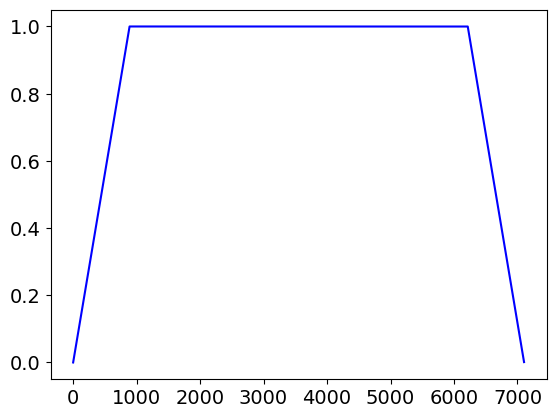

In [49]:
plt.plot(filt, c='b', label='filter')

In [52]:
wammsd = np.average(msds, weights=filt)

In [53]:
np.sqrt(wammsd)

1.0059400627991707e-07

In [55]:
# Comparison
def moving_mad_average_weighted(asymmetry, width=500):
    def mad(i):
        window = asymmetry[i-width:i+width]
        return scipy.stats.median_abs_deviation(window)
    mads = list(map(mad, range(500, len(asymmetry)-500)))
    return np.average(mads, weights=filt)

moving_mad_average_weighted(asymmetry)

9.717820554716825e-08

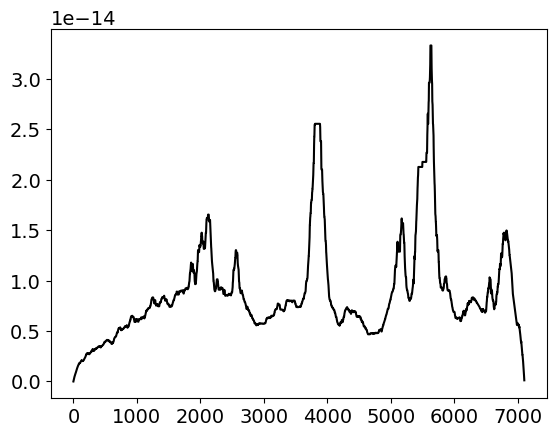

In [57]:
#Weighted msds
plt.plot(np.multiply(msds, filt), c='k')

## Three asymmetries comparison

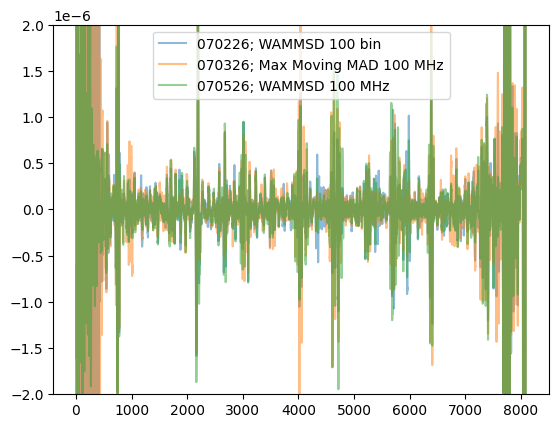

In [ ]:
asym_1 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070226/01/best_asymmetry.npy')
asym_2 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070326/01/best_asymmetry.npy')
asym_3 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070526/01/best_asymmetry.npy')
plt.plot(asym_1, label='070226; WAMMSD 100 bin', alpha=0.5)
plt.plot(asym_2, label='070326; Max Moving MAD 100 MHz', alpha=0.5)
plt.plot(asym_3, label='070526; WAMMSD 100 MHz', alpha=0.5)
plt.ylim(-2e-6, 2e-6)
plt.legend()

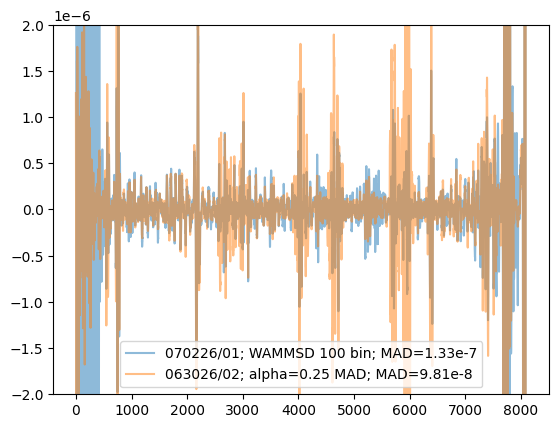

In [ ]:
asym_1 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070226/01/best_asymmetry.npy')
asym_2 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/063026/02/best_asymmetry.npy')
plt.plot(asym_1, label='070226/01; WAMMSD 100 bin; MAD=1.33e-7', alpha=0.5)
plt.plot(asym_2, label='063026/02; alpha=0.25 MAD; MAD=9.81e-8', alpha=0.5)
plt.ylim(-2e-6, 2e-6)
plt.legend()

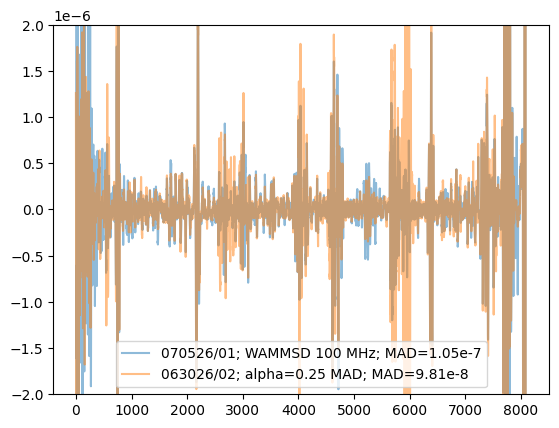

In [ ]:
asym_1 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070526/01/best_asymmetry.npy')
asym_2 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/063026/02/best_asymmetry.npy')
plt.plot(asym_1, label='070526/01; WAMMSD 100 MHz; MAD=1.05e-7', alpha=0.5)
plt.plot(asym_2, label='063026/02; alpha=0.25 MAD; MAD=9.81e-8', alpha=0.5)
plt.ylim(-2e-6, 2e-6)
plt.legend()

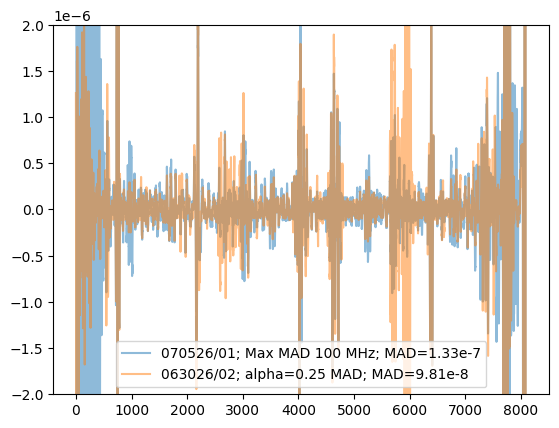

In [ ]:
asym_1 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070326/01/best_asymmetry.npy')
asym_2 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/063026/02/best_asymmetry.npy')
plt.plot(asym_1, label='070526/01; Max MAD 100 MHz; MAD=1.33e-7', alpha=0.5)
plt.plot(asym_2, label='063026/02; alpha=0.25 MAD; MAD=9.81e-8', alpha=0.5)
plt.ylim(-2e-6, 2e-6)
plt.legend()

## One semester

In [ ]:
cband_info = pd.read_csv('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/all_cband_info.csv')
cband_info = cband_info[cband_info['epoch'].str.contains('25A')]
len(cband_info)

375

Text(0.5, 1.0, '25A')

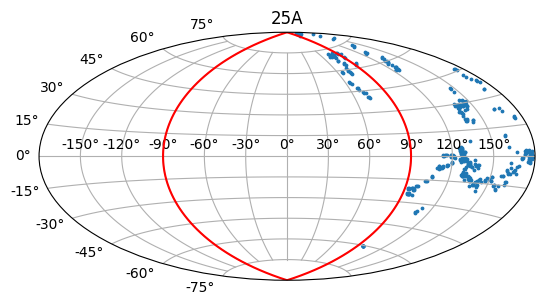

In [ ]:
gal = SkyCoord(cband_info['l'], cband_info['b'], unit='deg', frame='galactic')
fig = plt.figure()
ax = fig.add_subplot(111, projection='aitoff')
ax.grid(zorder=0)
scatter = plt.scatter(gal.l.wrap_at('180d').radian, gal.b.radian, s=3, zorder=1)
ax.plot([-np.pi/2, -np.pi/2], [-np.pi/2, np.pi/2], c='r')
ax.plot([np.pi/2, np.pi/2], [np.pi/2, -np.pi/2], c='r')
ax.set_title('25A')

In [ ]:
cband_info = pd.read_csv('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/all_cband_info.csv')
cband_info = cband_info[cband_info['epoch'].str.contains('20B')]
len(cband_info)

566

Text(0.5, 1.0, '20B')

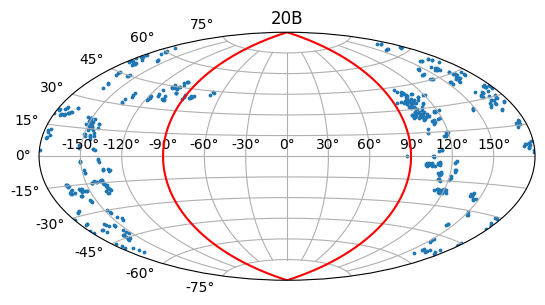

In [16]:
gal = SkyCoord(cband_info['l'], cband_info['b'], unit='deg', frame='galactic')
fig = plt.figure()
ax = fig.add_subplot(111, projection='aitoff')
ax.grid(zorder=0)
scatter = plt.scatter(gal.l.wrap_at('180d').radian, gal.b.radian, s=3, zorder=1)
ax.plot([-np.pi/2, -np.pi/2], [-np.pi/2, np.pi/2], c='r')
ax.plot([np.pi/2, np.pi/2], [np.pi/2, -np.pi/2], c='r')
ax.set_title('20B')

### Random 1000 targets

In [ ]:
info = pd.read_csv('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/all_cband_info.csv')
bank_1_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01/decay/1'
bank_1_info = info[info['source'].apply(lambda l: l+'.npy').isin(os.listdir(bank_1_dir))]
sample = random.sample(list(bank_1_info['source']), 1000)
state = np.where(bank_1_info['source'].isin(sample), 1, 0)
state


array([0, 0, 0, ..., 1, 0, 0])

In [19]:
len(state), sum(state)

(3682, 1000)

In [ ]:
np.save('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/1000_random_targets_070626.npy', state)

In [25]:
sample_info = bank_1_info.loc[state == 1, :]
sample_info

,source,epoch,time,ra,dec,l,b,theta,phi,nfw,nfw_sq,iso,iso_sq,burkert,burkert_sq,moore,moore_sq
3,HIP25749,AGBT18B_999_67,58447_22754,82.4714,53.4326,157.534348,10.457592,67.927336,155.334399,1.026629e+08,5.211065e+14,2.559132e+08,1.175083e+15,8.799945e+07,4.254149e+14,2.245130e+07,3.016514e+13
9,HIP26779,AGBT18B_999_67,58447_23779,85.3347,53.4785,158.386751,11.944000,68.877379,155.445146,1.026317e+08,5.208493e+14,2.558710e+08,1.174715e+15,8.797135e+07,4.252055e+14,2.244379e+07,3.014941e+13
13,HIP26408,AGBT18B_999_67,58447_28119,84.3138,64.1544,148.491923,16.676581,59.957825,144.756541,1.063646e+08,5.521683e+14,2.608509e+08,1.218654e+15,9.133765e+07,4.506754e+14,2.334606e+07,3.207020e+13
20,HIP115613,AGBT20B_999_25,59132_23050,351.2706,56.8438,111.292937,-4.063767,21.659543,111.236805,1.299411e+08,7.742599e+14,2.891322e+08,1.486884e+15,1.125151e+08,6.290587e+14,2.914633e+07,4.597685e+13
26,HIP51066,AGBT18B_999_67,58447_32554,156.5126,62.1053,147.209386,47.592964,68.578177,124.536570,1.180418e+08,6.568175e+14,2.755084e+08,1.353648e+15,1.018516e+08,5.352570e+14,2.619746e+07,3.856267e+13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3894,HIP112531,AGBT25A_999_05,60728_77795,341.8524,31.9020,94.331834,-23.992616,24.357754,93.956930,1.525368e+08,1.029162e+15,3.118464e+08,1.726223e+15,1.325197e+08,8.278495e+14,3.485938e+07,6.248870e+13
3903,HIP112775,AGBT25A_999_05,60728_85126,342.5901,35.0886,96.612870,-21.520936,22.467817,96.149998,1.491118e+08,9.877319e+14,3.086451e+08,1.691162e+15,1.295135e+08,7.960179e+14,3.398420e+07,5.976833e+13
3914,HIP112402,AGBT25A_999_05,60728_84459,341.4968,35.6753,96.086577,-20.573573,21.417541,95.697057,1.498041e+08,9.960234e+14,3.092988e+08,1.698284e+15,1.301219e+08,8.024038e+14,3.416083e+07,6.031167e+13
3918,HIP116113,AGBT25A_999_05,60729_09060,352.9284,54.1527,111.330850,-6.913528,22.373444,111.168256,1.300132e+08,7.750056e+14,2.892110e+08,1.487677e+15,1.125795e+08,6.296502e+14,2.916433e+07,4.602433e+13


Text(0.5, 1.0, '1000 target sample')

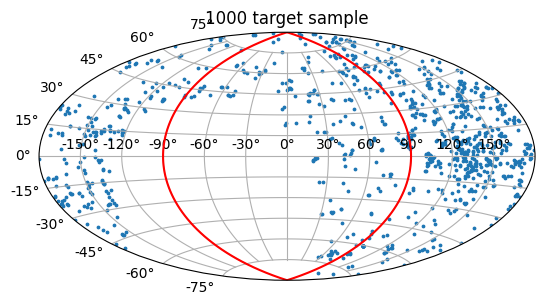

In [26]:
gal = SkyCoord(sample_info['l'], sample_info['b'], unit='deg', frame='galactic')
fig = plt.figure()
ax = fig.add_subplot(111, projection='aitoff')
ax.grid(zorder=0)
scatter = plt.scatter(gal.l.wrap_at('180d').radian, gal.b.radian, s=3, zorder=1)
ax.plot([-np.pi/2, -np.pi/2], [-np.pi/2, np.pi/2], c='r')
ax.plot([np.pi/2, np.pi/2], [np.pi/2, -np.pi/2], c='r')
ax.set_title('1000 target sample')

In [29]:
inner_all_mask = bank_1_info['phi'] < 90
sum((state == 1) & inner_all_mask), sum((state == 1) & ~inner_all_mask)

(205, 795)

# Heatmap with horizontal histogram

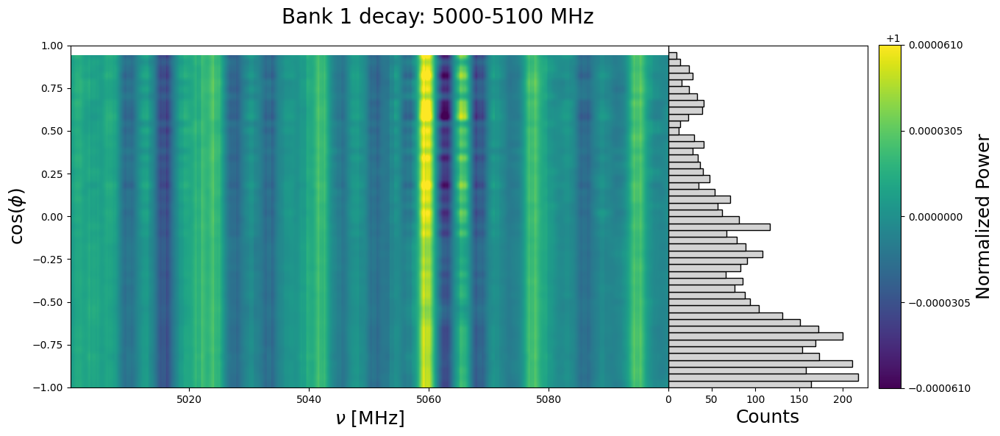

In [ ]:
def plot_heatmap(case, bank, data_dir, xs, info, start_freq=8000, width=100, n_bins=50, time=False):
    mask = (xs >= start_freq) & (xs < start_freq + width)
    nans = np.full(xs.shape, np.nan)[mask]
    end_freq = xs[mask][-1]

    info['time_mjd'] = info['time'].apply(lambda mjd: int(mjd.split('_')[0])) #[int(mjd.split('_')[0]) for mjd in info['time']]
    info['cos_theta'] = info['theta'].apply(lambda theta: math.cos(math.radians(theta))) #[math.cos(math.radians(theta)) for theta in info['theta']]
    info['cos_phi'] = info['phi'].apply(lambda phi: math.cos(math.radians(phi))) #[math.cos(math.radians(phi)) for phi in info['phi']]

    bins = np.linspace(-1, 1, n_bins+1)
    time_bins = np.linspace(min(info['time_mjd']), max(info['time_mjd']), n_bins+1)
    info['time_mjd_bin'] = pd.cut(info['time_mjd'], time_bins, labels=False)
    info['cos_theta_bin'] = pd.cut(info['cos_theta'], bins, labels=False)
    info['cos_phi_bin'] = pd.cut(info['cos_phi'], bins, labels=False)

    def create_map(bin_column):
        for i in range(n_bins):
            sources = info[info[bin_column] == i]['source'].tolist()
            spectra = np.array([np.load(os.path.join(data_dir, file))[1][mask] for file in os.listdir(data_dir) if file[:-4] in sources])
            if spectra.size:
                avg = np.mean(spectra, axis=0)
                yield avg
            else:
                yield nans
    
    if time:
        time_map = list(create_map('time_mjd_bin'))

        fig = plt.figure(figsize=(12, 6), layout="tight")
        gs = fig.add_gridspec(1, 2, wspace=0, width_ratios=[3, 1])

        ax = fig.add_subplot(gs[0])
        interval = ZScaleInterval()
        vmin, vmax = interval.get_limits(np.array(time_map))
        vmax = max(vmax, 2 - vmin)
        ndigits = -int(math.floor(math.log10(vmax - 1))) + 1
        vmax = round(vmax, ndigits)
        vmin = 2 - vmax
        norm = Normalize(vmin=vmin, vmax=vmax)
        extent = [np.min(xs[mask]), np.max(xs[mask]), min(info['time_mjd']), max(info['time_mjd'])]

        im = ax.imshow(time_map, extent=extent, origin='lower', norm=norm, aspect='auto')
        
        ax.set_ylabel('Modified JD', fontsize=18)
        ax.set_xlabel(r'$\nu$ [MHz]', fontsize=18)

        hist_ax = fig.add_subplot(gs[1])
        hist_ax.hist(info['time_mjd'], bins=time_bins, facecolor='lightgray', edgecolor='k', orientation='horizontal')
        hist_ax.set_xlabel('Counts', fontsize=18)
        hist_ax.set_yticks([])
        hist_ax.set_ylim(-1, 1)

        fig.suptitle(f'Bank {bank} {case}: {start_freq:.0f}-{end_freq:.0f} MHz', fontsize=20)
        ax.set_aspect('auto')

        cbar = fig.colorbar(im, ax=ax, orientation='vertical', fraction=0.0335, pad=0.04, ticks=np.linspace(vmin, vmax, 5))
        cbar.set_label('Normalized Power', fontsize=18)
        
    else:
        #theta_map = list(create_map('cos_theta_bin'))
        phi_map = list(create_map('cos_phi_bin'))
    
        fig = plt.figure(figsize=(12, 6), layout="tight")
        gs = fig.add_gridspec(1, 2, wspace=0, width_ratios=[3, 1])
        #plt.subplots_adjust(hspace=0.15)

        ax = fig.add_subplot(gs[0])
        interval = ZScaleInterval()
        vmin, vmax = interval.get_limits(np.array(phi_map))
        vmax = max(vmax, 2 - vmin)
        ndigits = -int(math.floor(math.log10(vmax - 1))) + 1
        vmax = round(vmax, ndigits)
        vmin = 2 - vmax
        norm = Normalize(vmin=vmin, vmax=vmax)
        extent = [np.min(xs[mask]), np.max(xs[mask]), -1, 1]

        #im0 = axs[0].imshow(theta_map, extent=extent, origin='lower', norm=norm, aspect='auto')
        im1 = ax.imshow(phi_map, extent=extent, origin='lower', norm=norm, aspect='auto')
        
        #axs[0].set_ylabel(r'$\mathrm{cos}({\theta})$', fontsize=18)
        ax.set_ylabel(r'$\mathrm{cos}({\phi})$', fontsize=18)
        ax.set_xlabel(r'$\nu$ [MHz]', fontsize=18)
        # for i in bins:
        #     ax.axhline(i, c='r')

        hist_ax = fig.add_subplot(gs[1])
        hist_ax.hist(info['cos_phi'], bins=bins, facecolor='lightgray', edgecolor='k', orientation='horizontal')
        hist_ax.set_xlabel('Counts', fontsize=18)
        hist_ax.set_yticks([])
        hist_ax.set_ylim(-1, 1)

        fig.suptitle(f'Bank {bank} {case}: {start_freq:.0f}-{end_freq:.0f} MHz', fontsize=20)
        ax.set_yticks(np.linspace(-1, 1, 9))
        ax.set_aspect('auto')

        #tick_locs = ax[0].get_xticks
        #axs[0].set_xticklabels([])
        #axs[1].set_xticklabels([round(loc * freqs + min(xs)) for loc in tick_locs])
        cax = fig.add_axes([1, 0.117, 0.025, 0.778])
        cbar = fig.colorbar(im1, cax=cax, ax=ax, orientation='vertical', ticks=np.linspace(vmin, vmax, 5))
        cbar.set_label('Normalized Power', fontsize=18)
    
    return fig

info_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/all_cband_info.csv'
info = pd.read_csv(info_dir)
bank_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01/decay/1'
bank_1_info = info[info['source'].apply(lambda l: l+'.npy').isin(os.listdir(bank_dir))]
xs = np.load(os.path.join(bank_dir, os.listdir(bank_dir)[0]))[0]    

fig = plot_heatmap(
    'decay',
    1,
    bank_dir,
    xs,
    info,
    start_freq=5000,
    width=100,
    n_bins=50,
)

# Weighted probability vector

In [ ]:
info_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/all_cband_info.csv'
info = pd.read_csv(info_dir)
bank_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01/decay/1'
bank_1_info = info[info['source'].apply(lambda l: l+'.npy').isin(os.listdir(bank_dir))]

(array([509., 453., 361., 382., 592., 464., 426., 301., 123.,  71.]),
 array([1.42772504e-02, 8.99123930e+00, 1.79682014e+01, 2.69451634e+01,
        3.59221255e+01, 4.48990875e+01, 5.38760496e+01, 6.28530116e+01,
        7.18299737e+01, 8.08069357e+01, 8.97838978e+01]),
 <BarContainer object of 10 artists>)

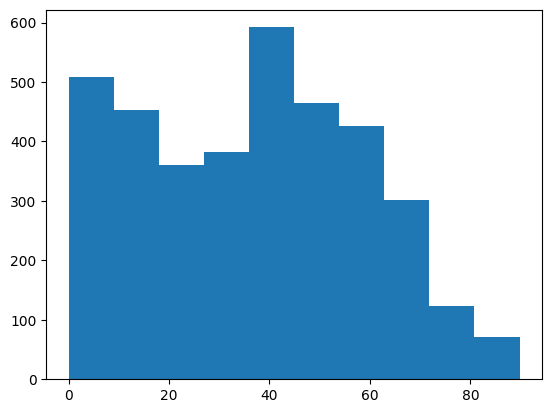

In [4]:
phis = bank_1_info['phi'].to_numpy()
dist = np.abs(90 - phis)
plt.hist(dist)

(array([509., 453., 361., 382., 592., 464., 426., 301., 123.,  71.]),
 array([-1.66607608, -1.25954502, -0.85301396, -0.4464829 , -0.03995184,
         0.36657922,  0.77311029,  1.17964135,  1.58617241,  1.99270347,
         2.39923453]),
 <BarContainer object of 10 artists>)

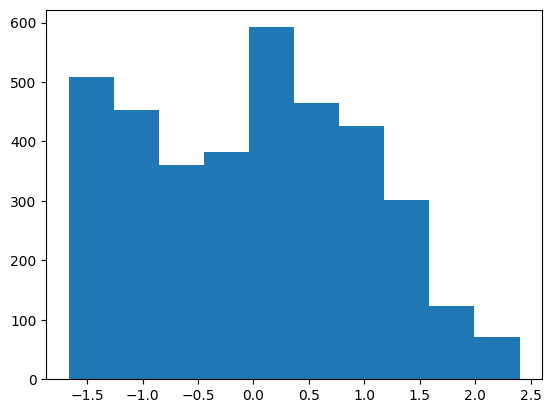

In [9]:
dist_standard = (dist - np.mean(dist)) / np.std(dist)
plt.hist(dist_standard)

(array([527., 446., 340., 345., 518., 493., 387., 340., 206.,  80.]),
 array([0.30300308, 0.34954844, 0.3960938 , 0.44263916, 0.48918452,
        0.53572988, 0.58227524, 0.62882061, 0.67536597, 0.72191133,
        0.76845669]),
 <BarContainer object of 10 artists>)

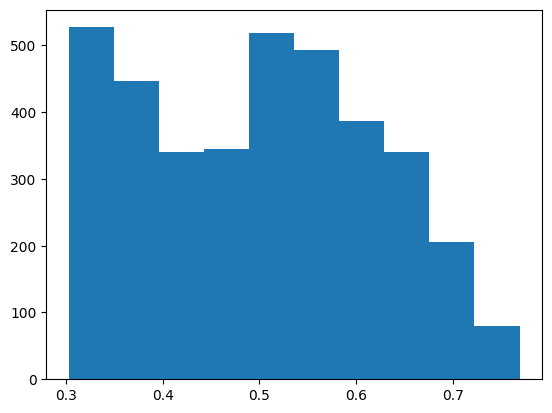

In [14]:
def logistic(x, k):
    return 1 / (1 + np.exp(-k * x))

dist_log = logistic(dist_standard, 0.5)
plt.hist(dist_log)

(array([588., 422., 303., 268., 393., 469., 339., 406., 334., 160.]),
 array([0.15894804, 0.23473013, 0.31051222, 0.3862943 , 0.46207639,
        0.53785848, 0.61364056, 0.68942265, 0.76520474, 0.84098683,
        0.91676891]),
 <BarContainer object of 10 artists>)

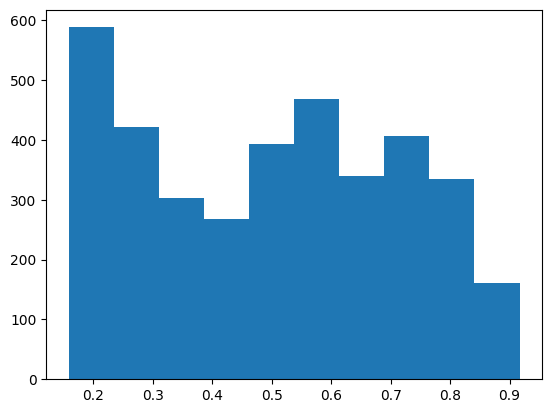

In [16]:
plt.hist(1 / (1 + np.exp(-dist_standard)))

# 1e-30 signal recovery...

## Numba normalize

In [3]:
import numpy as np
from numpy.polynomial import Polynomial
import os
from functools import partial
from scipy.optimize import curve_fit
import math
from copy import deepcopy
from numba import jit, njit, prange, set_num_threads

c = 299792
v_virial = 250 # km/s

set_num_threads(10)

@njit
def _coeff_mat(x, deg):
    mat_ = np.zeros(shape=(x.shape[0],deg + 1))
    const = np.ones_like(x)
    mat_[:,0] = const
    mat_[:, 1] = x
    if deg > 1:
        for n in range(2, deg + 1):
            mat_[:, n] = x**n
    return mat_
    
@jit
def _fit_x(a, b):
    # linalg solves ax = b
    det_ = np.linalg.lstsq(a, b)[0]
    return det_
 
@jit
def fit_poly(x, y, deg, w=None):
    a = _coeff_mat(x, deg)
    if w is not None:
        a *= w[:, np.newaxis]
        y *= w
    p = _fit_x(a, y)
    return p

@jit
def eval_polynomial(p, x):
    '''
    Compute polynomial P(x) where P is a vector of coefficients, highest
    order coefficient at P[0].  Uses Horner's Method.
    '''
    result = 0
    for coeff in p[::-1]:
        result = x * result + coeff
    return result

@njit(parallel=True)
def normalize_weighted(data, a=0.1, b=1, exterior=3, order=5, is_decay=True, freq=None, width=200, start=None, stop=None):
    """
    Standard rolling polynomial normalize procedure. Updated.
    """
    xs, ys = data
    
    freq_diff = xs[1] - xs[0]
    ys_mean = ys / ys.mean()
    for i in range(16, len(ys)-16, 16):  # Excise the 4 unstable valley points in each coarse channel 
        ys_mean[i] = np.nan
        ys_mean[i+15] = np.nan
        ys_mean[i+1] = np.nan
        ys_mean[i+14] = np.nan
    
    xs_trimmed = xs
    if freq is not None:
        index = np.argmin(np.abs(xs - freq))
        width = int(width / freq_diff)
        xs_trimmed = xs[index-width:index+width+1]
    else:
        if start is not None or stop is not None:
            start_index = 0 if start is None else np.argmin(np.abs(xs - start))
            stop_index = len(xs) - 1 if stop is None else np.argmin(np.abs(xs - stop))
            xs_trimmed = xs[start_index:stop_index+1]
    
    new_xs = []
    normalized_spectrum = []
    
    def get_sigma(center):
        if is_decay:
            sigma = v_virial*center/(c*np.sqrt(3))
        else:
            sigma = v_virial*center/(c*np.sqrt(6))
        return sigma

    def round_up_to_nearest_odd(number):
        ceiled_number = math.ceil(number)
        return int(ceiled_number + 1) if ceiled_number % 2 == 0 else int(ceiled_number)

    # Loop through the data points and divide each point by the polynomial 
    #for x in xs_trimmed:
    for index in prange(len(xs_trimmed)):
        x = xs_trimmed[index]
        #i = xs.tolist().index(x)
        i = np.where(xs == x)[0][0]
        window = round_up_to_nearest_odd(2 * exterior * get_sigma(x) / freq_diff)
        
        if i < (window//2): 
            continue
        elif i >= len(xs) - (window//2 + 1):
            break

        ind_xs = np.arange(-(window//2), window//2+1).astype(np.float64)

        current_ys = ys_mean[i-window//2:i+window//2+1]
        idx = np.isfinite(current_ys)
        
        # Unweighted fit
        #unweighted_params = np.polyfit(ind_xs[idx], current_ys[idx], order)
        unweighted_p = fit_poly(ind_xs[idx], current_ys[idx], order)
        
        # Weighted fit
        sigma = get_sigma(x)
        weights = 1 - a*np.exp(-(freq_diff*ind_xs[idx])**2 / (2*b*sigma**2))
        #weighted_params = np.polyfit(ind_xs[idx], current_ys[idx], order, w=weights)
        weighted_p = fit_poly(ind_xs[idx], current_ys[idx], order, w=weights)

        unweighted = eval_polynomial(unweighted_p, 0) #np.poly1d(unweighted_params)
        weighted = eval_polynomial(weighted_p, 0) #np.poly1d(weighted_params)
        
        new_xs.append(x)
        normalized_spectrum.append(unweighted/weighted)
    
    #new_ys = ys_mean[lower: len(xs)-upper]
    normalized = np.array([new_xs, normalized_spectrum])
    #old = np.array([new_xs, new_ys])

    return normalized

## Normalizing and saving in norm_1e30_5650_tests

In [ ]:
info = pd.read_csv('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/all_cband_info.csv')
bank_1_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1'
bank_1_info = info[info['source'].apply(lambda l: l + '.npy').isin(os.listdir(bank_1_dir))]
files = bank_1_info['source'].apply(lambda l: l + '.npy')

In [ ]:
def normalize_wrapper(file, info, save_dir=None, freq=None, b=1, exterior=3, inject=False):
    if inject:
        data = inject_calibrated_cband(
            file,
            freq,
            info,
            data_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1',
            calibration_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/median_sefds/1',
            signal_sizes=1e-30,
        )
    else:
        data = np.load(os.path.join('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1', file))
    norm = normalize_weighted(
        data,
        freq=freq,
        width=100,
        b=b,
        exterior=exterior
    )
    np.save(os.path.join(save_dir, file), norm)

inj_save_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/norm_1e30_5650_tests/injected'
uninj_save_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/norm_1e30_5650_tests/uninjected'
os.makedirs(inj_save_dir, exist_ok=True)
os.makedirs(uninj_save_dir, exist_ok=True)

norm_inj_partial = partial(normalize_wrapper, info=info, freq=5650, save_dir=inj_save_dir, inject=True)
norm_uninj_partial = partial(normalize_wrapper, info=info, freq=5650, save_dir=uninj_save_dir, inject=False)
_ = list(tqdm(map(norm_inj_partial, files), total=len(files), desc='injected'))
_ = list(tqdm(map(norm_uninj_partial, files), total=len(files), desc='uninjected'))

injected:   0%|          | 0/3682 [00:00<?, ?it/s]

uninjected:   0%|          | 0/3682 [00:00<?, ?it/s]

## One normalized spectrum

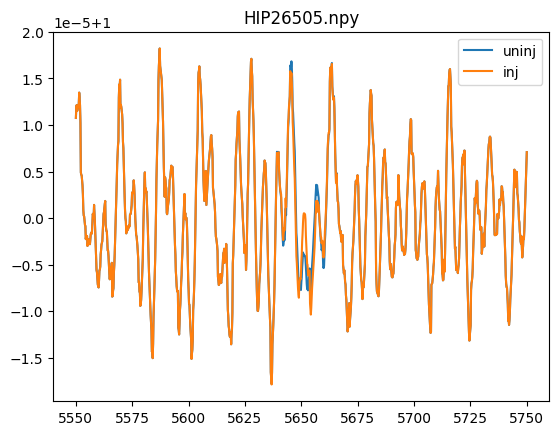

In [16]:
file = os.listdir(inj_save_dir)[0]
inj = np.load(os.path.join(inj_save_dir, file))
uninj = np.load(os.path.join(uninj_save_dir, file))
plt.plot(*uninj, label='uninj')
plt.plot(*inj, label='inj')
plt.title(file)
plt.legend()

## Asymmetry (pwease)

78.38451979704897


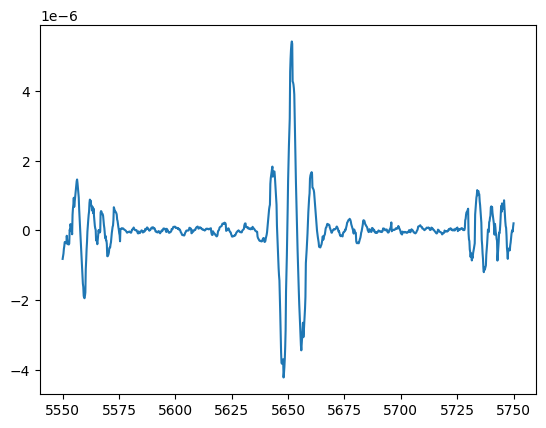

In [ ]:
def build_asymmetry(data_dir, files, state):
    specs = np.array([np.load(os.path.join(data_dir, file))[1] for file in files])

    inner = (state == 1) & inner_all_mask
    outer = (state == 1) & ~inner_all_mask

    inner_slice = specs[inner, :]
    outer_slice = specs[outer, :]
    inner_mean = np.mean(inner_slice, axis=0)
    outer_mean = np.mean(outer_slice, axis=0)
    
    asymmetry = (inner_mean - outer_mean) / (inner_mean + outer_mean)

    return asymmetry

def calculate_asymmetry_snr(xs, inj, freq, window=10):
    mask = abs(xs - freq) < window
    window_ys = inj[mask]
    signal = np.max(window_ys)
    noise = scipy.stats.median_abs_deviation(inj[~mask]) #np.std(uninj)
    return signal / noise

files = bank_1_info['source'].apply(lambda l: l + '.npy')
xs = inj[0]

inner_all_mask = bank_1_info['phi'] < 90
inner_all_mask = inner_all_mask.to_numpy()

# 070526/01 best state
state_best = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070526/01/best_state.npy')

asymmetry_inj = build_asymmetry(inj_save_dir, files, state_best)

plt.plot(xs, asymmetry_inj)
snr = calculate_asymmetry_snr(xs, asymmetry_inj, 5650)
print(snr)

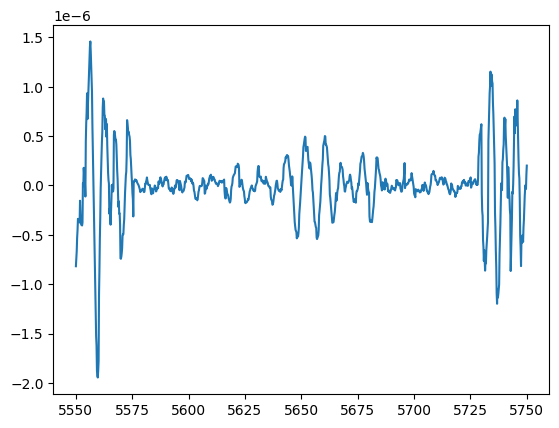

In [18]:
asymmetry_uninj = build_asymmetry(uninj_save_dir, files, state_best)
plt.plot(xs, asymmetry_uninj)

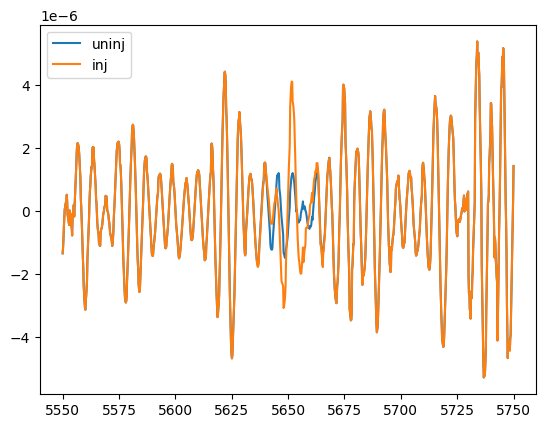

In [26]:
# Aya's cones
state_aya = np.where(bank_1_info['phi'].between(70, 115), 0, 1)
asymmetry_inj = build_asymmetry(inj_save_dir, files, state_aya)
asymmetry_uninj = build_asymmetry(uninj_save_dir, files, state_aya)
plt.plot(xs, asymmetry_uninj, label='uninj')
plt.plot(xs, asymmetry_inj, label='inj')
plt.legend()

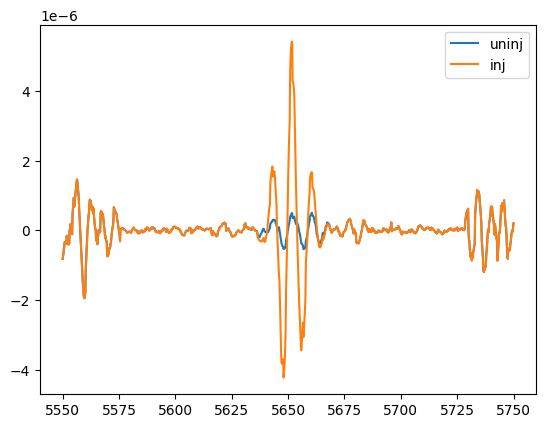

In [27]:
asymmetry_inj = build_asymmetry(inj_save_dir, files, state_best)
asymmetry_uninj = build_asymmetry(uninj_save_dir, files, state_best)
plt.plot(xs, asymmetry_uninj, label='uninj')
plt.plot(xs, asymmetry_inj, label='inj')
plt.legend()

# Aitoff projection - line-integrated densities

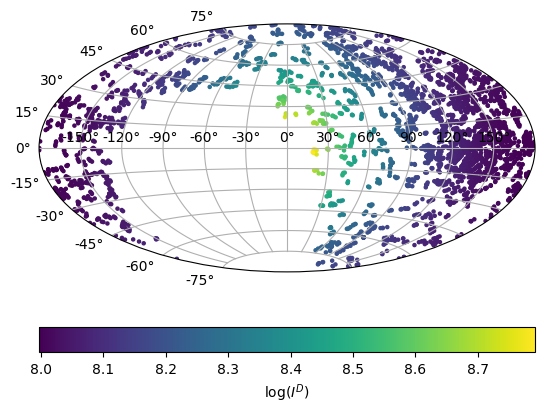

In [32]:
gal = SkyCoord(bank_1_info['l'], bank_1_info['b'], unit='deg', frame='galactic')
fig = plt.figure()
ax = fig.add_subplot(111, projection='aitoff')
ax.grid(zorder=0)
colors = np.log10(bank_1_info['nfw'].to_numpy())
scatter = plt.scatter(gal.l.wrap_at('180d').radian, gal.b.radian,
                      c=colors, s=5, vmin=min(colors), vmax=max(colors), zorder=1)
#cax = fig.add_axes([0.1, 0.1, 0.8, 0.03])
cbar = plt.colorbar(scatter, ax=ax, orientation='horizontal')
cbar.set_label(r'$\log(I^D$)')

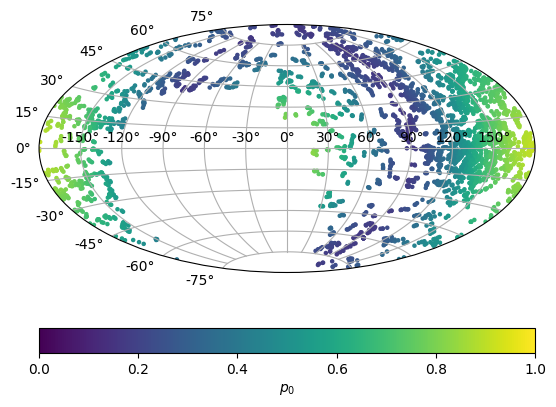

In [7]:
gal = SkyCoord(bank_1_info['l'], bank_1_info['b'], unit='deg', frame='galactic')
fig = plt.figure()
ax = fig.add_subplot(111, projection='aitoff')
ax.grid(zorder=0)
phis = bank_1_info['phi'].to_numpy()
dist = np.abs(90 - phis)
dist_standard = (dist - np.mean(dist)) / np.std(dist)
colors = 1 / (1 + np.exp(-dist_standard)) #np.log10(bank_1_info['nfw'].to_numpy())
scatter = plt.scatter(gal.l.wrap_at('180d').radian, gal.b.radian,
                      c=colors, s=5, vmin=0, vmax=1, zorder=1)
#cax = fig.add_axes([0.1, 0.1, 0.8, 0.03])
cbar = plt.colorbar(scatter, ax=ax, orientation='horizontal')
cbar.set_label('$p_0$')

# I/O per semester

Text(0, 0.5, 'Counts')

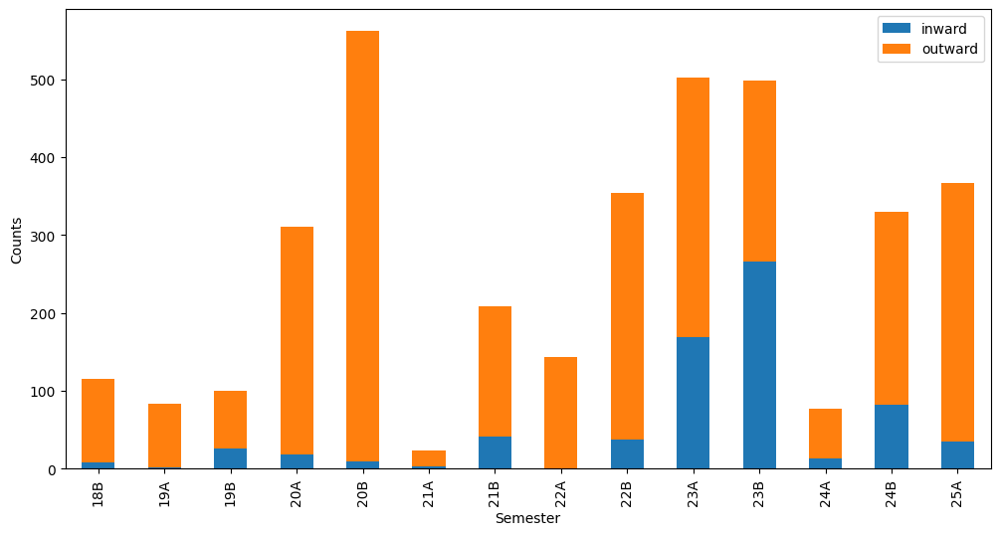

In [5]:
# Semester plot of the cadences
all_semesters = ['18B', '19A', '19B', '20A',
                 '20B', '21A', '21B', '22A',
                 '22B', '23A', '23B', '24A',
                 '24B', '25A']
# For each target, get the number of cadences in each semester
semester_counts = {
    'inward': [
        bank_1_info[bank_1_info['phi'] < 90]['epoch'].apply(lambda l: l[4:7]).tolist().count(sem)
        for sem in all_semesters
    ],
    'outward': [
        bank_1_info[bank_1_info['phi'] > 90]['epoch'].apply(lambda l: l[4:7]).tolist().count(sem)
        for sem in all_semesters
    ]
}
# Turn into a DataFrame for easier plotting
semester_df = pd.DataFrame(semester_counts, index=all_semesters)
semester_df.plot(kind='bar', stacked=True, figsize=(12, 6))
plt.xlabel('Semester')
plt.ylabel('Counts')

(-1e-06, 1e-06)

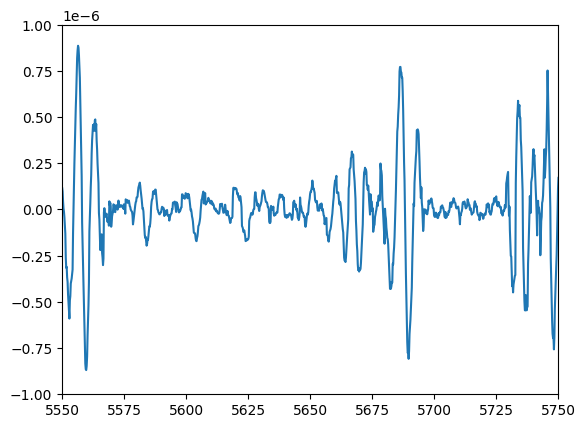

In [ ]:
xs = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01/decay/1/HIP26505.npy')[0]
asym = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070826/02/best_asymmetry.npy')
plt.plot(xs, asym)
plt.xlim(5550, 5750)
plt.ylim(-1e-6, 1e-6)

In [11]:
xs[1] - xs[0]

0.18310546875

# FOM spectra for optimized populations

In [4]:
info = pd.read_csv('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/all_cband_info.csv')
bank_1_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1'
bank_1_info = info[info['source'].apply(lambda l: l + '.npy').isin(os.listdir(bank_1_dir))]
files = bank_1_info['source'].apply(lambda l: l + '.npy')

In [5]:
from scipy.interpolate import interp1d, make_interp_spline

def correlate_asymmetry(freqs, spectrum, template):
    def stretch_template(template, stretch_factor):
        if template.shape[0] % 2 == 0:
            template = template[1:] # Make the number of points odd
        k = template.shape[0] // 2
        orig_x = np.arange(-k, k+1)
        interp_func = interp1d(orig_x, template, bounds_error=False, fill_value=0)
        new_k = ((2*k + 1)/stretch_factor - 1)/2 # 2k_1 + 1 = sf*(2k_0 + 1)
        new_x = np.linspace(-new_k, new_k, template.shape[0])

        return interp_func(new_x)

    def get_a(target, template):
        return np.dot(target, template) / (np.dot(template, template) + 1e-12)
    
    a_vals = np.zeros_like(spectrum)
    residuals = np.zeros_like(spectrum)
    lower = (len(template) - 1) // 2
    upper = (len(template) + 1) // 2
    for i in range(len(spectrum)):
        stretched = stretch_template(template, freqs[i] / 5650)
        
        if i < lower:
            x = lower - i
            stretched = stretched[x:]
            window = spectrum[:i+upper]
        elif i > (len(spectrum) - upper):
            x = len(spectrum) - upper - i
            stretched = stretched[:x]
            window = spectrum[i-lower:]
        else:
            window = spectrum[i-lower:i+upper]
        
        a = get_a(window, stretched) 
        a_vals[i] = a 
        residuals[i] = np.sqrt(np.mean((a*stretched-window)**2)) 

    return a_vals / (residuals + 1e-12)


def get_pvals_cont(inj, uninj):
    stds = []
    for i in range(len(uninj)):
        if i < 140:
            stds.append(np.std(uninj[:i+140]))
        elif i >= len(uninj) - 140:
            stds.append(np.std(uninj[i-140:]))
        else:
            stds.append(np.std(uninj[i-140:i+140]))
    
    sigmas = inj / stds
    pvals = list(map(lambda sigma: .5*math.erfc(sigma/np.sqrt(2)), sigmas))
    return pvals

In [6]:
def build_asymmetry(specs, state):
    inner = (state == 1) & inner_all_mask
    outer = (state == 1) & ~inner_all_mask

    # inner_mean, outer_mean = get_means(specs, inner, outer)
    inner_slice = specs[inner, :]
    outer_slice = specs[outer, :]
    inner_mean = np.mean(inner_slice, axis=0)
    outer_mean = np.mean(outer_slice, axis=0)
    
    asymmetry = (inner_mean - outer_mean) / (inner_mean + outer_mean)

    return asymmetry

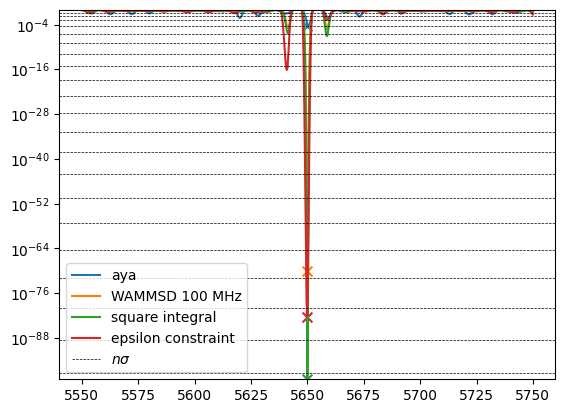

In [ ]:
template_spectra = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/071026/01/template_spectra.npy')
state_aya = np.where(bank_1_info['phi'].between(70, 115), 0, 1)
state_070526_01 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070526/01/best_state.npy') # WAMMSD 100 MHz
state_070726_01 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070726/01/best_state.npy') # Square integral
state_070826_02 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070826/02/best_state.npy') # Epsilon constraint

default_colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

inj_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/norm_1e30_5650_tests/injected'
uninj_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/norm_1e30_5650_tests/uninjected'
xs = np.load(os.path.join(inj_dir, files[0]))[0]
inj_spectra = np.array([np.load(os.path.join(inj_dir, file))[1] for file in files])
uninj_spectra = np.array([np.load(os.path.join(uninj_dir, file))[1] for file in files])

inner_all_mask = bank_1_info['phi'] < 90

fig, ax = plt.subplots()

states = [state_aya, state_070526_01, state_070726_01, state_070826_02]
labels = ['aya', 'WAMMSD 100 MHz', 'square integral', 'epsilon constraint']

min_pval = 1

for state, label, color in zip(states, labels, default_colors):
    asymmetry_uninj = build_asymmetry(uninj_spectra, state)
    asymmetry_inj = build_asymmetry(inj_spectra, state)
    template = build_asymmetry(template_spectra, state)
    corr_uninj = correlate_asymmetry(xs, asymmetry_uninj, template)
    corr_inj = correlate_asymmetry(xs, asymmetry_inj, template)
    pvals = get_pvals_cont(corr_inj, corr_uninj)
    ax.plot(xs, pvals, label=label)
    if min(pvals) < min_pval:
        min_pval = min(pvals)
    ax.scatter(5650, min(pvals), marker='x', s=50, color=color)

i = 0
while .5*math.erfc((i+1)/np.sqrt(2)) > min_pval:
    label = '$n\sigma$' if not i else None
    ax.axhline(.5*math.erfc((i+1)/np.sqrt(2)), c='k', ls='--', lw=0.5, label=label)
    i += 1

ax.set_yscale('log')
ax.set_ylim(min_pval, 1)
ax.legend()

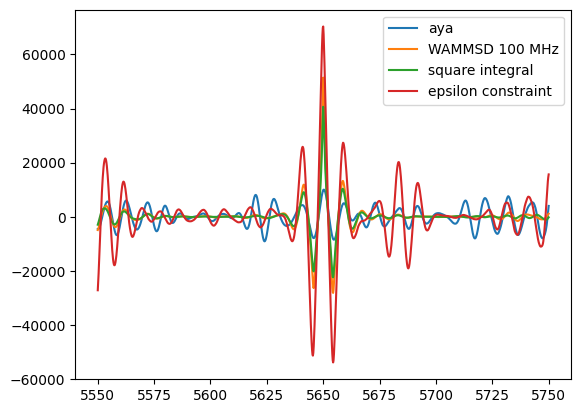

In [ ]:
template_spectra = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/071026/01/template_spectra.npy')
state_aya = np.where(bank_1_info['phi'].between(70, 115), 0, 1)
state_070526_01 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070526/01/best_state.npy') # WAMMSD 100 MHz
state_070726_01 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070726/01/best_state.npy') # Square integral
state_070826_02 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070826/02/best_state.npy') # Epsilon constraint

default_colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

inj_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/norm_1e30_5650_tests/injected'
uninj_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/norm_1e30_5650_tests/uninjected'
xs = np.load(os.path.join(inj_dir, files[0]))[0]
inj_spectra = np.array([np.load(os.path.join(inj_dir, file))[1] for file in files])
uninj_spectra = np.array([np.load(os.path.join(uninj_dir, file))[1] for file in files])

inner_all_mask = bank_1_info['phi'] < 90

fig, ax = plt.subplots()

states = [state_aya, state_070526_01, state_070726_01, state_070826_02]
labels = ['aya', 'WAMMSD 100 MHz', 'square integral', 'epsilon constraint']

for state, label, color in zip(states, labels, default_colors):
    asymmetry_inj = build_asymmetry(inj_spectra, state)
    template = build_asymmetry(template_spectra, state)
    corr_inj = correlate_asymmetry(xs, asymmetry_inj, template)
    ax.plot(xs, corr_inj, label=label)
ax.legend()

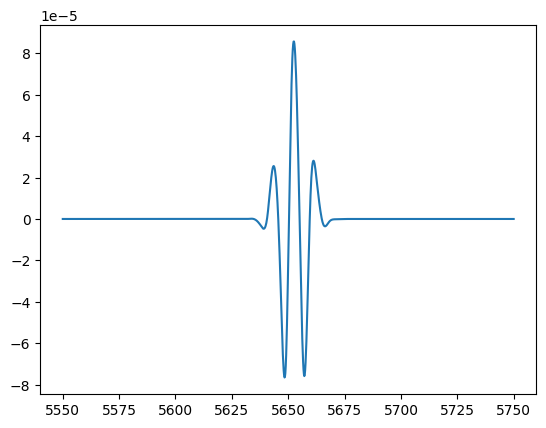

In [17]:
template_smooth = make_interp_spline(xs[::15], template[::15], k=3)(xs)
plt.plot(xs, template_smooth)

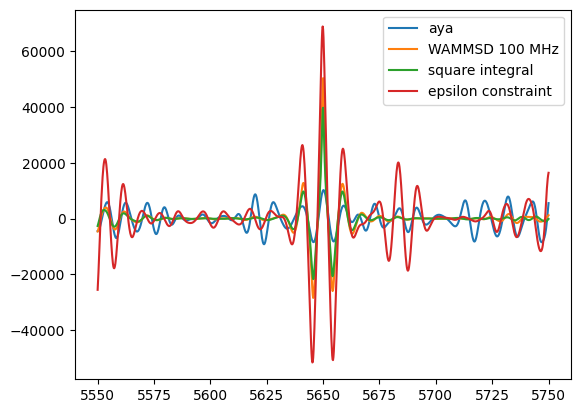

In [ ]:
template_spectra = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/071026/01/template_spectra.npy')
state_aya = np.where(bank_1_info['phi'].between(70, 115), 0, 1)
state_070526_01 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070526/01/best_state.npy') # WAMMSD 100 MHz
state_070726_01 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070726/01/best_state.npy') # Square integral
state_070826_02 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070826/02/best_state.npy') # Epsilon constraint

default_colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

inj_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/norm_1e30_5650_tests/injected'
uninj_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/norm_1e30_5650_tests/uninjected'
xs = np.load(os.path.join(inj_dir, files[0]))[0]
inj_spectra = np.array([np.load(os.path.join(inj_dir, file))[1] for file in files])
uninj_spectra = np.array([np.load(os.path.join(uninj_dir, file))[1] for file in files])

inner_all_mask = bank_1_info['phi'] < 90

fig, ax = plt.subplots()

states = [state_aya, state_070526_01, state_070726_01, state_070826_02]
labels = ['aya', 'WAMMSD 100 MHz', 'square integral', 'epsilon constraint']

for state, label, color in zip(states, labels, default_colors):
    asymmetry_inj = build_asymmetry(inj_spectra, state)
    template = build_asymmetry(template_spectra, state)
    template_smooth = make_interp_spline(xs[::15], template[::15], k=3)(xs)
    corr_inj = correlate_asymmetry(xs, asymmetry_inj, template_smooth)
    ax.plot(xs, corr_inj, label=label)
ax.legend()

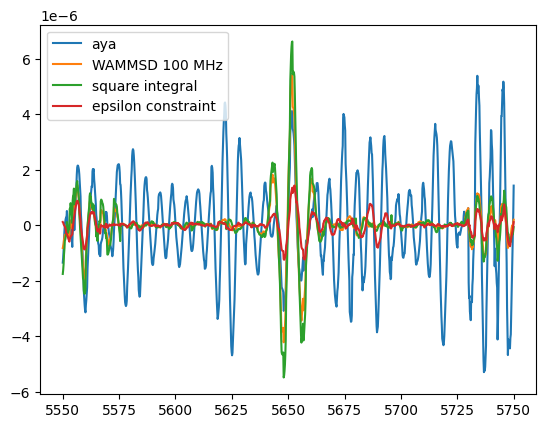

In [ ]:
template_spectra = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/071026/01/template_spectra.npy')
state_aya = np.where(bank_1_info['phi'].between(70, 115), 0, 1)
state_070526_01 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070526/01/best_state.npy') # WAMMSD 100 MHz
state_070726_01 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070726/01/best_state.npy') # Square integral
state_070826_02 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070826/02/best_state.npy') # Epsilon constraint

default_colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

inj_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/norm_1e30_5650_tests/injected'
uninj_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/norm_1e30_5650_tests/uninjected'
xs = np.load(os.path.join(inj_dir, files[0]))[0]
inj_spectra = np.array([np.load(os.path.join(inj_dir, file))[1] for file in files])
uninj_spectra = np.array([np.load(os.path.join(uninj_dir, file))[1] for file in files])

inner_all_mask = bank_1_info['phi'] < 90

fig, ax = plt.subplots()

states = [state_aya, state_070526_01, state_070726_01, state_070826_02]
labels = ['aya', 'WAMMSD 100 MHz', 'square integral', 'epsilon constraint']

for state, label, color in zip(states, labels, default_colors):
    asymmetry_inj = build_asymmetry(inj_spectra, state)
    ax.plot(xs, asymmetry_inj, label=label)
ax.legend()

Text(0.5, 0.98, '070726/01')

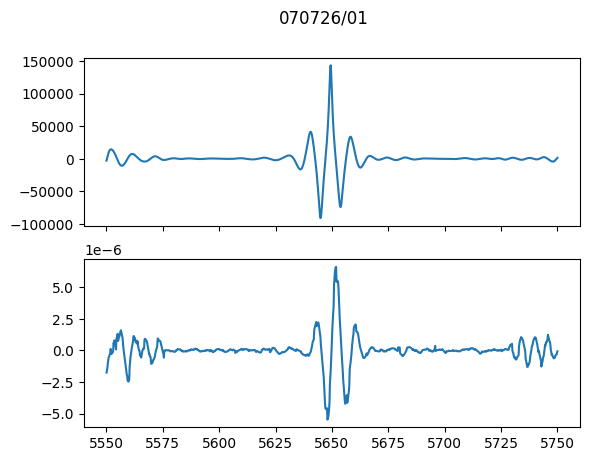

In [29]:
asymmetry_inj = build_asymmetry(inj_spectra, state_070726_01)
corr_inj = correlate_asymmetry(xs, asymmetry_inj, template_smooth)

fig, axs = plt.subplots(2, 1, sharex=True)
axs[0].plot(xs, corr_inj)
axs[1].plot(xs, asymmetry_inj)
fig.suptitle('070726/01')

## New std calculation (blanking out center freqs in each window)...

In [ ]:
30 / 0.18

166.66666666666669

In [63]:
def get_pvals_cont(corr):
    stds = []
    inds = np.arange(len(corr))
    for i in inds:
        mask = np.where((np.abs(i-inds) > 40) & (np.abs(i-inds) < 140))
        stds.append(np.std(corr[mask]))
    
    sigmas = corr / stds
    pvals = list(map(lambda sigma: .5*math.erfc(sigma/np.sqrt(2)), sigmas))
    return pvals

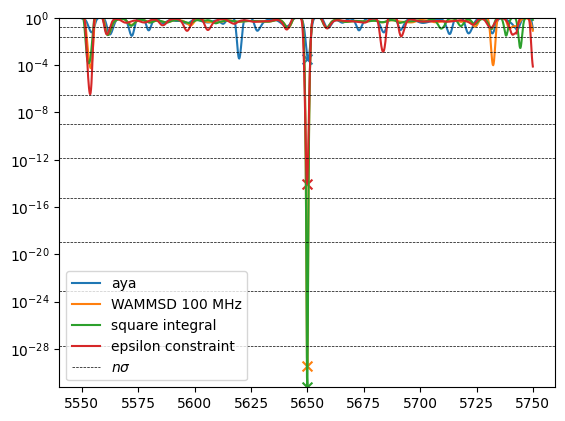

In [ ]:
template_spectra = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/071026/01/template_spectra.npy')
state_aya = np.where(bank_1_info['phi'].between(70, 115), 0, 1)
state_070526_01 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070526/01/best_state.npy') # WAMMSD 100 MHz
state_070726_01 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070726/01/best_state.npy') # Square integral
state_070826_02 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070826/02/best_state.npy') # Epsilon constraint

default_colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

inj_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/norm_1e30_5650_tests/injected'
uninj_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/norm_1e30_5650_tests/uninjected'
xs = np.load(os.path.join(inj_dir, files[0]))[0]
inj_spectra = np.array([np.load(os.path.join(inj_dir, file))[1] for file in files])
uninj_spectra = np.array([np.load(os.path.join(uninj_dir, file))[1] for file in files])

inner_all_mask = bank_1_info['phi'] < 90

fig, ax = plt.subplots()

states = [state_aya, state_070526_01, state_070726_01, state_070826_02]
labels = ['aya', 'WAMMSD 100 MHz', 'square integral', 'epsilon constraint']

min_pval = 1

for state, label, color in zip(states, labels, default_colors):
    #asymmetry_uninj = build_asymmetry(uninj_spectra, state)
    asymmetry_inj = build_asymmetry(inj_spectra, state)
    template = build_asymmetry(template_spectra, state)
    template_smooth = make_interp_spline(xs[::15], template[::15], k=3)(xs)    
    #corr_uninj = correlate_asymmetry(xs, asymmetry_uninj, template_smooth)
    corr_inj = correlate_asymmetry(xs, asymmetry_inj, template_smooth)
    pvals = get_pvals_cont(corr_inj)
    ax.plot(xs, pvals, label=label)
    if min(pvals) < min_pval:
        min_pval = min(pvals)
    ax.scatter(5650, min(pvals), marker='x', s=50, color=color)

i = 0
while .5*math.erfc((i+1)/np.sqrt(2)) > min_pval:
    label = '$n\sigma$' if not i else None
    ax.axhline(.5*math.erfc((i+1)/np.sqrt(2)), c='k', ls='--', lw=0.5, label=label)
    i += 1

ax.set_yscale('log')
ax.set_ylim(min_pval, 1)
ax.legend()

## Combined p-value

### 070726/01 (intensity) and 071026/02 (Doppler)

In [7]:
def build_asymmetry(specs, state, mask):
    inner = (state == 1) & mask
    outer = (state == 1) & ~mask

    # inner_mean, outer_mean = get_means(specs, inner, outer)
    inner_slice = specs[inner, :]
    outer_slice = specs[outer, :]
    inner_mean = np.mean(inner_slice, axis=0)
    outer_mean = np.mean(outer_slice, axis=0)
    
    asymmetry = (inner_mean - outer_mean) / (inner_mean + outer_mean)

    return asymmetry

In [8]:
def get_pvals_cont(inj, uninj):
    stds = []
    for i in range(len(uninj)):
        if i < 140:
            stds.append(np.std(uninj[:i+140]))
        elif i >= len(uninj) - 140:
            stds.append(np.std(uninj[i-140:]))
        else:
            stds.append(np.std(uninj[i-140:i+140]))
    
    sigmas = inj / stds
    pvals = list(map(lambda sigma: .5*math.erfc(sigma/np.sqrt(2)), sigmas))
    return pvals

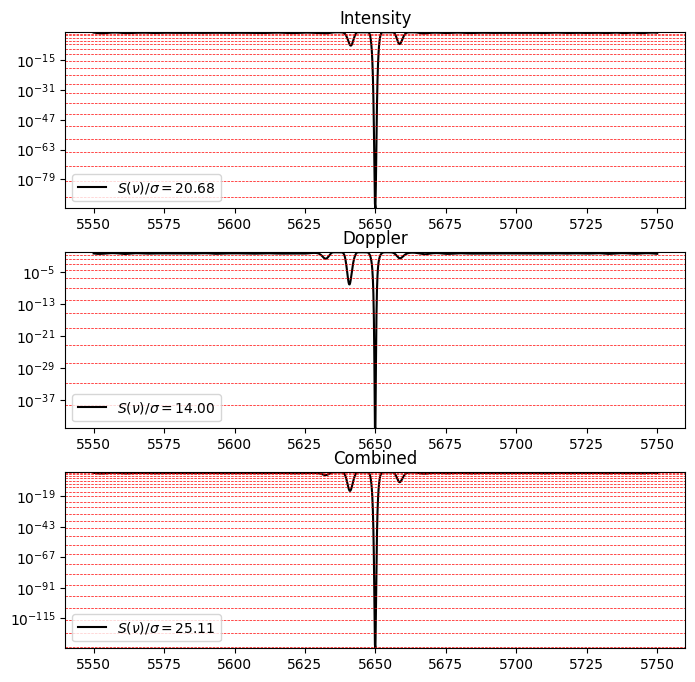

In [ ]:
from scipy.special import erfcinv

template_spectra = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/071026/01/template_spectra.npy')
state_aya = np.where(bank_1_info['phi'].between(70, 115), 0, 1)
state_070726_01 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070726/01/best_state.npy')
state_071026_02 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/071026/02/best_state.npy')

inj_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/norm_1e30_5650_tests/injected'
uninj_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/norm_1e30_5650_tests/uninjected'
xs = np.load(os.path.join(inj_dir, files[0]))[0]
inj_spectra = np.array([np.load(os.path.join(inj_dir, file))[1] for file in files])
uninj_spectra = np.array([np.load(os.path.join(uninj_dir, file))[1] for file in files])

int_mask = bank_1_info['phi'] < 90
dopp_mask = bank_1_info['theta'] < 90

fig, axs = plt.subplots(3, 1, figsize=(8,8))
fig.subplots_adjust(hspace=0.25)

asymmetry_uninj_int = build_asymmetry(uninj_spectra, state_070726_01, int_mask)
asymmetry_inj_int = build_asymmetry(inj_spectra, state_070726_01, int_mask)
template_int = build_asymmetry(template_spectra, state_070726_01, int_mask)
template_smooth_int = make_interp_spline(xs[::15], template_int[::15], k=3)(xs)

asymmetry_uninj_dopp = build_asymmetry(uninj_spectra, state_071026_02, dopp_mask)
asymmetry_inj_dopp = build_asymmetry(inj_spectra, state_071026_02, dopp_mask)
template_dopp = build_asymmetry(template_spectra, state_071026_02, dopp_mask)
template_smooth_dopp = make_interp_spline(xs[::15], template_dopp[::15], k=3)(xs)

corr_uninj_int = correlate_asymmetry(xs, asymmetry_uninj_int, template_smooth_int)
corr_inj_int = correlate_asymmetry(xs, asymmetry_inj_int, template_smooth_int)

corr_uninj_dopp = correlate_asymmetry(xs, asymmetry_uninj_dopp, template_smooth_dopp)
corr_inj_dopp = correlate_asymmetry(xs, asymmetry_inj_dopp, template_smooth_dopp)

pvals_int = get_pvals_cont(corr_inj_int, corr_uninj_int)
pvals_dopp = get_pvals_cont(corr_inj_dopp, corr_uninj_dopp)
pvals_comb = np.multiply(pvals_int, pvals_dopp)

for ax, pval, title in zip(axs, [pvals_int, pvals_dopp, pvals_comb], ['Intensity', 'Doppler', 'Combined']):
    sigmas = np.sqrt(2) * erfcinv(2 * min(pval))
    ax.plot(xs, pval, c='k', label=rf'$S(\nu)/\sigma={sigmas:.2f}$')
    ax.set_title(title)
    ax.legend()
    
    i = 0
    while .5*math.erfc((i+1)/np.sqrt(2)) > min(pval):
        label = '$n\sigma$' if not i else None
        ax.axhline(.5*math.erfc((i+1)/np.sqrt(2)), c='r', ls='--', lw=0.5, label=label)
        i += 1

    ax.set_yscale('log')
    ax.set_ylim(min(pval), 1)

### Same thing but 071126/01-02

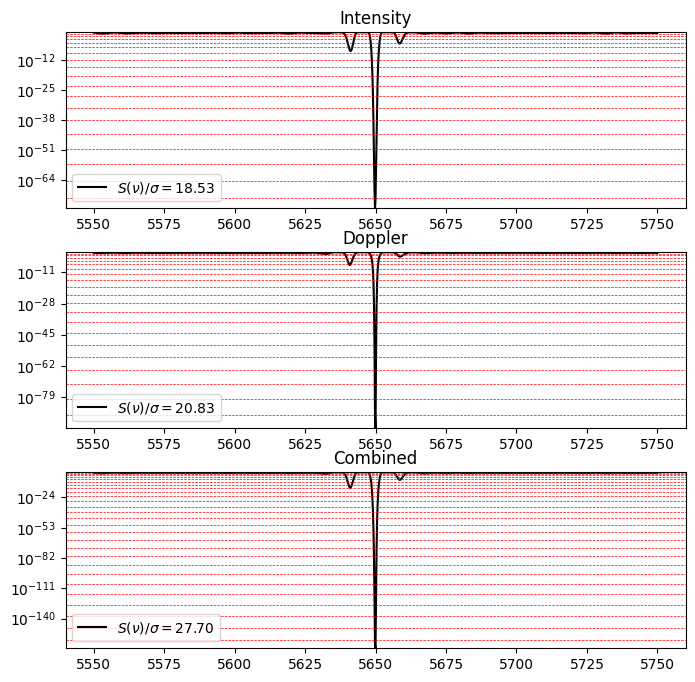

In [ ]:
from scipy.special import erfcinv

template_spectra = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/071026/01/template_spectra.npy')
state_aya = np.where(bank_1_info['phi'].between(70, 115), 0, 1)
state_071126_01 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/071126/01/best_state.npy')
state_071126_02 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/071126/02/best_state.npy')

inj_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/norm_1e30_5650_tests/injected'
uninj_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/norm_1e30_5650_tests/uninjected'
xs = np.load(os.path.join(inj_dir, files[0]))[0]
inj_spectra = np.array([np.load(os.path.join(inj_dir, file))[1] for file in files])
uninj_spectra = np.array([np.load(os.path.join(uninj_dir, file))[1] for file in files])

int_mask = bank_1_info['phi'] < 90
dopp_mask = bank_1_info['theta'] < 90

fig, axs = plt.subplots(3, 1, figsize=(8,8))
fig.subplots_adjust(hspace=0.25)

asymmetry_uninj_int = build_asymmetry(uninj_spectra, state_071126_01, int_mask)
asymmetry_inj_int = build_asymmetry(inj_spectra, state_071126_01, int_mask)
template_int = build_asymmetry(template_spectra, state_071126_01, int_mask)
template_smooth_int = make_interp_spline(xs[::15], template_int[::15], k=3)(xs)

asymmetry_uninj_dopp = build_asymmetry(uninj_spectra, state_071126_02, dopp_mask)
asymmetry_inj_dopp = build_asymmetry(inj_spectra, state_071126_02, dopp_mask)
template_dopp = build_asymmetry(template_spectra, state_071126_02, dopp_mask)
template_smooth_dopp = make_interp_spline(xs[::15], template_dopp[::15], k=3)(xs)

corr_uninj_int = correlate_asymmetry(xs, asymmetry_uninj_int, template_smooth_int)
corr_inj_int = correlate_asymmetry(xs, asymmetry_inj_int, template_smooth_int)

corr_uninj_dopp = correlate_asymmetry(xs, asymmetry_uninj_dopp, template_smooth_dopp)
corr_inj_dopp = correlate_asymmetry(xs, asymmetry_inj_dopp, template_smooth_dopp)

pvals_int = get_pvals_cont(corr_inj_int, corr_uninj_int)
pvals_dopp = get_pvals_cont(corr_inj_dopp, corr_uninj_dopp)
pvals_comb = np.multiply(pvals_int, pvals_dopp)

for ax, pval, title in zip(axs, [pvals_int, pvals_dopp, pvals_comb], ['Intensity', 'Doppler', 'Combined']):
    sigmas = np.sqrt(2) * erfcinv(2 * min(pval))
    ax.plot(xs, pval, c='k', label=rf'$S(\nu)/\sigma={sigmas:.2f}$')
    ax.set_title(title)
    ax.legend()
    
    i = 0
    while .5*math.erfc((i+1)/np.sqrt(2)) > min(pval):
        label = '$n\sigma$' if not i else None
        ax.axhline(.5*math.erfc((i+1)/np.sqrt(2)), c='r', ls='--', lw=0.5, label=label)
        i += 1

    ax.set_yscale('log')
    ax.set_ylim(min(pval), 1)

## Annihilation asymmetry - 070726/01

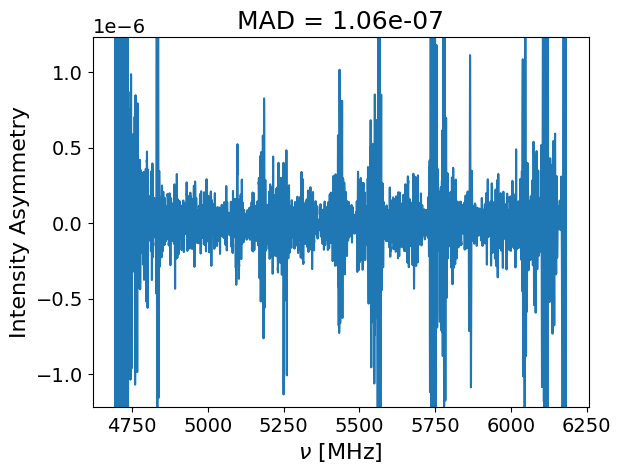

In [10]:
template_spectra = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/071026/01/template_spectra.npy')
state_aya = np.where(bank_1_info['phi'].between(70, 115), 0, 1)
state_070726_01 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/071126/01/best_state.npy')
#state_071026_02 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/071026/02/best_state.npy')

plt.rcParams.update({'font.size': 14, 'axes.labelsize': 14})

data_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01/ann/1'
xs = np.load(os.path.join(data_dir, files[0]))[0]
spectra = np.array([np.load(os.path.join(data_dir, file))[1] for file in files])

int_mask = bank_1_info['phi'] < 90
#dopp_mask = bank_1_info['theta'] < 90

asymmetry = build_asymmetry(spectra, state_070726_01, int_mask)
fig, ax = plt.subplots()
ax.plot(xs, asymmetry)
mad = scipy.stats.median_abs_deviation(asymmetry)
ax.set_title(f'MAD = {mad:.3g}', fontsize=18)
ax.set_xlabel(r'$\nu$ [MHz]', fontsize=16)
ax.set_ylabel('Intensity Asymmetry', fontsize=16)
ax.set_ylim(np.percentile(asymmetry, 2), np.percentile(asymmetry, 98))
fig.savefig('/home/bhanselman/bhanselman/images/annihilation_071126_01_bank_1.png', dpi=300, bbox_inches='tight')

# Method of incommensurable polynomials?!

In [175]:
info = pd.read_csv('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/all_cband_info.csv')
bank_1_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1'
bank_1_info = info[info['source'].apply(lambda l: l + '.npy').isin(os.listdir(bank_1_dir))]
files = bank_1_info['source'].apply(lambda l: l + '.npy')

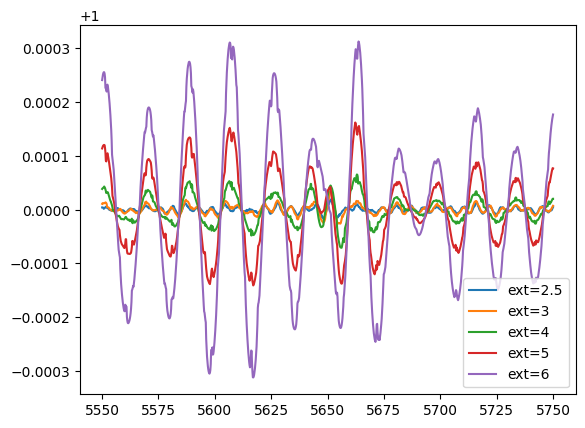

In [178]:
file = files[0]
data = inject_calibrated( #inject_calibrated_cband(
    file,
    5650,
    info,
    data_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1',
    #calibration_dir='/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/median_sefds/1',
    sefd=np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/median_sefds/1/median.npy')[1],
    signal_sizes=1e-29,
)

def multi_norm(exts):
    norm_all = []
    for ext in exts:
        norm = normalize_weighted(
            data,
            freq=5650,
            width=100,
            b=1,
            exterior=ext
        )
        xs = norm[0]
        plt.plot(*norm, label=f'ext={ext}')
        norm_all.append(norm[1])
    #norm_mean = np.mean(norm_all, axis=0)
    #plt.plot(xs, norm_mean, color='k', label='avg')
    plt.legend()

multi_norm([2.5,3,4,5,6])

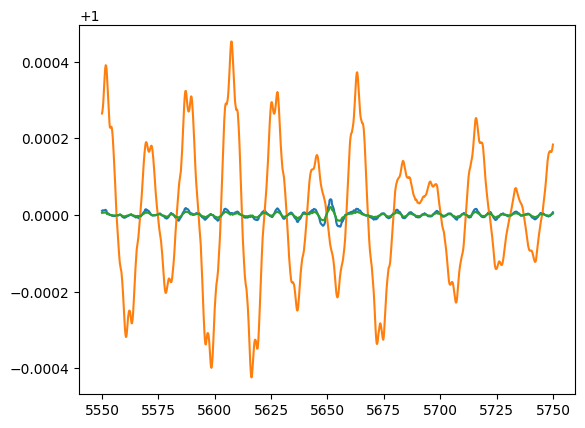

In [21]:
xs, norm1 = normalize_weighted(
    data,
    freq=5650,
    width=100,
    b=1,
    exterior=3
)
xs, norm2 = normalize_weighted(
    data,
    freq=5650,
    width=100,
    b=0.1,
    exterior=9
)
plt.plot(xs, norm1)
plt.plot(xs, norm2)
plt.plot(xs, (norm2 + norm1 / norm2)/2)

### What about the normalized gains in aggregate...?

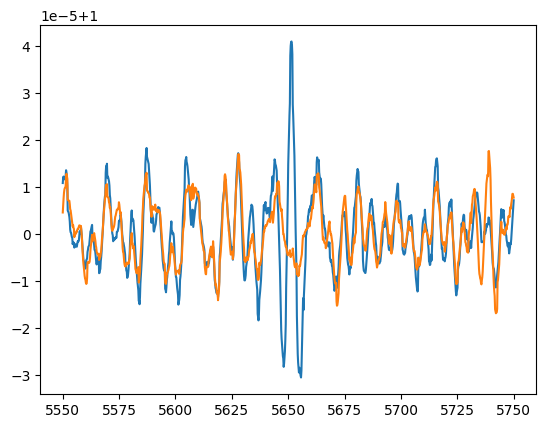

In [ ]:
norm_gain_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/normalized_gains/1'
xs_gain = np.load(os.path.join(norm_gain_dir, os.listdir(norm_gain_dir)[0]))[0]
xmin = np.argmin(np.abs(xs_gain - xs[0]))
xmax = np.argmin(np.abs(xs_gain - xs[-1]))
norm_gains = np.array([np.load(os.path.join(norm_gain_dir, file))[1, xmin:xmax+1] for file in os.listdir(norm_gain_dir)])
norm_gain_mean = np.mean(norm_gains, axis=0)
plt.plot(xs, norm1)
plt.plot(xs, norm_gain_mean)

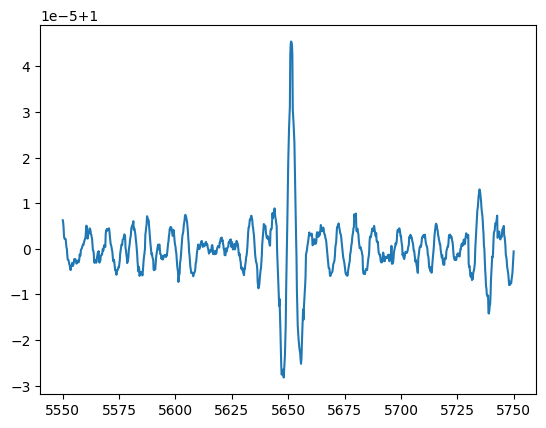

In [52]:
plt.plot(xs, norm1/norm_gain_mean)

In [ ]:
files = bank_1_info['source'].apply(lambda l: l + '.npy')
inj_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/norm_1e29_5650_tests/injected'
norm_spectra = np.array([np.load(os.path.join(inj_dir, file))[1] for file in files])
norm_spectra

array([[1.00001075, 1.00001196, 1.00001214, ..., 1.00000484, 1.000006  ,
        1.00000709],
       [1.00000164, 1.00000286, 1.00000331, ..., 1.0000044 , 1.00000584,
        1.000007  ],
       [1.00001081, 1.00001206, 1.00001172, ..., 1.00000649, 1.00000744,
        1.00000876],
       ...,
       [1.00000441, 1.00000493, 1.00000597, ..., 1.00000806, 1.00001493,
        1.00002169],
       [1.00000044, 1.00000498, 1.00000836, ..., 1.00001613, 1.00001572,
        1.0000151 ],
       [1.0000037 , 1.0000047 , 1.00000648, ..., 1.00000341, 1.00000905,
        1.00001467]])

In [54]:
norm_spectra / norm_gain_mean

array([[1.00000626, 1.00000576, 1.00000462, ..., 0.99999638, 0.99999793,
        0.99999943],
       [0.99999715, 0.99999666, 0.99999579, ..., 0.99999594, 0.99999778,
        0.99999934],
       [1.00000632, 1.00000587, 1.00000421, ..., 0.99999803, 0.99999937,
        1.00000111],
       ...,
       [0.99999992, 0.99999874, 0.99999845, ..., 0.9999996 , 1.00000686,
        1.00001403],
       [0.99999595, 0.99999879, 1.00000084, ..., 1.00000767, 1.00000766,
        1.00000745],
       [0.99999921, 0.99999851, 0.99999897, ..., 0.99999496, 1.00000098,
        1.00000701]])

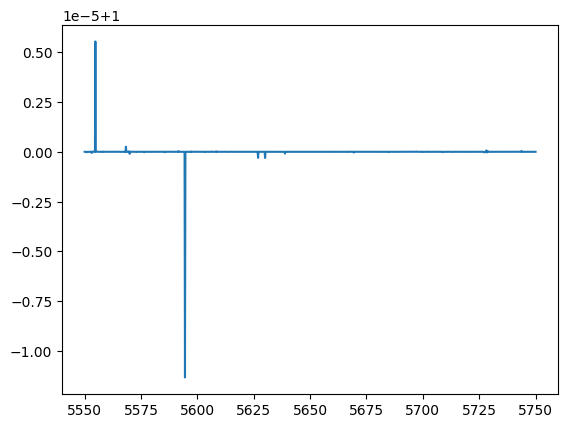

In [55]:
new_norm_spec = norm_spectra / norm_gain_mean
state_aya = np.where(bank_1_info['phi'].between(70, 115), 0, 1)

def build_asymmetry(specs, state):
    inner_all_mask = bank_1_info['phi'] < 90
    inner = (state == 1) & inner_all_mask
    outer = (state == 1) & ~inner_all_mask

    # inner_mean, outer_mean = get_means(specs, inner, outer)
    inner_slice = specs[inner, :]
    outer_slice = specs[outer, :]
    inner_mean = np.mean(inner_slice, axis=0)
    outer_mean = np.mean(outer_slice, axis=0)
    
    asymmetry = (inner_mean - outer_mean) / (inner_mean + outer_mean)

    return asymmetry

asym = build_asymmetry(norm_spectra, state_aya)
gain_norm_asym = build_asymmetry(new_norm_spec, state_aya)
#plt.plot(xs, asym)
#plt.plot(xs, gain_norm_asym)
plt.plot(xs, asym/gain_norm_asym)

No shit they're the same...

In [58]:
norm_gain_stds = np.std(norm_gains, axis=0)
norm_gain_stds

array([7.28844715e-06, 7.31003556e-06, 7.44844296e-06, ...,
       1.81809254e-05, 1.48379435e-05, 1.44269358e-05])

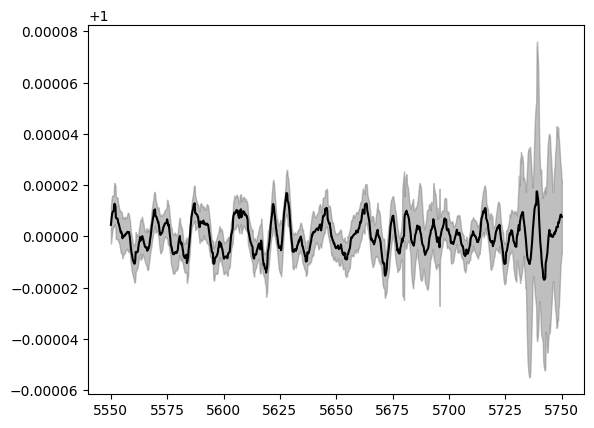

In [62]:
plt.plot(xs, norm_gain_mean, c='k')
plt.fill_between(xs, norm_gain_mean - norm_gain_stds, norm_gain_mean + norm_gain_stds, color='gray', alpha=0.5)

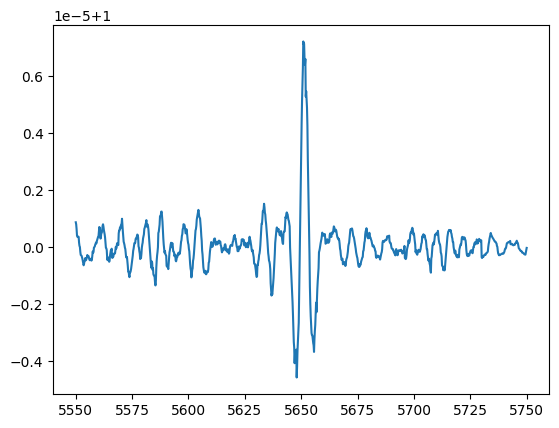

In [65]:
norm_standard = (norm1 - norm_gain_mean) / norm_gain_stds
norm_standard = 1e-6 * norm_standard + 1
plt.plot(xs, norm_standard)

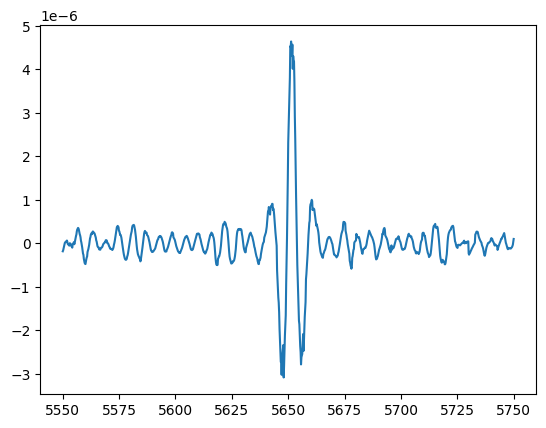

In [66]:
norm_all_standard = (norm_spectra - norm_gain_mean) / norm_gain_stds
norm_all_standard = 1e-6 * norm_all_standard + 1
gain_norm_asym = build_asymmetry(norm_all_standard, state_aya)
plt.plot(xs, gain_norm_asym)

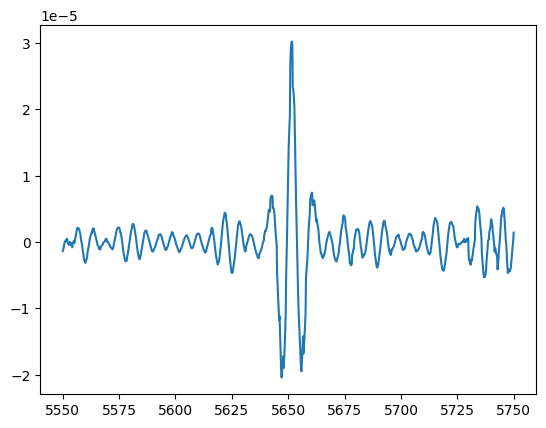

In [67]:
plt.plot(xs,asym)

# Optimized states - WAMMSD 100 MHz

In [ ]:
info = pd.read_csv('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/all_cband_info.csv')
bank_1_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1'
bank_1_info = info[info['source'].apply(lambda l: l + '.npy').isin(os.listdir(bank_1_dir))]
files = bank_1_info['source'].apply(lambda l: l + '.npy')

def sqrt_wammsd(asymmetry, width=100):
    '''Square root of weighted average moving median squared deviations. Window width is in MHz.'''
    _x = np.load(os.path.join(bank_1_dir, files[0]))[0]
    freq_diff = _x[1] - _x[0]
    half_width_bin = int(width / freq_diff) // 2

    # def msd(i):
    #     window = asymmetry[i-half_width_bin:i+half_width_bin]
    #     devs = np.abs(window) ** 2
    #     return np.median(devs)
    
    # Basic filter
    def filter(arr):
        length = len(arr)
        xs = np.arange(length)
        filt = np.zeros(length)
        for i, x in enumerate(xs):
            if x < (length / 8):
                filt[i] = 8 * x / length
            elif x > (7 * length / 8):
                filt[i] = 8 * (1 - x / length)
            else:
                filt[i] = 1
        return filt
    
    #msds = list(map(msd, range(500, len(asymmetry)-500)))
    inds = range(half_width_bin, len(asymmetry)-half_width_bin)
    msds = np.zeros(len(inds))
    for i in inds:
        window = asymmetry[i-half_width_bin:i+half_width_bin]
        devs = np.abs(window) ** 2
        msds[i-half_width_bin] = np.median(devs)

    filt = filter(msds)
    wammsd = np.average(msds, weights=filt)
    return inds, msds, wammsd

1.8578310732757423e-14


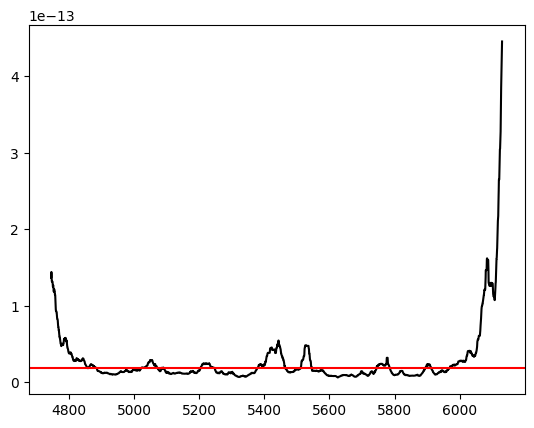

In [ ]:
asymmetry_070726_01 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070726/01/best_asymmetry.npy')
inds, msds, wammsd = sqrt_wammsd(asymmetry_070726_01)
xs = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01/decay/1/HIP11.npy')[0][inds]
plt.plot(xs, msds, c='k')
plt.axhline(wammsd, c='r')
print(wammsd)

4.6035079078138706e-14


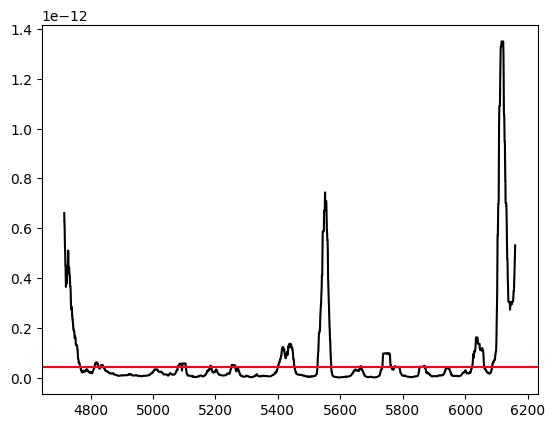

In [ ]:
# 40 MHz
inds, msds, wammsd = sqrt_wammsd(asymmetry_070726_01, width=40)
xs = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01/decay/1/HIP11.npy')[0][inds]
plt.plot(xs, msds, c='k')
plt.axhline(wammsd, c='r')
print(wammsd)

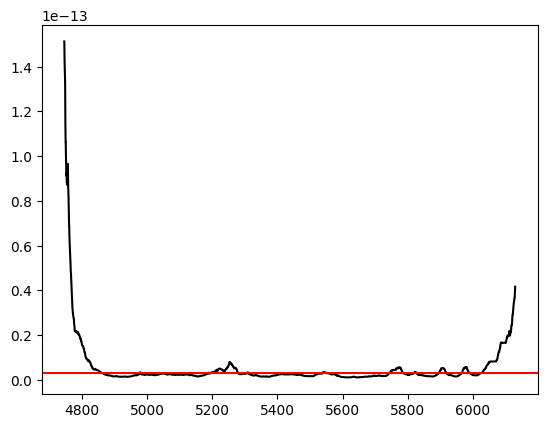

In [ ]:
asymmetry_071026_02 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/071026/02/best_asymmetry.npy')
inds, msds, wammsd = sqrt_wammsd(asymmetry_071026_02)
xs = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01/decay/1/HIP11.npy')[0][inds]
plt.plot(xs, msds, c='k')
plt.axhline(wammsd, c='r')

## RSS of MMADs

In [22]:
def rss_mmsds(asymmetry, width=100):
    '''Average of moving median absolute deviations. Window width is in MHz.'''
    _x = np.load(os.path.join(bank_1_dir, files[0]))[0]
    freq_diff = _x[1] - _x[0]
    half_width_bin = int(width / freq_diff) // 2

    def msd_window(i):
        window = asymmetry[i-half_width_bin:i+half_width_bin]
        devs = np.abs(window) ** 2
        return np.median(devs)
    
    msds = list(map(msd_window, range(half_width_bin, len(asymmetry)-half_width_bin)))
    mean_msd = np.mean(msds)
    rss = np.mean(np.abs(msds - mean_msd))
    return rss

In [ ]:
asymmetry_070726_01 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070726/01/best_asymmetry.npy')
rss_mmsds(asymmetry_070726_01)

1.9817671090694115e-14

In [15]:
sqrt_wammsd(asymmetry_070726_01)[2]

1.8578310732757423e-14

Hmmm....

3.1154756900320597e-14


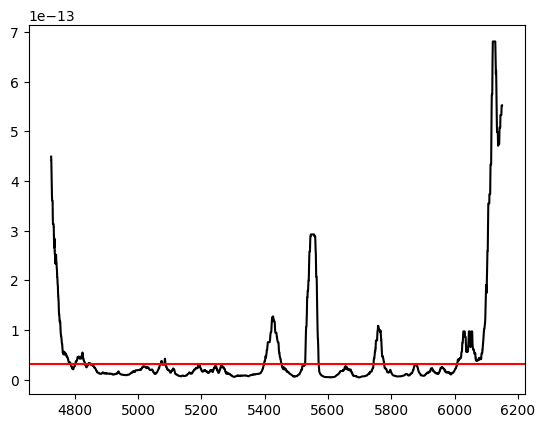

In [ ]:
# 60 MHz
inds, msds, wammsd = sqrt_wammsd(asymmetry_070726_01, width=60)
xs = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01/decay/1/HIP11.npy')[0][inds]
plt.plot(xs, msds, c='k')
plt.axhline(wammsd, c='r')
print(wammsd)

# Checking template width

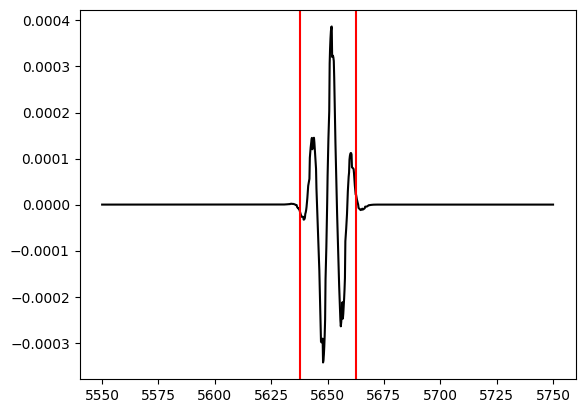

In [ ]:
state_070726_01 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/070726/01/best_state.npy') # Square integral
template_spectra = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/071026/01/template_spectra.npy')
inner_all_mask = bank_1_info['phi'] < 90

inj_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/norm_1e30_5650_tests/injected'
xs = np.load(os.path.join(inj_dir, files[0]))[0]

template = build_asymmetry(template_spectra, state_070726_01)
plt.plot(xs, template, c='k')

half_width = 12.40729549183864
plt.axvline(5650 + 12.40729549183864, c='r')
plt.axvline(5650 - 12.40729549183864, c='r')

In [37]:
12.40729549183864 * 4

49.62918196735456

# Covariance - doppler and intensity correlations

In [47]:
info = pd.read_csv('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/all_cband_info.csv')
bank_1_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1'
bank_1_info = info[info['source'].apply(lambda l: l + '.npy').isin(os.listdir(bank_1_dir))]
files = bank_1_info['source'].apply(lambda l: l + '.npy')

def build_asymmetry(specs, state, mask):
    inner = (state == 1) & mask
    outer = (state == 1) & ~mask

    # inner_mean, outer_mean = get_means(specs, inner, outer)
    inner_slice = specs[inner, :]
    outer_slice = specs[outer, :]
    inner_mean = np.mean(inner_slice, axis=0)
    outer_mean = np.mean(outer_slice, axis=0)
    
    asymmetry = (inner_mean - outer_mean) / (inner_mean + outer_mean)

    return asymmetry

def correlate_asymmetry(freqs, spectrum, template):
    def stretch_template(template, stretch_factor):
        if template.shape[0] % 2 == 0:
            template = template[1:] # Make the number of points odd
        k = template.shape[0] // 2
        orig_x = np.arange(-k, k+1)
        interp_func = interp1d(orig_x, template, bounds_error=False, fill_value=0)
        new_k = ((2*k + 1)/stretch_factor - 1)/2 # 2k_1 + 1 = sf*(2k_0 + 1)
        new_x = np.linspace(-new_k, new_k, template.shape[0])

        return interp_func(new_x)

    def get_a(target, template):
        return np.dot(target, template) / (np.dot(template, template) + 1e-12)
    
    a_vals = np.zeros_like(spectrum)
    residuals = np.zeros_like(spectrum)
    lower = (len(template) - 1) // 2
    upper = (len(template) + 1) // 2
    for i in range(len(spectrum)):
        stretched = stretch_template(template, freqs[i] / 5650)
        
        if i < lower:
            x = lower - i
            stretched = stretched[x:]
            window = spectrum[:i+upper]
        elif i > (len(spectrum) - upper):
            x = len(spectrum) - upper - i
            stretched = stretched[:x]
            window = spectrum[i-lower:]
        else:
            window = spectrum[i-lower:i+upper]
        
        a = get_a(window, stretched) 
        a_vals[i] = a 
        residuals[i] = np.sqrt(np.mean((a*stretched-window)**2)) 

    return a_vals / (residuals + 1e-12)

(5400.0, 5600.0)

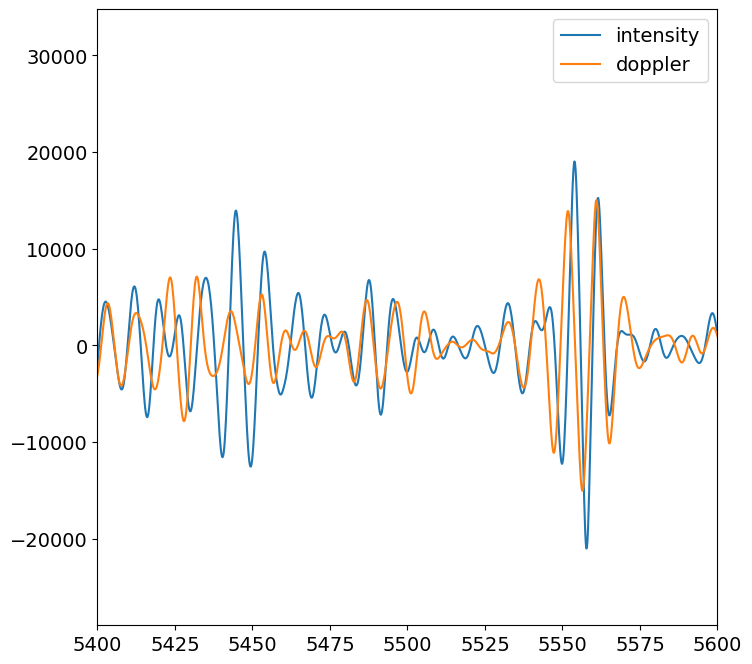

In [51]:
template_spectra = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/071026/01/template_spectra.npy')
state_aya = np.where(bank_1_info['phi'].between(70, 115), 0, 1)
state_070726_01 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/071626/03/best_state.npy')
state_071026_02 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/071626/04/best_state.npy')

inj_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/norm_1e30_5650_tests/injected'
uninj_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01/decay/1'
template_xs = np.load(os.path.join(inj_dir, files[0]))[0]
xs = np.load(os.path.join(uninj_dir, files[0]))[0]
uninj_spectra = np.array([np.load(os.path.join(uninj_dir, file))[1] for file in files])

int_mask = bank_1_info['phi'] < 90
dopp_mask = bank_1_info['theta'] < 90

fig, ax = plt.subplots(figsize=(8,8))

asymmetry_uninj_int = build_asymmetry(uninj_spectra, state_070726_01, int_mask)
template_int = build_asymmetry(template_spectra, state_070726_01, int_mask)
template_smooth_int = make_interp_spline(template_xs[::15], template_int[::15], k=3)(template_xs)

asymmetry_uninj_dopp = build_asymmetry(uninj_spectra, state_071026_02, dopp_mask)
template_dopp = build_asymmetry(template_spectra, state_071026_02, dopp_mask)
template_smooth_dopp = make_interp_spline(template_xs[::15], template_dopp[::15], k=3)(template_xs)

corr_uninj_int = correlate_asymmetry(xs, asymmetry_uninj_int, template_smooth_int)
corr_uninj_dopp = correlate_asymmetry(xs, asymmetry_uninj_dopp, template_smooth_dopp)

ax.plot(xs, corr_uninj_int, label='intensity')
ax.plot(xs, corr_uninj_dopp, label='doppler')
ax.legend()
ax.set_xlim(5400, 5600)

Text(0, 0.5, 'Doppler')

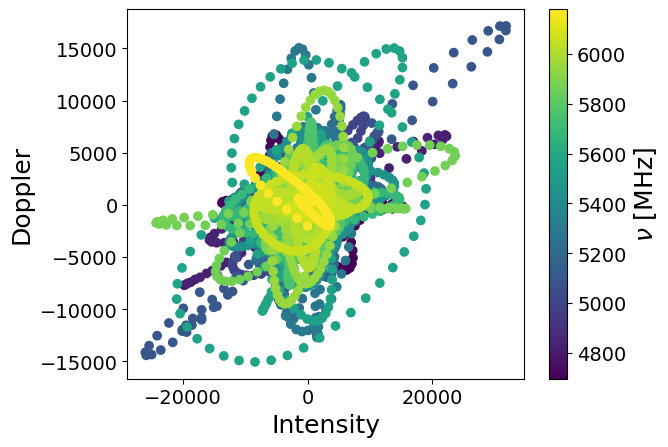

In [59]:
fig, ax = plt.subplots()
colors = xs
sc = ax.scatter(corr_uninj_int, corr_uninj_dopp, c=xs, vmin=min(xs), vmax=max(xs))
cbar = fig.colorbar(sc, ax=ax)
cbar.set_label(r'$\nu$ [MHz]', fontsize=18)
ax.set_xlabel('Intensity', fontsize=18)
ax.set_ylabel('Doppler', fontsize=18)

## Cross-correlation with noise

(5400.0, 5600.0)

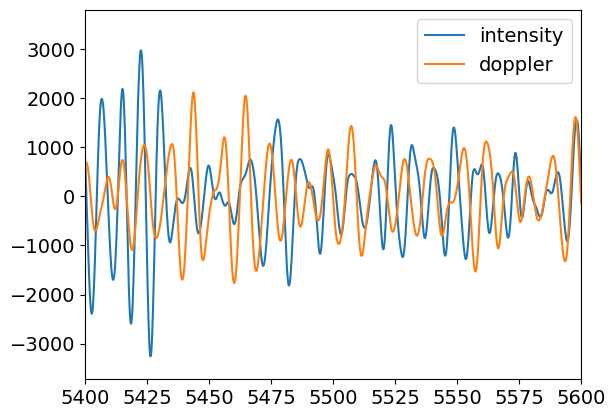

In [60]:
mock_asymmetry_dopp = np.random.normal(0, 1, len(xs))
mock_asymmetry_int = np.random.normal(0, 1, len(xs))

corr_uninj_int = correlate_asymmetry(xs, mock_asymmetry_int, template_smooth_int)
corr_uninj_dopp = correlate_asymmetry(xs, mock_asymmetry_dopp, template_smooth_dopp)

fig, ax = plt.subplots()
ax.plot(xs, corr_uninj_int, label='intensity')
ax.plot(xs, corr_uninj_dopp, label='doppler')
ax.legend()
ax.set_xlim(5400, 5600)

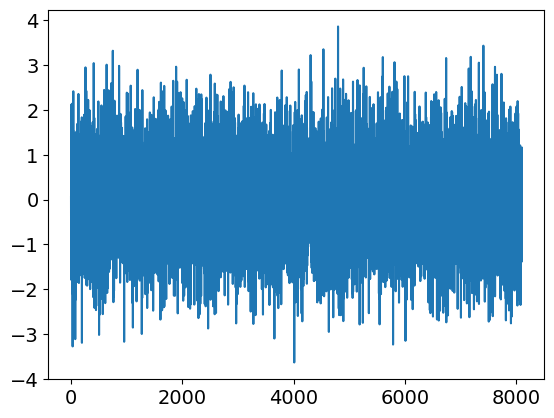

In [61]:
plt.plot(mock_asymmetry_dopp)

Text(0, 0.5, 'Doppler')

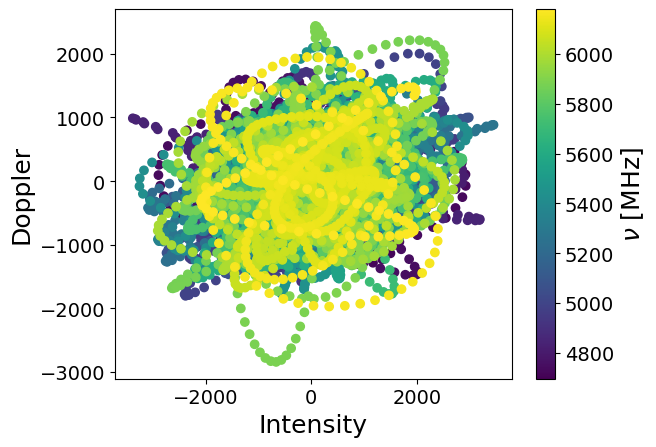

In [62]:
fig, ax = plt.subplots()
colors = xs
sc = ax.scatter(corr_uninj_int, corr_uninj_dopp, c=xs, vmin=min(xs), vmax=max(xs))
cbar = fig.colorbar(sc, ax=ax)
cbar.set_label(r'$\nu$ [MHz]', fontsize=18)
ax.set_xlabel('Intensity', fontsize=18)
ax.set_ylabel('Doppler', fontsize=18)

## Fisher's method

In [88]:
from scipy.stats import combine_pvalues

combine_pvalues([0.1, 0.001])[1]

0.001021034037197619

In [114]:
0.159**2

0.025281

In [113]:
combine_pvalues([0.159, 0.159])[1]

0.11825698814323544

(0.01, 1)

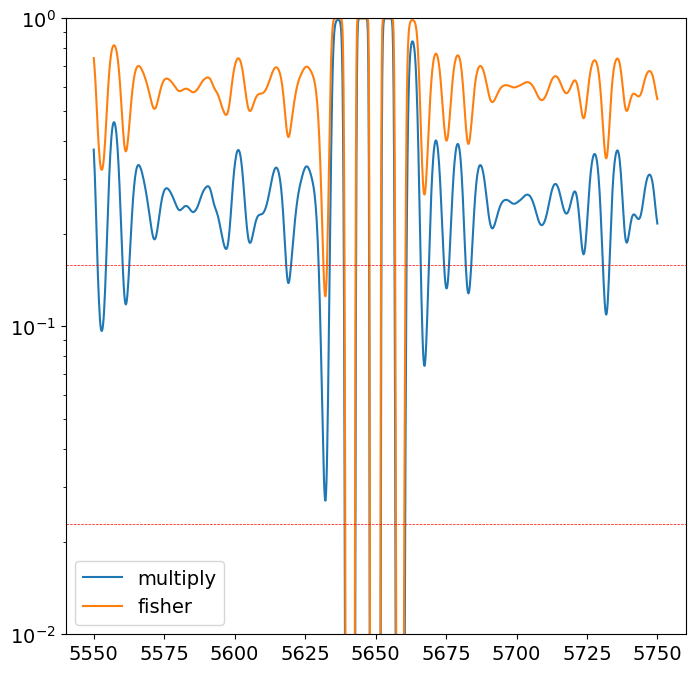

In [86]:
template_spectra = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/071026/01/template_spectra.npy')
state_aya = np.where(bank_1_info['phi'].between(70, 115), 0, 1)
state_071126_01 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/071126/01/best_state.npy')
state_071126_02 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/071126/02/best_state.npy')

inj_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/norm_1e30_5650_tests/injected'
uninj_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/norm_1e30_5650_tests/uninjected'
xs = np.load(os.path.join(inj_dir, files[0]))[0]
inj_spectra = np.array([np.load(os.path.join(inj_dir, file))[1] for file in files])
uninj_spectra = np.array([np.load(os.path.join(uninj_dir, file))[1] for file in files])

int_mask = bank_1_info['phi'] < 90
dopp_mask = bank_1_info['theta'] < 90

fig, ax = plt.subplots(figsize=(8,8))

asymmetry_uninj_int = build_asymmetry(uninj_spectra, state_071126_01, int_mask)
asymmetry_inj_int = build_asymmetry(inj_spectra, state_071126_01, int_mask)
template_int = build_asymmetry(template_spectra, state_071126_01, int_mask)
template_smooth_int = make_interp_spline(xs[::15], template_int[::15], k=3)(xs)

asymmetry_uninj_dopp = build_asymmetry(uninj_spectra, state_071126_02, dopp_mask)
asymmetry_inj_dopp = build_asymmetry(inj_spectra, state_071126_02, dopp_mask)
template_dopp = build_asymmetry(template_spectra, state_071126_02, dopp_mask)
template_smooth_dopp = make_interp_spline(xs[::15], template_dopp[::15], k=3)(xs)

corr_uninj_int = correlate_asymmetry(xs, asymmetry_uninj_int, template_smooth_int)
corr_inj_int = correlate_asymmetry(xs, asymmetry_inj_int, template_smooth_int)

corr_uninj_dopp = correlate_asymmetry(xs, asymmetry_uninj_dopp, template_smooth_dopp)
corr_inj_dopp = correlate_asymmetry(xs, asymmetry_inj_dopp, template_smooth_dopp)

pvals_int = get_pvals_cont(corr_inj_int, corr_uninj_int)
pvals_dopp = get_pvals_cont(corr_inj_dopp, corr_uninj_dopp)
pvals_comb = np.multiply(pvals_int, pvals_dopp)
pvals_fisher = np.array([combine_pvalues([pval_int, pval_dopp])[1] for pval_int, pval_dopp in zip(pvals_int, pvals_dopp)])

ax.plot(xs, pvals_comb, label='multiply')
ax.plot(xs, pvals_fisher, label='fisher')
ax.legend()

min_pval = min(min(pvals_comb), min(pvals_fisher))

i = 0
while .5*math.erfc((i+1)/np.sqrt(2)) > min_pval:
    label = '$n\sigma$' if not i else None
    ax.axhline(.5*math.erfc((i+1)/np.sqrt(2)), c='r', ls='--', lw=0.5, label=label)
    i += 1

ax.set_yscale('log')
ax.set_ylim(1e-2, 1)

# New asymmetry? I-O / mean of normalized gains

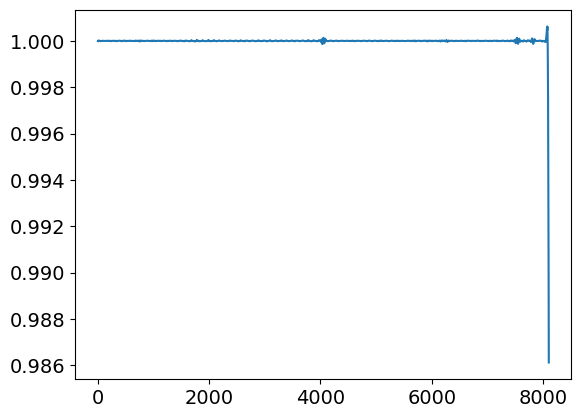

In [91]:
norm_gain_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/normalized_gains/1'
xs_gain = np.load(os.path.join(norm_gain_dir, os.listdir(norm_gain_dir)[0]))[0]
xmin = np.argmin(np.abs(xs_gain - xs[0]))
xmax = np.argmin(np.abs(xs_gain - xs[-1]))
norm_gains = np.array([np.load(os.path.join(norm_gain_dir, file))[1] for file in os.listdir(norm_gain_dir)])
norm_gain_mean = np.mean(norm_gains, axis=0)
plt.plot(norm_gain_mean)

In [92]:
def build_asymmetry_new(specs, state, mask):
    inner = (state == 1) & mask
    outer = (state == 1) & ~mask

    # inner_mean, outer_mean = get_means(specs, inner, outer)
    inner_slice = specs[inner, :]
    outer_slice = specs[outer, :]
    inner_mean = np.mean(inner_slice, axis=0)
    outer_mean = np.mean(outer_slice, axis=0)
    
    asymmetry = (inner_mean - outer_mean) / norm_gain_mean

    return asymmetry

(-1e-06, 1e-06)

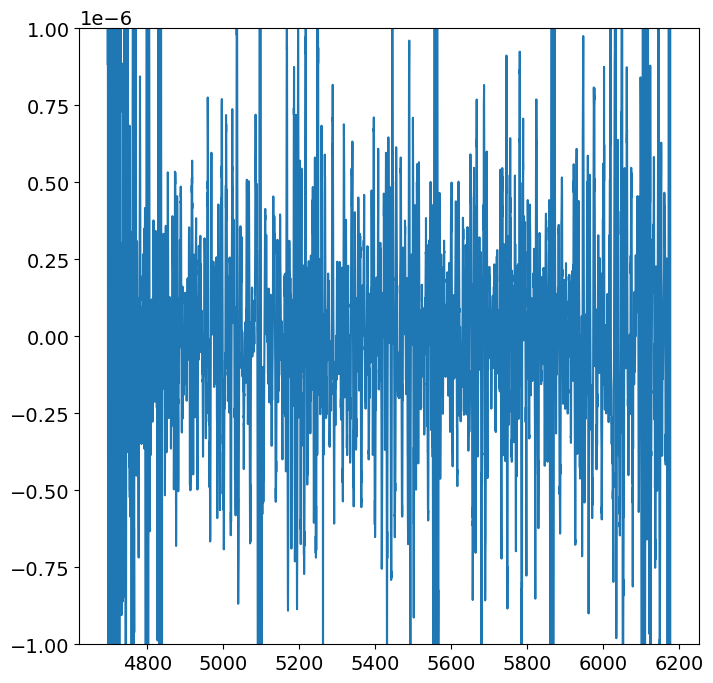

In [94]:
#state_aya = np.where(bank_1_info['phi'].between(70, 115), 0, 1)
state_070726_01 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/071626/03/best_state.npy')
#state_071026_02 = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/071626/04/best_state.npy')

#inj_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/norm_1e30_5650_tests/injected'
uninj_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/heatmap/052926_01/decay/1'
#template_xs = np.load(os.path.join(inj_dir, files[0]))[0]
xs = np.load(os.path.join(uninj_dir, files[0]))[0]
uninj_spectra = np.array([np.load(os.path.join(uninj_dir, file))[1] for file in files])

int_mask = bank_1_info['phi'] < 90
#dopp_mask = bank_1_info['theta'] < 90

fig, ax = plt.subplots(figsize=(8,8))

asymmetry_uninj_int = build_asymmetry_new(uninj_spectra, state_070726_01, int_mask)

ax.plot(xs, asymmetry_uninj_int)
ax.set_ylim(-1e-6, 1e-6)

(5400.0, 5600.0)

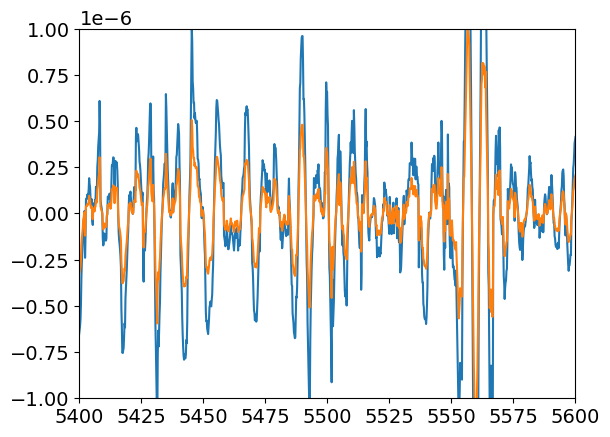

In [100]:
asymmetry_uninj_int_old = build_asymmetry(uninj_spectra, state_070726_01, int_mask)
fig, ax = plt.subplots()
ax.plot(xs, asymmetry_uninj_int)
ax.plot(xs, asymmetry_uninj_int_old)
ax.set_ylim(-1e-6, 1e-6)
ax.set_xlim(5400, 5600)

(5400.0, 5600.0)

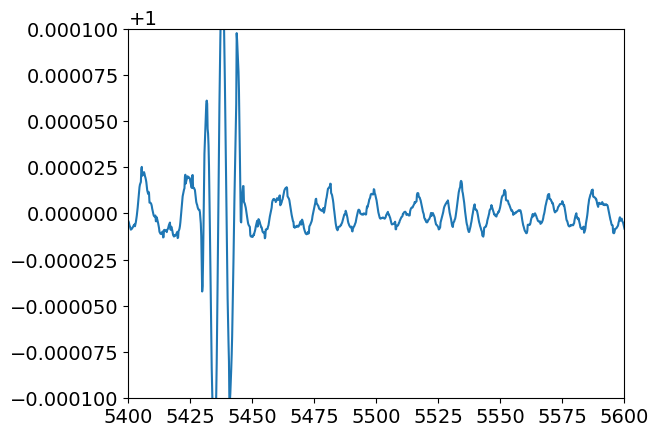

In [101]:
plt.plot(xs, norm_gain_mean)
plt.ylim(0.9999, 1.0001)
plt.xlim(5400, 5600)

In [108]:
def build_asymmetry_karl(specs, state, mask):
    inner = (state == 1) & mask
    outer = (state == 1) & ~mask
    all_mask = state == 1

    # inner_mean, outer_mean = get_means(specs, inner, outer)
    inner_slice = specs[inner, :]
    outer_slice = specs[outer, :]
    all_slice = specs[all_mask, :]
    all_mean = np.mean(all_slice, axis=0)
    inner_mean = np.mean(inner_slice / all_mean, axis=0)
    outer_mean = np.mean(outer_slice / all_mean, axis=0)
    
    asymmetry = (inner_mean - outer_mean) # / all_mean

    return asymmetry

(5400.0, 5600.0)

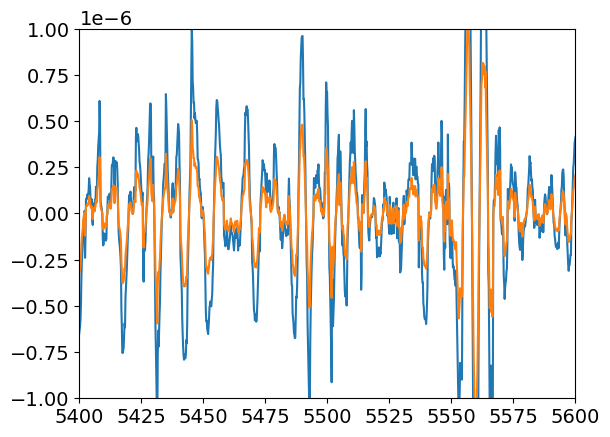

In [109]:
asymmetry_uninj_int_karl = build_asymmetry_karl(uninj_spectra, state_070726_01, int_mask)
fig, ax = plt.subplots()
ax.plot(xs, asymmetry_uninj_int_karl)
ax.plot(xs, asymmetry_uninj_int_old)
ax.set_ylim(-1e-6, 1e-6)
ax.set_xlim(5400, 5600)

# Multiply vs. fisher limit comparison

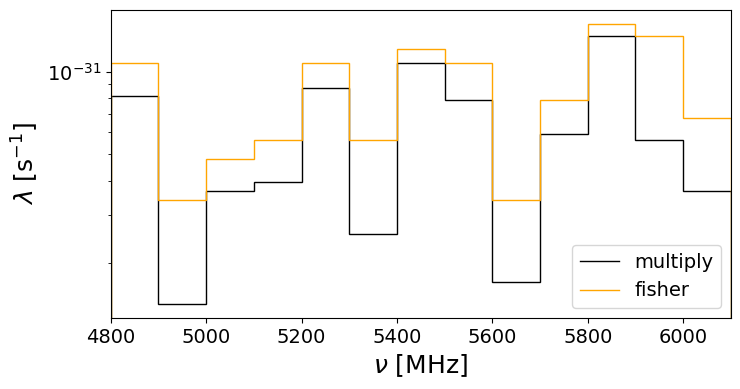

In [134]:
freqs, limits_multiply = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/analysis_tests/bank_1_071726_exp_decay/limits.npy')
freqs, limits_fisher = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/analysis_tests/bank_1_071826_exp_decay/limits.npy')

plot_freqs = np.arange(freqs[0]-50, freqs[-1]+100, 100)
fig, ax = plt.subplots(figsize=(8,4))
ax.stairs(limits_multiply, plot_freqs, color='k', label='multiply')
ax.stairs(limits_fisher, plot_freqs, color='orange', label='fisher')
ax.set_yscale('log')
ax.set_xlim(freqs[0]-50, freqs[-1]+50)
ax.legend()

ax.set_xlabel(r'$\nu$ [MHz]', fontsize=18)
ax.set_ylabel(r'$\lambda$ [s$^{-1}$]', fontsize=18)

fig.savefig('/home/bhanselman/bhanselman/images/limits_multiply_fisher_comparison.png', dpi=300, bbox_inches='tight')

In [136]:
limits_multiply.mean()

5.965144230769231e-32

(6075.0, 6100.0)

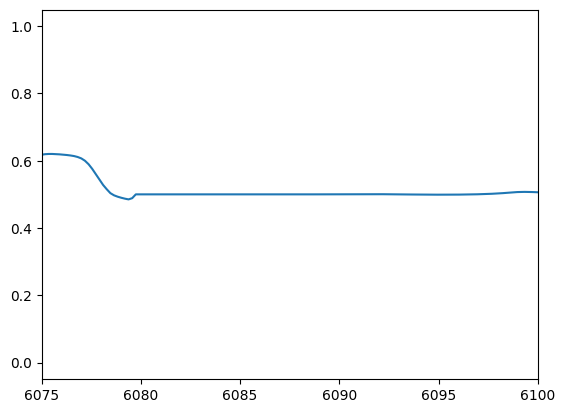

In [3]:
pvals = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/analysis_tests/bank_1_071826_exp_decay/pvals/uninj_int_pvals.npy')
plt.plot(*pvals)
plt.xlim(6075, 6100)

(-1e-06, 1e-06)

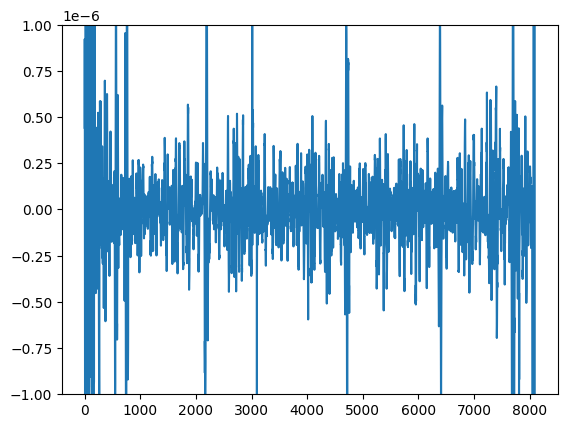

In [4]:
asym = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/071626/03/best_asymmetry.npy')
plt.plot(asym)
#plt.xlim(6075, 6100)
plt.ylim(-1e-6, 1e-6)

In [103]:
from scipy.interpolate import interp1d, make_interp_spline

def build_asymmetry(specs, state, mask): #template=False
    '''Form asymmetry from a given state.'''
    inner = (state == 1) & mask
    outer = (state == 1) & ~mask

    inner_slice = specs[inner, :]
    outer_slice = specs[outer, :]
    inner_mean = np.zeros(specs.shape[1])
    outer_mean = np.zeros(specs.shape[1])
    
    for j in range(specs.shape[1]):
        inner_mean[j] = inner_slice[:, j].mean()
        outer_mean[j] = outer_slice[:, j].mean()

    asymmetry = (inner_mean - outer_mean) / (inner_mean + outer_mean)
    
    return asymmetry

def correlate_asymmetry(freqs, spectrum, template):
    def stretch_template(template, stretch_factor):
        if template.shape[0] % 2 == 0:
            template = template[1:] # Make the number of points odd
        k = template.shape[0] // 2
        orig_x = np.arange(-k, k+1)
        interp_func = interp1d(orig_x, template, bounds_error=False, fill_value=0)
        new_k = ((2*k + 1)/stretch_factor - 1)/2 # 2k_1 + 1 = sf*(2k_0 + 1)
        new_x = np.linspace(-new_k, new_k, template.shape[0])

        return interp_func(new_x)

    def get_a(target, template):
        return np.dot(target, template) / (np.dot(template, template) + 1e-12)
    
    a_vals = np.zeros_like(spectrum)
    residuals = np.zeros_like(spectrum)
    lower = (len(template) - 1) // 2
    upper = (len(template) + 1) // 2
    for i in range(len(spectrum)):
        stretched = stretch_template(template, freqs[i] / 5650)
        
        if i < lower:
            x = lower - i
            stretched = stretched[x:]
            window = spectrum[:i+upper]
        elif i > (len(spectrum) - upper):
            x = len(spectrum) - upper - i
            stretched = stretched[:x]
            window = spectrum[i-lower:]
        else:
            window = spectrum[i-lower:i+upper]
        
        a = get_a(window, stretched) 
        a_vals[i] = a 
        residuals[i] = np.sqrt(np.mean((a*stretched-window)**2))

    return a_vals / (residuals + 1e-12)

info = pd.read_csv('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/all_cband_info.csv')
bank_1_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1'
bank_1_info = info[info['source'].apply(lambda l: l + '.npy').isin(os.listdir(bank_1_dir))]

# Optimized states
state_int_all = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/071626/03/best_state.npy')
state_dopp_all = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/071626/04/best_state.npy')
# Exclude the spectra appearing in neither state, and prepare states/masks for asymmetry formation
state_mask = (state_int_all == 1) | (state_dopp_all == 1)
targs = bank_1_info.loc[state_mask, 'source'].apply(lambda l: l + '.npy')
state_int, state_dopp = state_int_all[state_mask], state_dopp_all[state_mask]
int_mask = (bank_1_info.loc[state_mask, 'phi'] < 90).to_numpy()
dopp_mask = (bank_1_info.loc[state_mask, 'theta'] < 90).to_numpy()

uninj_norm_spectra = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/analysis_tests/bank_1_071826_exp_decay/uninj_norm_spectra.npy')
template_spectra = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/analysis_tests/bank_1_071826_exp_decay/template_spectra.npy')

uninjected_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/1'
xs = np.load(os.path.join(uninjected_dir, os.listdir(uninjected_dir)[0]))[0]

inj_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/target_selection/norm_1e29_5650_tests/injected'
template_xs = np.load(os.path.join(inj_dir, os.listdir(inj_dir)[0]))[0]

asymmetry_uninj_int = build_asymmetry(uninj_norm_spectra, state_int, int_mask)
template_int = build_asymmetry(template_spectra, state_int, int_mask)
template_smooth_int = make_interp_spline(template_xs[::15], template_int[::15], k=3)(template_xs)

asymmetry_uninj_dopp = build_asymmetry(uninj_norm_spectra, state_dopp, dopp_mask)
template_dopp = build_asymmetry(template_spectra, state_dopp, dopp_mask)
template_smooth_dopp = make_interp_spline(template_xs[::15], template_dopp[::15], k=3)(template_xs)

corr_uninj_int = correlate_asymmetry(xs, asymmetry_uninj_int, template_smooth_int)
corr_uninj_dopp = correlate_asymmetry(xs, asymmetry_uninj_dopp, template_smooth_dopp)

(-10.0, 10.0)

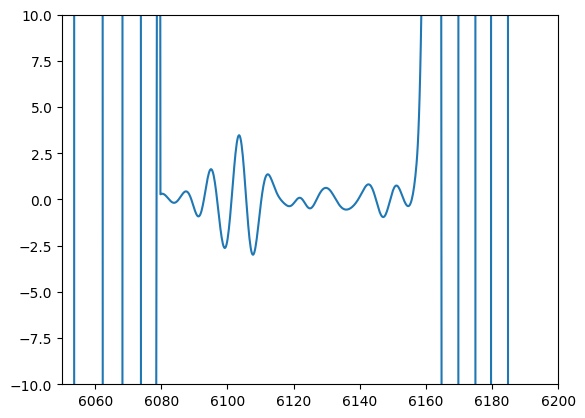

In [6]:
plt.plot(xs, corr_uninj_int)
plt.xlim(6050, 6200)
plt.ylim(-10, 10)

(-1e-06, 1e-06)

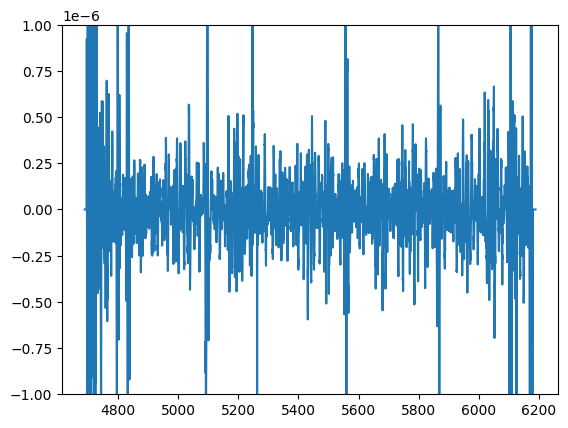

In [7]:
plt.plot(xs, asymmetry_uninj_int)
plt.ylim(-1e-6, 1e-6)

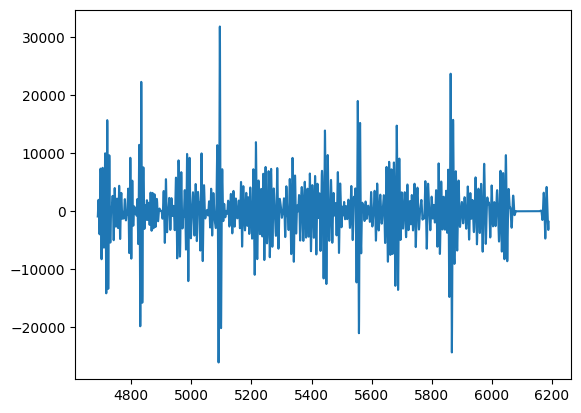

In [64]:
plt.plot(xs, corr_uninj_int)

(-0.01, 0.01)

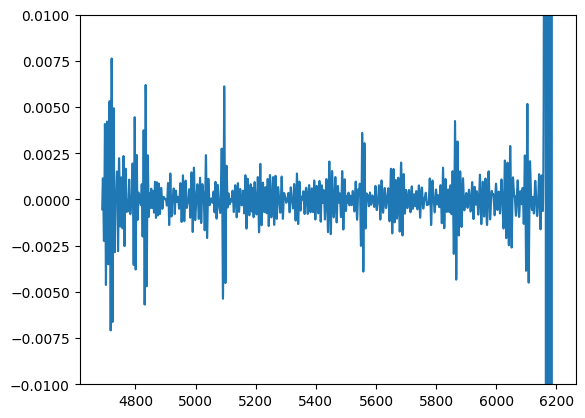

In [8]:
plt.plot(xs, a_vals_int)
plt.ylim(-1e-2, 1e-2)

(6050.0, 6200.0)

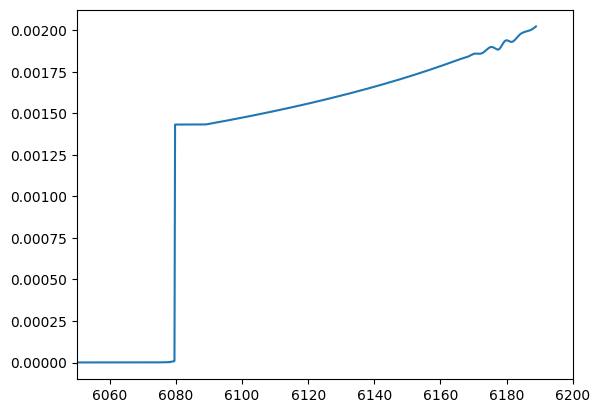

In [9]:
plt.plot(xs, residuals_int)
plt.xlim(6050, 6200)

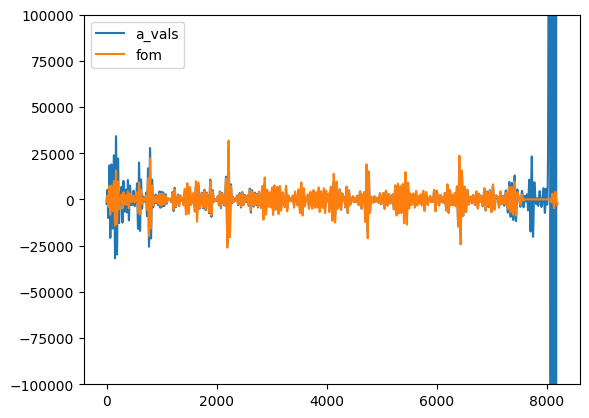

In [110]:
plt.plot(a_vals_int / np.median(residuals_int), label='a_vals')
plt.plot(corr_uninj_int, label='fom')
plt.ylim(-1e5, 1e5)
plt.legend()

In [48]:
xs[7646]

6089.08224105835

In [33]:
import matplotlib as mpl

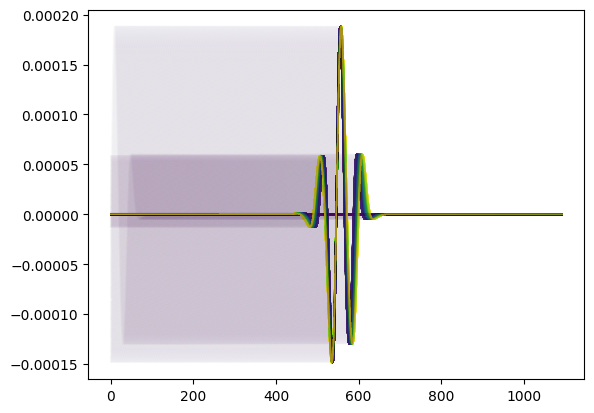

In [36]:
cmap = mpl.colormaps['viridis']
norm = mpl.colors.Normalize(vmin=0, vmax=len(stretched_int)-1)
for i in range(len(stretched_int)):
    plt.plot(stretched_int[i], c=cmap(norm(i)), alpha=0.01)

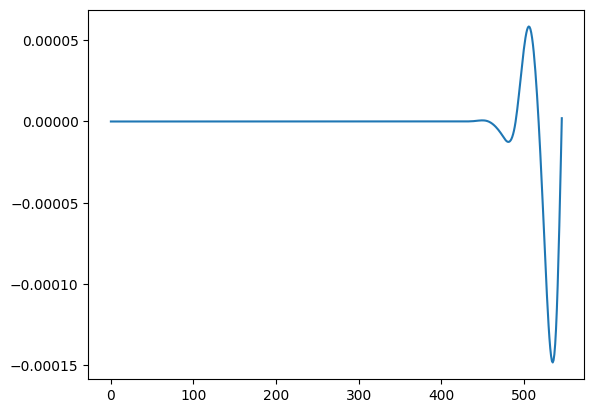

In [37]:
plt.plot(stretched_int[-1])

In [39]:
diffs = np.diff(residuals_int)
i = np.argmax(diffs)
i

7594

In [51]:
residuals_int[7595]

0.0014322197475785592

In [50]:
a_vals_int[7594]

0.0003673128288822201

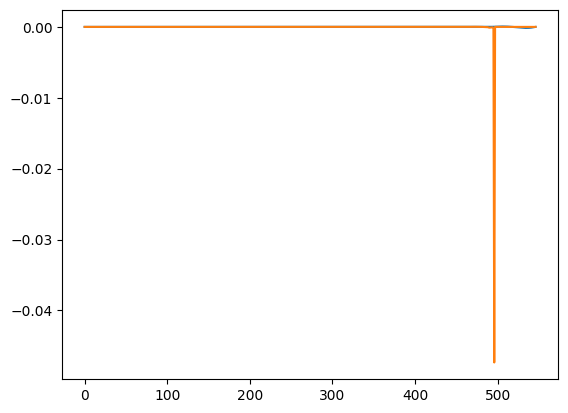

In [63]:
plt.plot(stretched_int[-1])
plt.plot(windows_int[-1])

(6177.5, 6182.5)

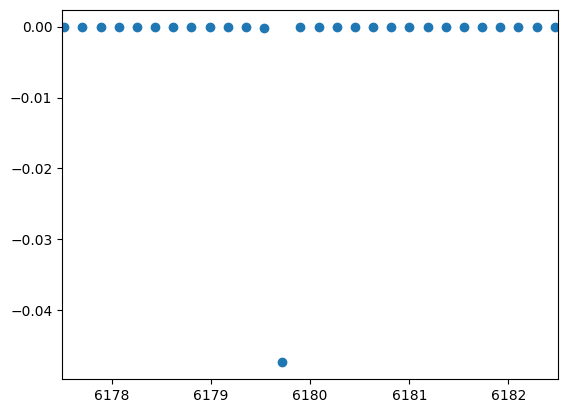

In [69]:
plt.scatter(xs, asymmetry_uninj_int)
plt.xlim(6177.5, 6182.5)

In [78]:
def sigma_filter(data, window_size=15):
    data = data.copy()
    for i in range(window_size//2, len(data)-window_size//2):
        window_data = data[i-window_size//2:i+window_size//2+1]
        median = np.median(window_data)
        std = np.std(window_data)
        if abs(data[i] - median) > 3 * std:
            data[i] = median
    return data

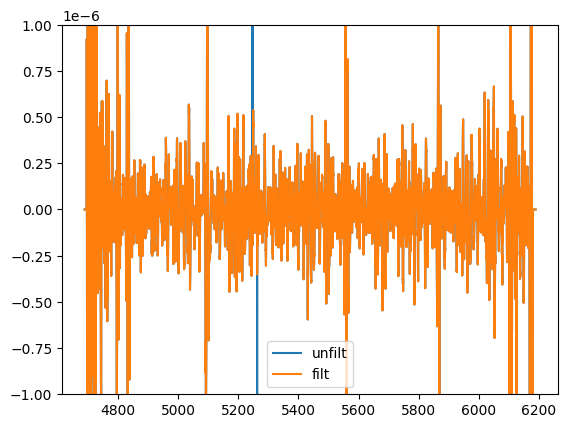

In [85]:
plt.plot(xs, asymmetry_uninj_int, label='unfilt')
plt.plot(xs, sigma_filter(asymmetry_uninj_int), label='filt')
plt.ylim(-1e-6, 1e-6)
plt.legend()

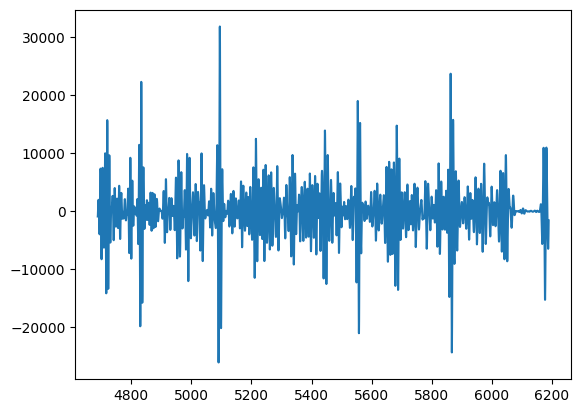

In [ ]:
plt.plot(xs, corr_uninj_int)

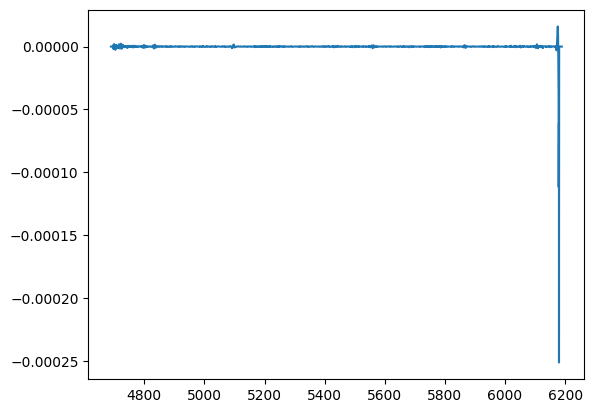

In [93]:
plt.plot(xs, asymmetry_uninj_int)

What about median filter

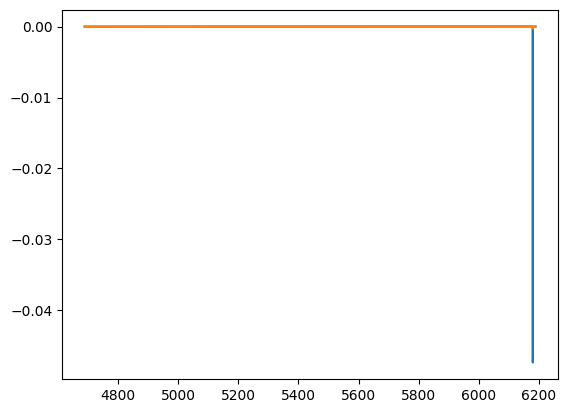

In [99]:
plt.plot(xs, asymmetry_uninj_int)
plt.plot(xs, medfilt(asymmetry_uninj_int, kernel_size=3))

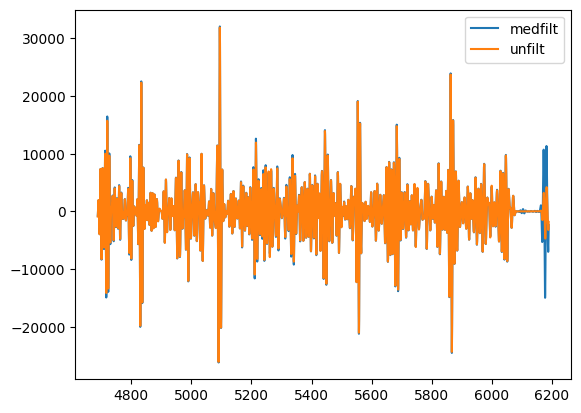

In [105]:
corr_uninj_int_med = correlate_asymmetry(xs, medfilt(asymmetry_uninj_int, kernel_size=3), template_smooth_int)
plt.plot(xs, corr_uninj_int_med, label='medfilt')
plt.plot(xs, corr_uninj_int, label='unfilt')
plt.legend()

In [131]:
def get_f(nu):
    kb = 1.38e-23
    h = 6.626e-34
    t_cmb = 2.725
    t_bkg = 1.19 * (1000 / nu) ** 2.62
    x_cmb = (h * nu * 1e6) / (kb * t_cmb)
    x_bkg = (h * nu * 1e6) / (kb * t_bkg)
    f_cmb = 1 / (np.exp(x_cmb) - 1)
    f_bkg = 1 / (np.exp(x_bkg) - 1)
    return f_cmb + f_bkg

In [132]:
get_f(4000)

13.69654664116094

In [145]:
def get_limit(xs, ys):
    xs, ys = np.array(xs), np.array(ys)
    xs_above = xs[ys > 3]
    xs_below = xs[ys < 3]
    if not (xs_above.size and xs_below.size):
        # Pick the value closest to the 3-sigma crossing
        return xs[np.argmin(np.abs(ys - 3))]
    above = np.where(xs == np.min(xs_above))[0][0]
    below = np.where(xs == np.max(xs_below))[0][0]
    print(xs_above, xs_below)
    print(xs[above], xs[below])
    # Linear interpolation
    return ((ys[below] - 3) * xs[above] - (ys[above] - 3) * xs[below]) / (ys[below] - ys[above])

[1.00000e-30 1.00000e-31 7.75000e-32 6.62500e-32 6.06250e-32 5.78125e-32] [1.0e-32 5.5e-32]
5.78125e-32 5.5e-32
5.620262917800873e-32


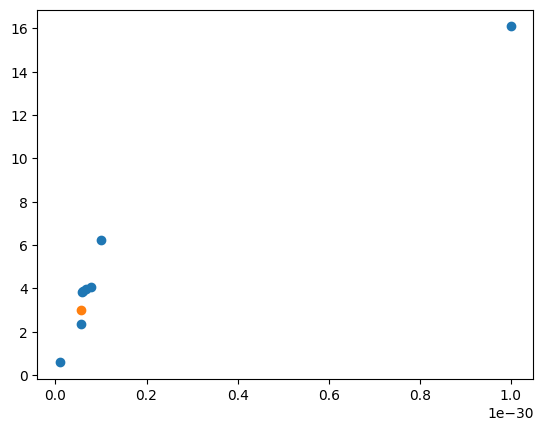

In [152]:
xs, ys = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/analysis_tests/bank_1_071826_exp_decay/5350_corrs.npy')
lim = get_limit(xs, ys)
plt.scatter(xs, ys)
plt.scatter(lim, 3)
print(lim)
plt.savefig('hey.png')

In [156]:
os.getcwd()

'/home/bhanselman/bhanselman/scripts'

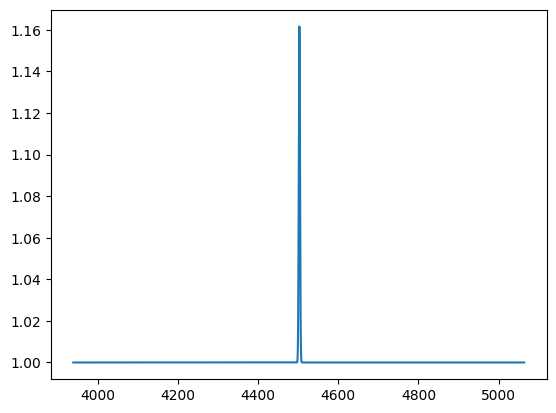

In [163]:
data_dir = '/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/data/preprocessed/0'
data = inject_calibrated(
    os.listdir(data_dir)[0],
    4500,
    pd.read_csv('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/all_cband_info.csv'),
    data_dir=data_dir,
    sefd=10,
    signal_sizes=1e-26, 
    is_decay=False,
    template=True
)
plt.plot(*data)

In [167]:
limits_all = np.load('/home/dataadmin/GBTData/SharedDataDirectory/cband_052726/analyses/072026/exclusion/decay/0/limits.npy')

In [172]:
spacing, step = 100, 10
plot_freqs = np.arange(limits_all[0,0]-step/2, limits_all[0,-1]+step, step)
plot_freqs

array([4005., 4015., 4025., 4035., 4045., 4055., 4065., 4075., 4085.,
       4095., 4105., 4115., 4125., 4135., 4145., 4155., 4165., 4175.,
       4185., 4195., 4205., 4215., 4225., 4235., 4245., 4255., 4265.,
       4275., 4285., 4295., 4305., 4315., 4325., 4335., 4345., 4355.,
       4365., 4375., 4385., 4395., 4405., 4415., 4425., 4435., 4445.,
       4455., 4465., 4475., 4485., 4495., 4505., 4515., 4525., 4535.,
       4545., 4555., 4565., 4575., 4585., 4595., 4605., 4615., 4625.,
       4635., 4645., 4655., 4665., 4675., 4685., 4695., 4705., 4715.,
       4725., 4735., 4745., 4755., 4765., 4775., 4785., 4795., 4805.,
       4815., 4825., 4835., 4845., 4855., 4865., 4875., 4885., 4895.,
       4905., 4915., 4925., 4935., 4945., 4955., 4965., 4975., 4985.])

In [173]:
limits_all[0]

array([4010., 4020., 4030., 4040., 4050., 4060., 4070., 4080., 4090.,
       4100., 4110., 4120., 4130., 4140., 4150., 4160., 4170., 4180.,
       4190., 4200., 4210., 4220., 4230., 4240., 4250., 4260., 4270.,
       4280., 4290., 4300., 4310., 4320., 4330., 4340., 4350., 4360.,
       4370., 4380., 4390., 4400., 4410., 4420., 4430., 4440., 4450.,
       4460., 4470., 4480., 4490., 4500., 4510., 4520., 4530., 4540.,
       4550., 4560., 4570., 4580., 4590., 4600., 4610., 4620., 4630.,
       4640., 4650., 4660., 4670., 4680., 4690., 4700., 4710., 4720.,
       4730., 4740., 4750., 4760., 4770., 4780., 4790., 4800., 4810.,
       4820., 4830., 4840., 4850., 4860., 4870., 4880., 4890., 4900.,
       4910., 4920., 4930., 4940., 4950., 4960., 4970., 4980.])

In [174]:
len(info)

3938